# Smoothing Using the Heat Equation
*Daniel McNulty II*

The heat equation is a parabolically shaped partial differential equation that describes the distribution of heat over time. This project explores how the heat equation known from physics can be used directly to smooth stock data.

Specifically, this project
- Tests the effect of changing the number of iterations (M) and kappa $\left( \kappa \right)$ on the output of the backward (implicit) method with Dirichlet boundary conditions code posted on Courseworks and in the project code from 2018.
- Shows the derivation of the Neumann boundary conditions, implements them for the backward (implicit) method, and tests the effects of changing the number of iterations (M) and kappa $\left( \kappa \right)$ on the implicit method with Neumann boundary condition code output.
- Visualizes the difference between the implicit method with Dirchlet and Neumann boundary condition stock price curves and examines the effects of changing the number of iterations (M) and kappa $\left( \kappa \right)$ on the difference between the Dirchlet and Neumann boundary condition stock price curves.

Then, within the appendices, this project looks at
- The implementation of the forward (explicit) method with Neumann boundary conditions and tests the effects of changing the number of iterations (M) and kappa $\left( \kappa \right)$ on its stability as well as compares the output of the implicit and explicit methods with Neumann boundary conditions.
- An attempt to implement the implicit method with Neumann boundary conditions using the method of sweeps utilized for the implicit method with Dirichlet boundary conditions code provided initially and the flaws in the current implementation.

## Loading Libraries and Setting Initial Parameters
Firstly, the different packages are imported.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import pandas as pd

Next, the following parameters are specified. The project is set to begin at a = 0 and end at b = 1. Kappa is initially set to 0.001 and T = 1. 

In [2]:
a = 0 # "start"
b = 1 # "end"

kappa = 0.001 # how much we let the extreme points affect the smoothing
T = 1 # the length of the simulation - for how long are we running the smoothing / how long will the simulation take

## Handling Stock Price Data

To test smoothing via. the heat equation on different initial conditions I use daily close price time series data from stocks and exchange rates. The initial condition is the stock price movement over time and this is then smoothed through the heat equation. One could use any type of time series data available. 

### Stock prices

The following stock prices are from June 17th 2019 to December 17th, 2019 (equivalent to approx. 129 trading days) and were imported form Yahoo Finance. These stock prices include:
- COSTCO Stock
- JC Penney Stock
- Apple Stock
- Tesla Stock
- Credit Suisse Stock

#### Importing stock prices:

In [3]:
# COSTCO STOCK
COST = pd.read_csv('COST.csv')

# JC PENNEY STOCK
JCP = pd.read_csv('JCP.csv')

# APPLE STOCK
AAPL = pd.read_csv('AAPL.csv')

# TESLA STOCK
TSLA = pd.read_csv('TSLA.csv')

# CREDIT SUISSE STOCK
CS = pd.read_csv('CS.csv')

#### Function to Reformat Stock Data for FDM Functions

In [4]:
def Stock(stock):
    u = np.array(stock.Close)
    x = np.arange(len(u))
    return x, u

## Implicit Method with Dirichlet Conditions

### Dirchlet Boundary Condition Code

#### Setting Up the Diagonals Function

We set up the diagonals with Dirichlet boundary conditions for the implicit finite difference scheme. We specify the value at the boundary points by forcing the two points outside the matrix to be 0 and the first and last point in the diagonal to be 1.

In [5]:
def setUpDirichletDiagonals(N, rho):
    
    # lower, diagonal, upper
    l = np.zeros((N,1))
    d = np.zeros((N,1))
    u = np.zeros((N,1))
    
    for i in range(N):
        l[i] = -rho
        d[i] = 1 + 2*rho
        u[i] = -rho
    
    # Dirichlet boundary contitions: 
    u[0] = 0  # first point in upper
    l[-2] = 0 # last point in lower
    d[0] = 1  # first point in diagonal
    d[-1] = 1 # last point in diagonal
    
    return l, d, u

#### Tri-Diagonal Solver for Implicit Scheme

Solves the system of equations that setUpDiagonals(N) gives us.

In [6]:
def diagSolver(l, d, u, b):
    
    N = len(d)
    lL, dD, uU, bB = map(np.array, (l, d, u, b)) # copy arrays
    for i in range(1, N):
        tmp = lL[i-1]/dD[i-1]
        dD[i] = dD[i] - tmp*uU[i-1] 
        bB[i] = bB[i] - tmp*bB[i-1]
       
    x = dD
    x[-1] = bB[-1]/dD[-1]
    
    for il in range(N-2, -1, -1):
        x[il] = (bB[il]-uU[il]*x[il+1])/dD[il]

    return x

#### Main Dirichlet Function

In [7]:
def Dirichlet(Stock_or_Rate, M, plot=True):
    # M = number of simulations/iterations - if M is large enough it will go very little ahead in time for each iteration
    
    x, u = Stock(Stock_or_Rate) # Stock Prices
    res = np.zeros((len(u), M)) # Initialize matrix res, which holds the vector of stock prices generated for each iteration
    u0 = u[0]
    uend = u[-1]

    N = len(u) # set N equal to the length of the u-vector

    dX = (b-a)/N # the distance between each closing price - i.e. time between daily closing prices
    dT = T/M # the distance in time between each iteration

    rho = kappa*dT/(dX*dX)

    lL, dD, uU = setUpDirichletDiagonals(N, rho) 
    
    if plot:
        plt.figure(figsize=(20,10))  
        plt.plot(x, u)

    for j in range(M):
        u[0]=u0
        u[-1]=uend
        u = diagSolver(lL, dD, uU, u)
        
        tmp = np.reshape(u, 129) # Shape the vector of stock prices generated for this iteration to (129,)
        res[:,j] = tmp # Store the vector of stock prices generated for this iteration in column j of matrix res
        
        if plot:
            plt.plot(x, u)
            plt.grid(True)
            plt.xlabel('$x$')
            plt.ylabel('$u(x,\tau$)')
    
    if plot:
        plt.show()
    
    return(res[:,M-1]) # Return the last column of matrix res (The vector of prices from the final iteration)

### Dirichlet Function Plot Output

#### COSTCO Stock

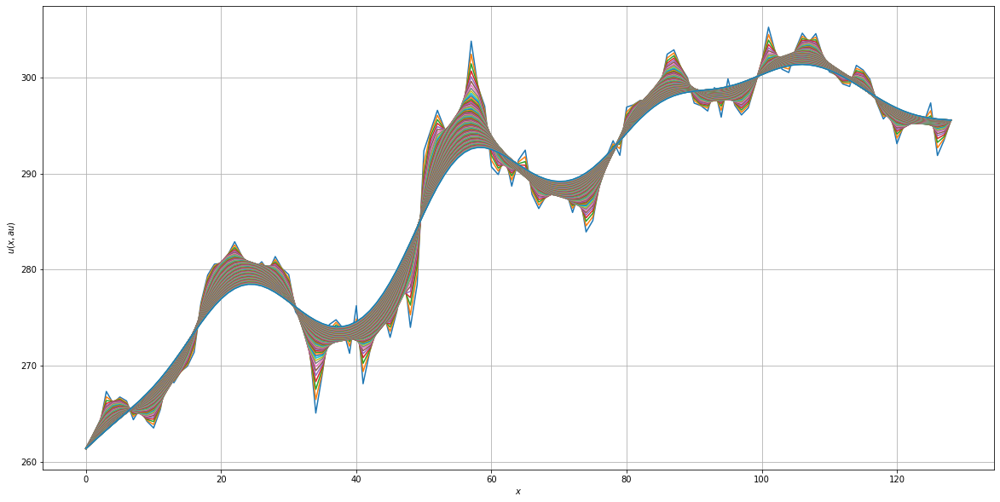

In [8]:
cd=Dirichlet(COST, 100)

#### JC Penney Stock

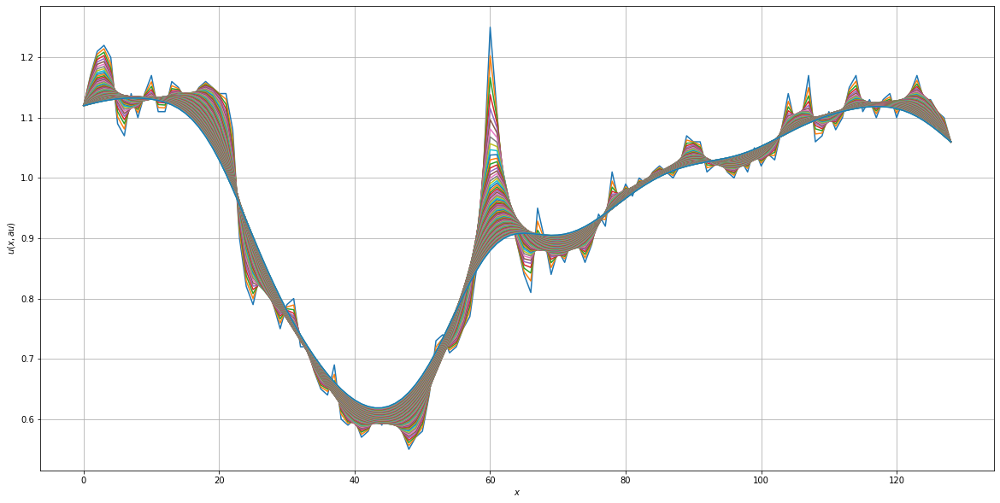

In [9]:
jd=Dirichlet(JCP, 100)

#### Apple Stock

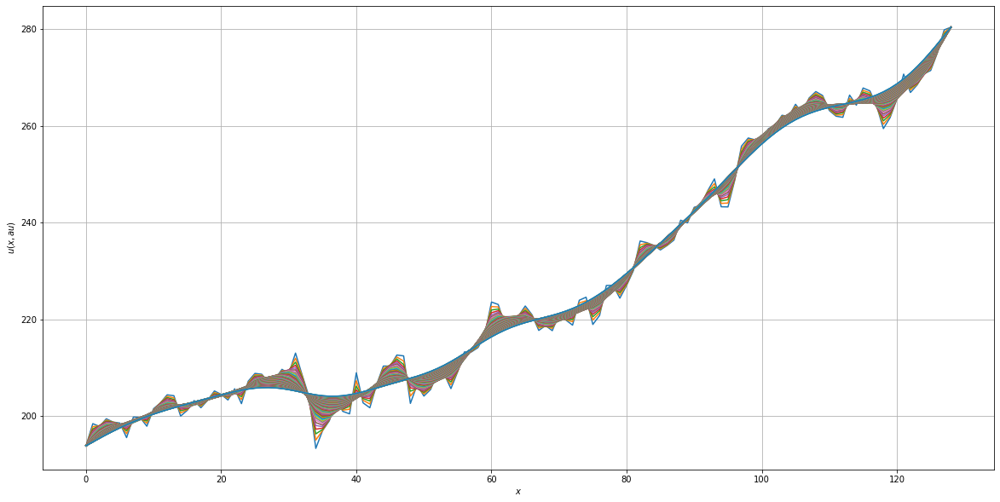

In [10]:
ad = Dirichlet(AAPL, 100)

#### Tesla Stock

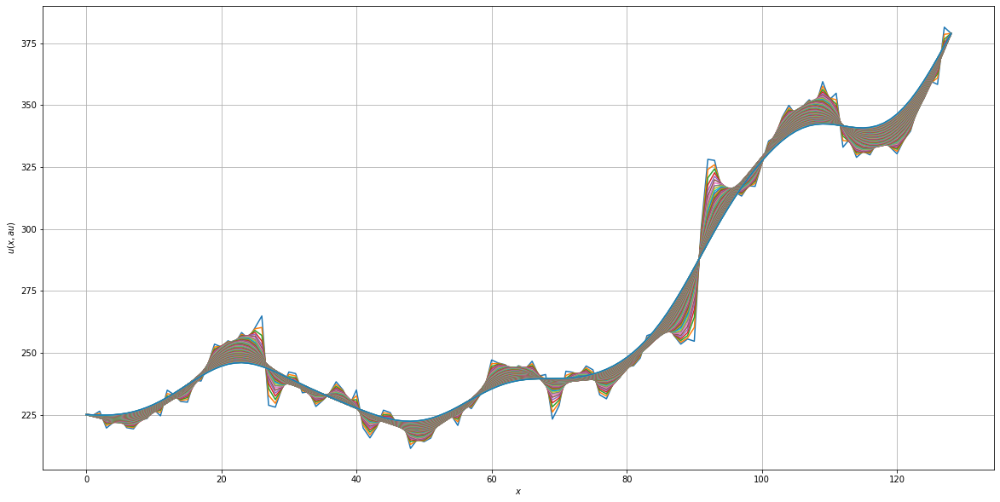

In [11]:
td = Dirichlet(TSLA, 100)

#### Credit Suisse Stock

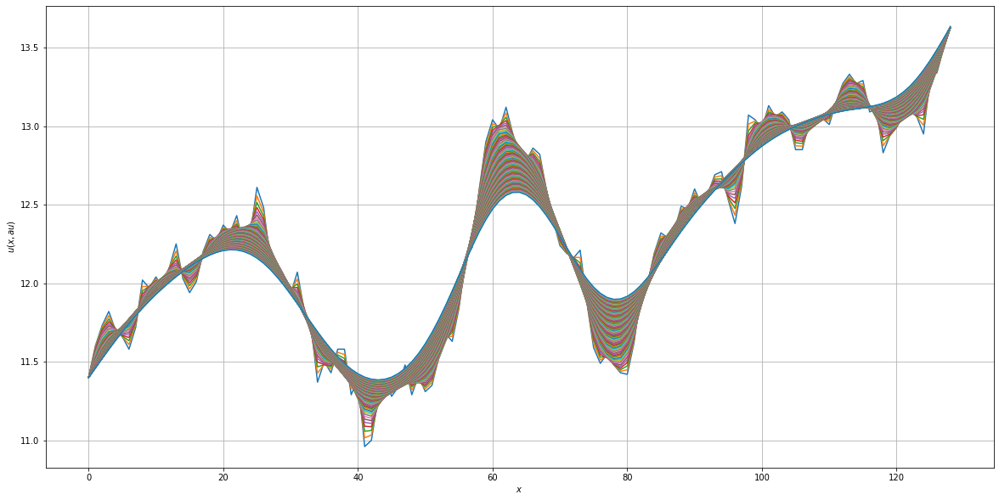

In [12]:
csd = Dirichlet(CS, 100)

### Effect of Changing the Number of Iterations (M) for Dirichlet Boundary Conditions
Increasing the number of iterations used improves the smoothing. This is shown in the plots below, which show the heat equation smoothing of Credit Suisse stock under constant initial conditons for 1, 5, 10, 50, 100, 500, 1000, and 5000 iterations.

#### M = 1

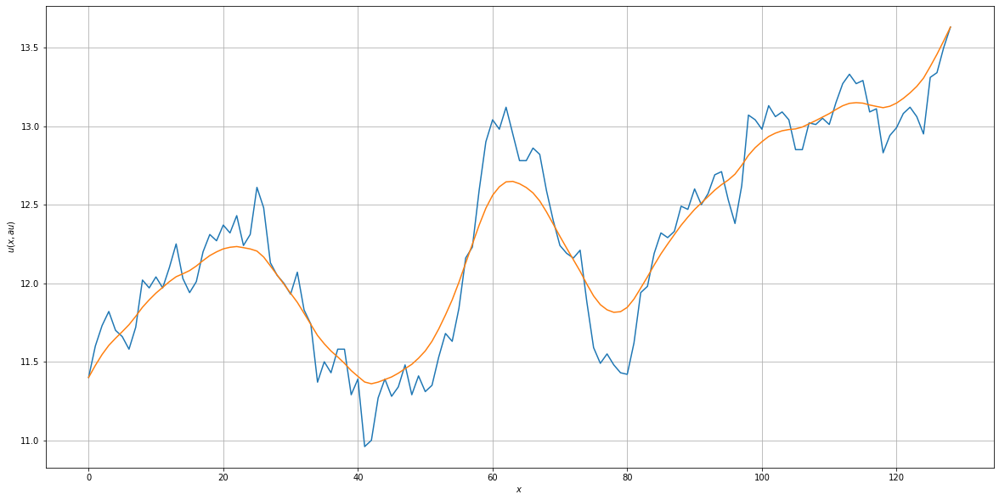

In [13]:
mtd1 = Dirichlet(CS, 1)

#### M = 5

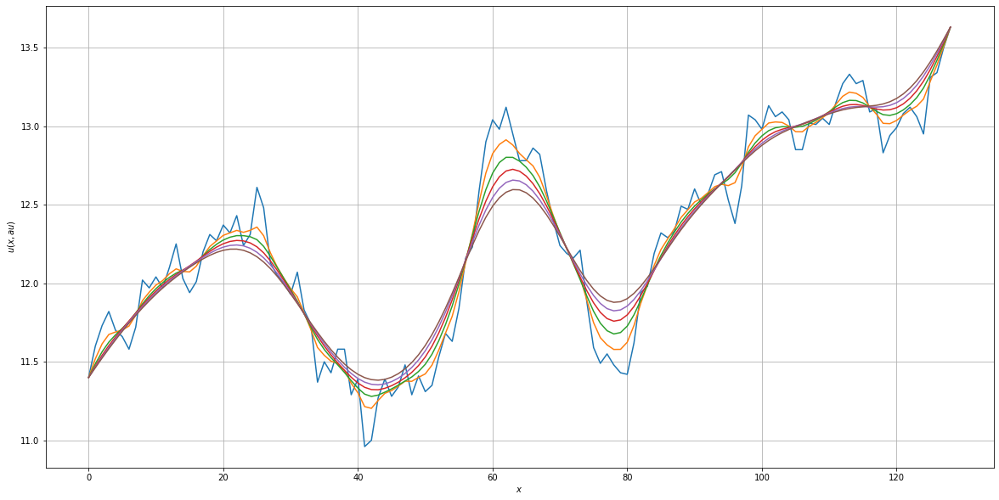

In [14]:
mtd2 = Dirichlet(CS, 5)

#### M = 10

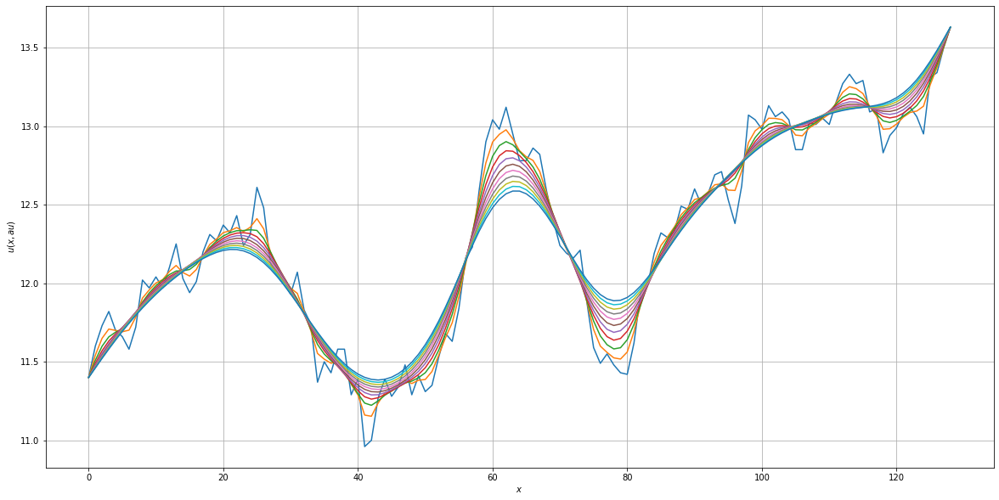

In [15]:
mtd3 = Dirichlet(CS, 10)

#### M = 50

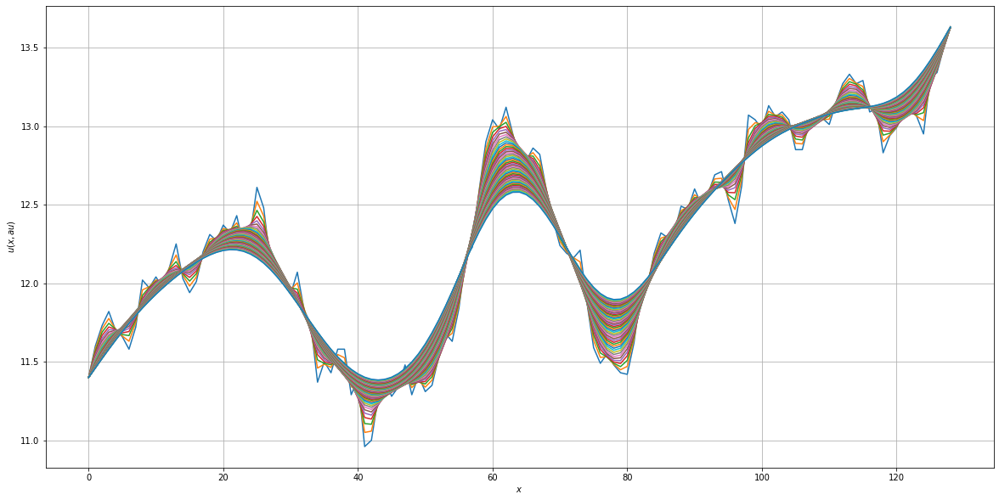

In [16]:
mtd4 = Dirichlet(CS, 50)

#### M = 100

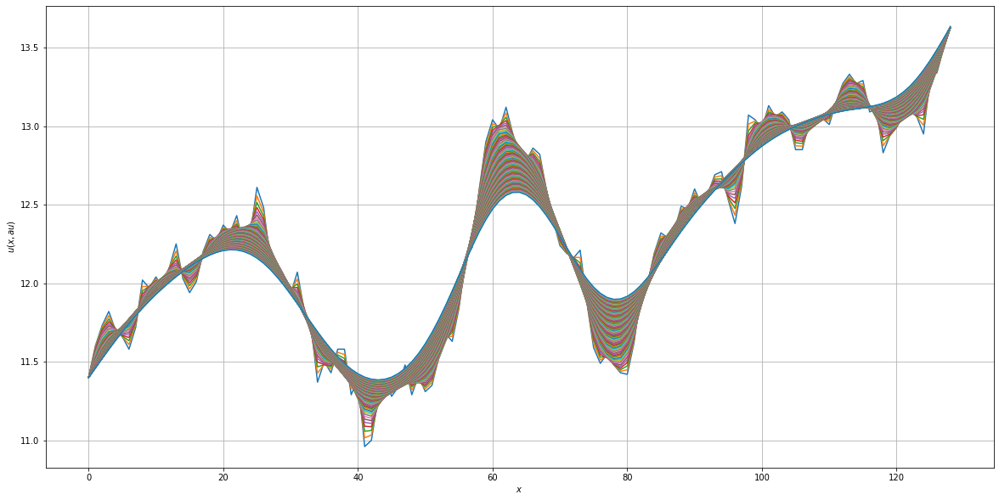

In [17]:
mtd5 = Dirichlet(CS, 100)

#### M = 500

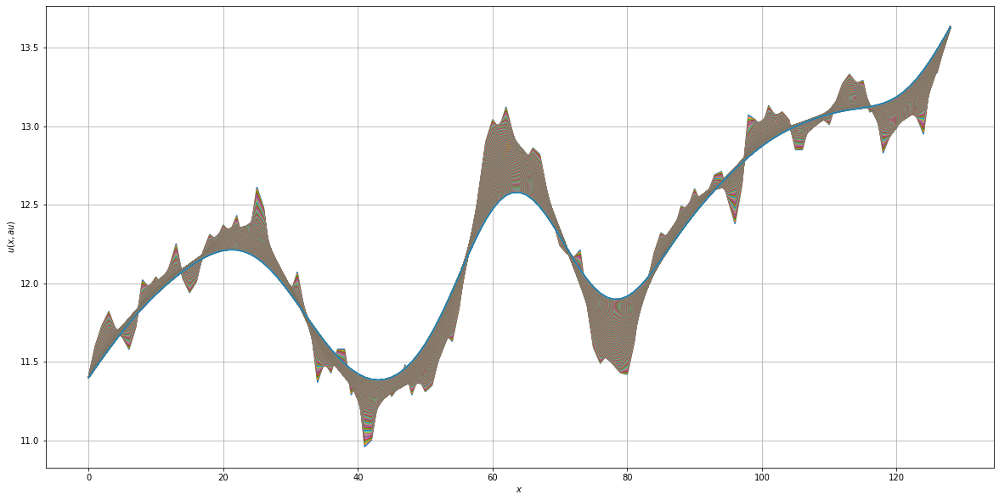

In [18]:
mtd6 = Dirichlet(CS, 500)

#### M = 1000

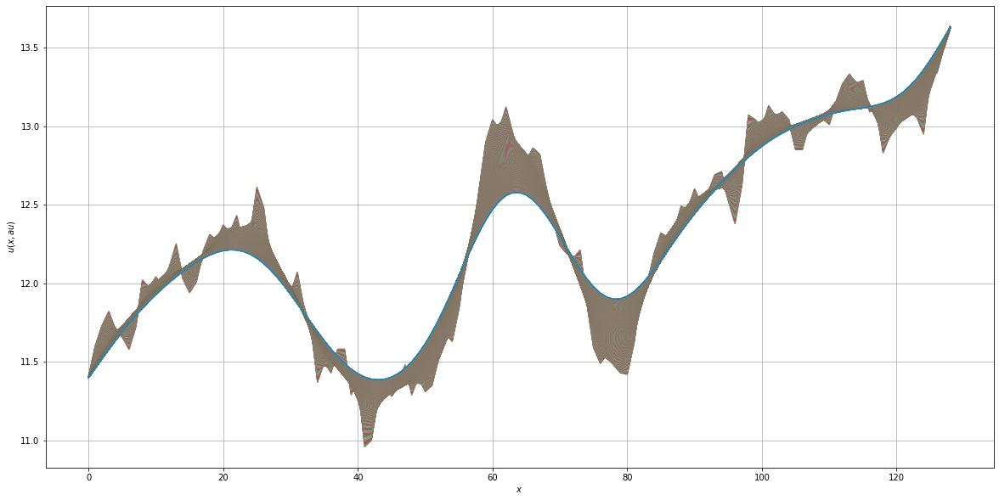

In [19]:
mtd7 = Dirichlet(CS, 1000)

#### M = 5000

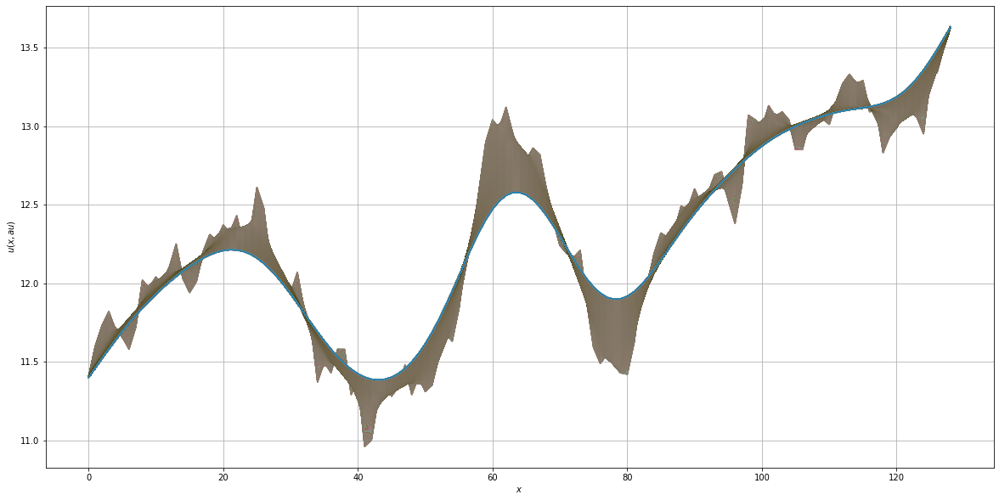

In [20]:
mtd8 = Dirichlet(CS, 5000)

### Effect of Changing Kappa $\left( \kappa \right)$ for Dirichlet Boundary Conditions
Increasing the value of $\kappa$ enhances smoothing; however, using too large a $\kappa$ can cause too much smoothing to the point that the heat equation smoothing converges to a straight line connecting the end points of the true price curve. This is to be expected since the Dirichlet boundary conditions lock the ends of the smoothed curve to the end points of the true stock price curve by definition. On the other hand, using too small a value for $\kappa$ will lead to very little smoothing, to the point that the smoothed curve will converge to the true stock price curve.

The following plots show the heat equation smoothing of the Credit Suisse stock price using $\kappa$ values of 0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, and 1000, holding all other parameters constant and using only 100 iterations for each.

#### $\kappa$ = 0.00001

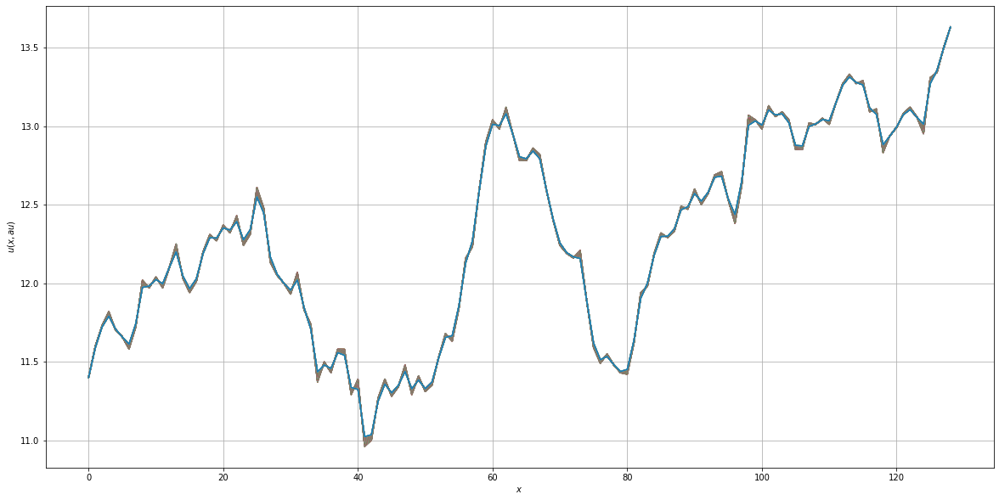

In [21]:
kappa = 0.00001
ktd9 = Dirichlet(CS, 100)

#### $\kappa$ = 0.0001

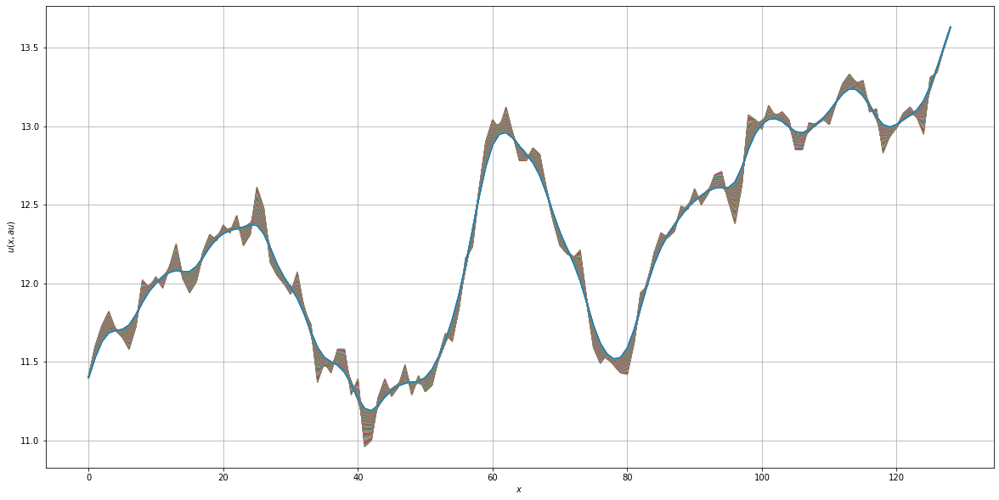

In [22]:
kappa = 0.0001
ktd8 = Dirichlet(CS, 100)

#### $\kappa$ = 0.001

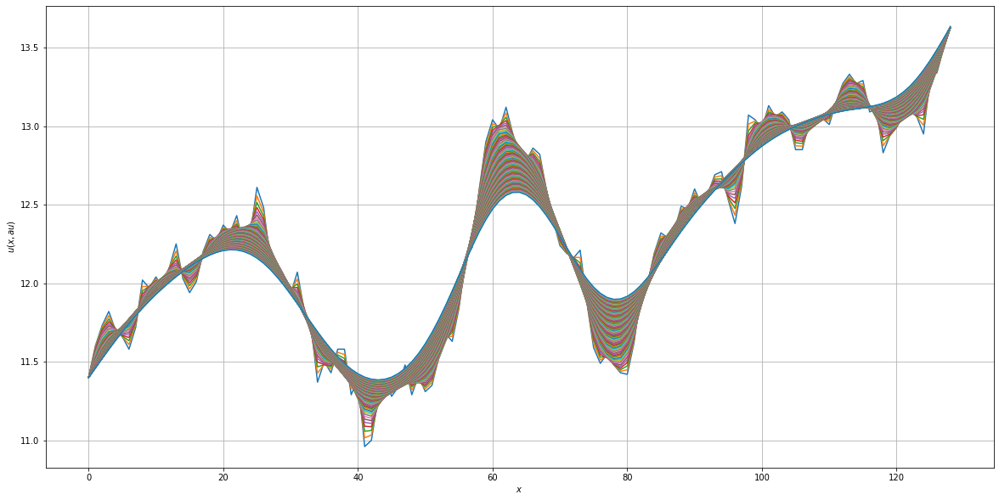

In [23]:
kappa = 0.001
ktd7 = Dirichlet(CS, 100)

#### $\kappa$ = 0.01

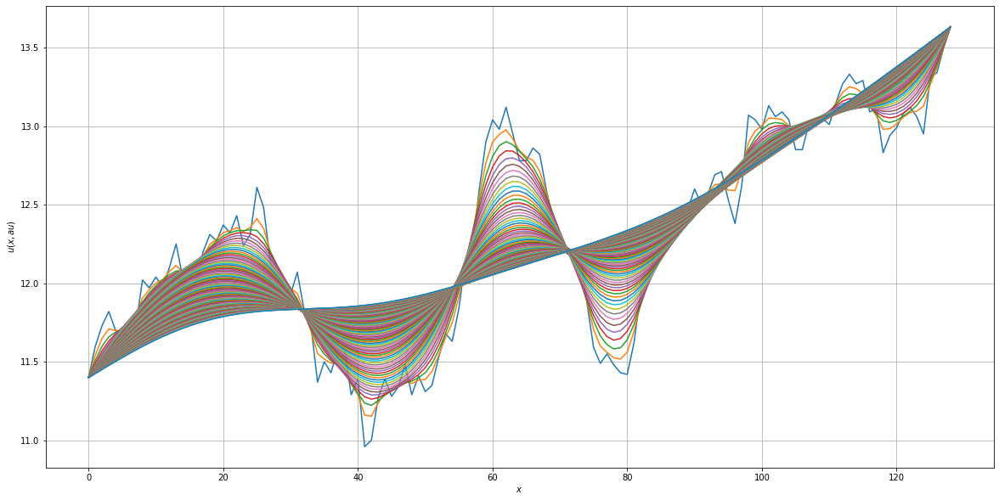

In [24]:
kappa = 0.01
ktd6 = Dirichlet(CS, 100)

#### $\kappa$ = 0.1

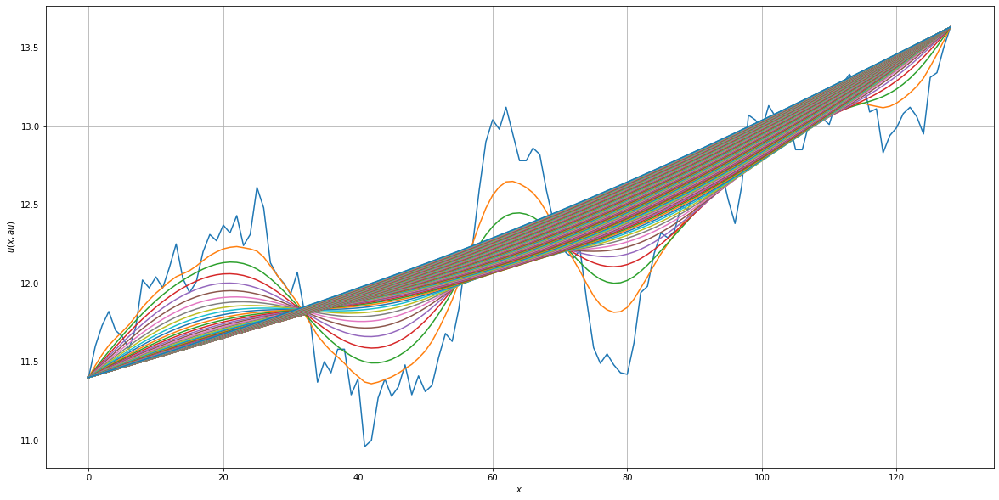

In [25]:
kappa = 0.1
ktd5 = Dirichlet(CS, 100)

#### $\kappa$ = 1

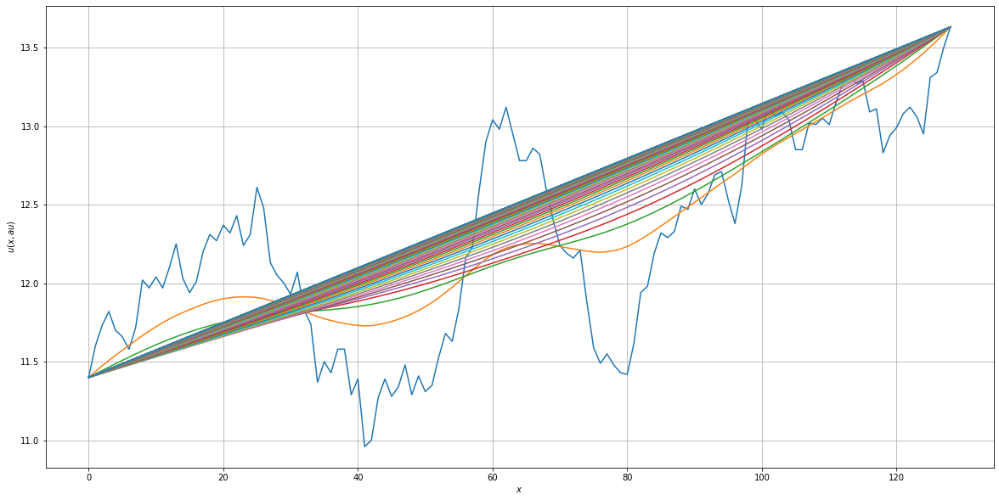

In [26]:
kappa = 1
ktd4 = Dirichlet(CS, 100)

#### $\kappa$ = 10

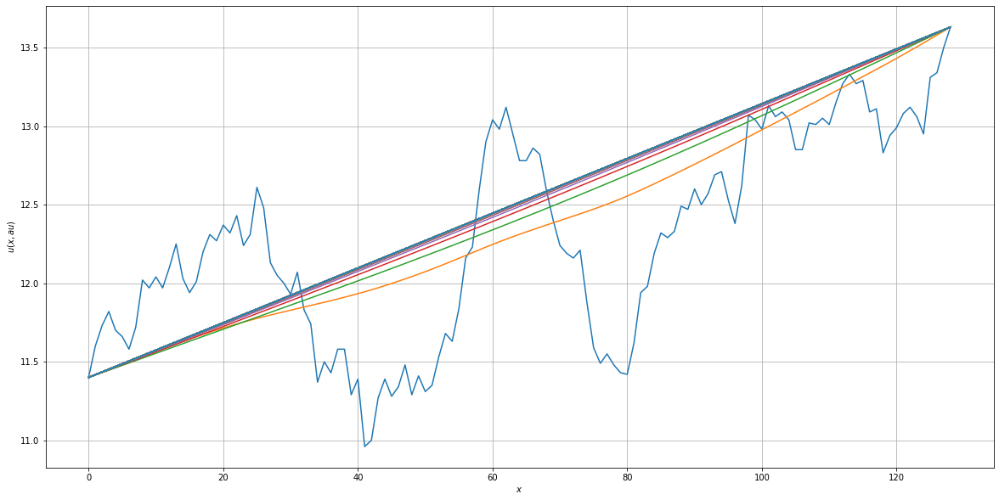

In [27]:
kappa = 10
ktd3 = Dirichlet(CS, 100)

#### $\kappa$ = 100

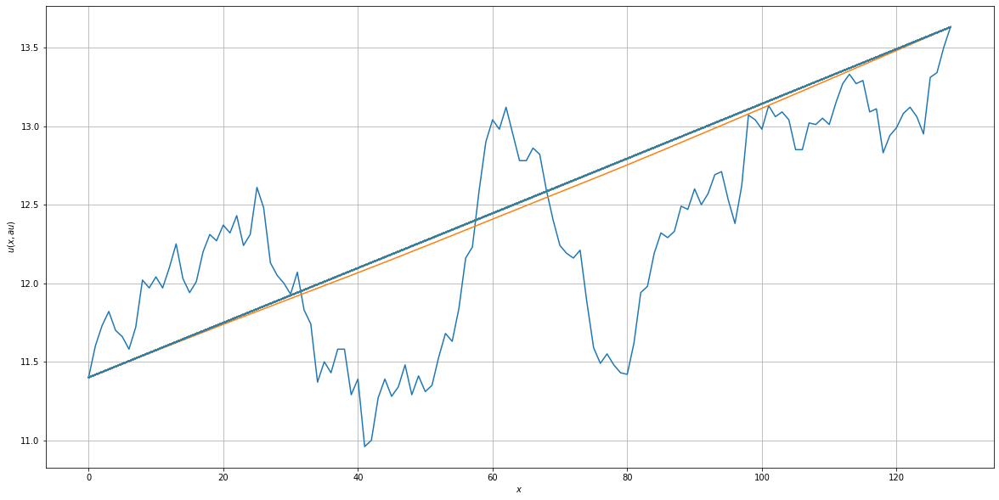

In [28]:
kappa = 100
ktd2 = Dirichlet(CS, 100)

#### $\kappa$ = 1000

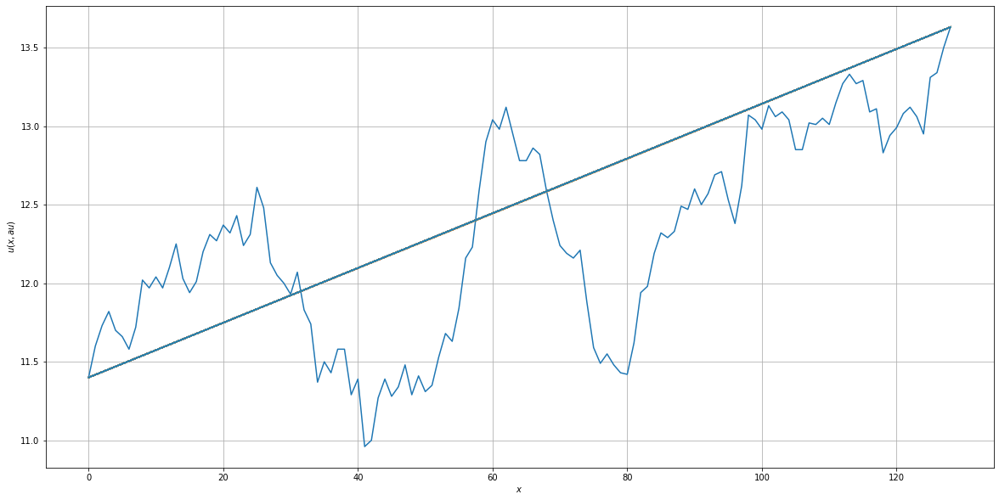

In [29]:
kappa = 1000
ktd1 = Dirichlet(CS, 100)

## Implicit Method with Neumann Conditions

To implement the Neumann boundary conditions, set

$$
\frac{\delta u}{\delta x} \bigg|_{x=x_0} = \frac{\delta u}{\delta x} \bigg|_{x=x_N}=0
$$

The section details how the boundaries of the $A_{\text{Explicit}}$ matrix for the forward (explicit) method $A_{\text{Explicit}}\overrightarrow{u}(x_i, \tau_i)=\overrightarrow{u}(x_i, \tau_i+\Delta \tau)$ is found. Once $A_{\text{Explicit}}$ is found, the fact that the implicit method matrix is $A_{\text{implicit}}=2I-A_{\text{Explicit}}$ gives the implicit method matrix which is used to implement the backward (implicit) method $A_{\text{Implicit}}\overrightarrow{u}(x_i, \tau_i+\Delta \tau)=\overrightarrow{u}(x_i, \tau_i)$ using Neumann boundary conditions. The results of the Dirichlet and Neumann boundary method functions are compared afterward.

In the appendices the forward method is compared with the backward method using Neumann conditions.

### Derivation of Neumann Boundary Conditions

#### Left Boundary
For the left boundary $\frac{\delta u}{\delta x} \Big|_{x=x_0} = 0$, let $u_i = u(x_i,\tau)$ and use Taylor expansion around $x=x_0$

\begin{align*}
u_0 &= u_0 \\
u_1 &= u_0 
       + \Delta x \frac{\delta u}{\delta x} 
       + \frac{1}{2} (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + \frac{1}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
       + O\left(\left(\Delta x\right)^4\right) \\
u_2 &= u_0 
       + 2\Delta x \frac{\delta u}{\delta x} 
       + \frac{1}{2} (2\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + \frac{1}{6} (2\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
       + O\left(\left(\Delta x\right)^4\right) \\
    &= u_0 
       + 2\Delta x \frac{\delta u}{\delta x} 
       + \frac{4}{2} (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
       + O\left(\left(\Delta x\right)^4\right) \\
    &= u_0 
       + 2\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
       + O\left(\left(\Delta x\right)^4\right)
\end{align*}

Eliminating the $\frac{\delta^3 u}{\delta x^3}$ terms

\begin{align*}
8u_1 - u_2 &= \left[8u_0 
       + 8\Delta x \frac{\delta u}{\delta x} 
       + \frac{8}{2} (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
       + O\left(\left(\Delta x\right)^4\right)\right]
       -\left[u_0 
       + 2\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
       + O\left(\left(\Delta x\right)^4\right)\right] \\
       &= 7u_0 
       + 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + O\left(\left(\Delta x\right)^4\right)
\end{align*}

and eliminating the $u_0$ terms

\begin{align*}
8u_1 - u_2 -7u_0 &= \left[7u_0 
       + 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + O\left(\left(\Delta x\right)^4\right)\right]
       -7u_0 \\
       &= 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
       + O\left(\left(\Delta x\right)^4\right)
\end{align*}

and knowing that each derivative is evaluated at $x=x_0$ leaves

\begin{align*}
8u_1 - u_2 -7u_0 &= 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2} 
       + O\left(\left(\Delta x\right)^4\right) \\
8u_1 - u_2 -7u_0 &= 6\Delta x (0) 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2} 
       + O\left(\left(\Delta x\right)^4\right) \\
8u_1 - u_2 -7u_0 &= 2 (\Delta x)^2 \frac{\delta^2 u}{\delta x^2} + O\left(\left(\Delta x\right)^4\right) \\
\frac{8u_1 - u_2 -7u_0}{2 (\Delta x)^2} &= \frac{\delta^2 u}{\delta x^2} + O\left(\left(\Delta x\right)^4\right)
\end{align*}

From the heat equation

\begin{align*}
u_\tau - \kappa u_{xx} &= 0 \\
u_\tau &= \kappa u_{xx} \\
\frac{u_\tau}{\kappa} &= u_{xx}
\end{align*}

Applying this to the left boundary and letting $\rho=\frac{\kappa \Delta \tau}{(\Delta x)^2}$

\begin{align*}
\frac{\delta^2 u}{\delta x^2} + O\left(\left(\Delta x\right)^4\right) 
= \frac{8u_1 - u_2 -7u_0}{2 (\Delta x)^2} 
&= \frac{u(x_0, \tau+\Delta \tau)-u(x_0, \tau)}{\kappa \Delta \tau}
= \frac{u_\tau}{\kappa} \\
\frac{1}{2}\frac{\kappa \Delta \tau}{(\Delta x)^2} (8u_1 - u_2 -7u_0)
&= u(x_0, \tau+\Delta \tau)-u_0 \\
\frac{1}{2} \rho (8u_1 - u_2 -7u_0) + u_0
&= u(x_0, \tau+\Delta \tau) \\
4 \rho u_1 - \frac{1}{2} \rho u_2 -\frac{7}{2}\rho u_0 + u_0
&= u(x_0, \tau+\Delta \tau) \\
\left(1-\frac{7}{2}\rho \right)u_0 + 4 \rho u_1 - \frac{1}{2} \rho u_2
&= u(x_0, \tau+\Delta \tau)
\end{align*}

This makes the elements of the first row of $A_{\text{Explicit}}$

\begin{align*}
A_{\text{Explicit}}[0,0] &= 1-\frac{7}{2}\rho \\
A_{\text{Explicit}}[0,1] &= 4 \rho \\
A_{\text{Explicit}}[0,2] &= - \frac{1}{2} \rho
\end{align*}

with the rest of the elements in the row equal to 0.

#### Right Boundary
For the right boundary $\frac{\delta u}{\delta x} \Big|_{x=x_N} = 0$, let $u_i = u(x_i,\tau)$ and use Taylor expansion around $x=x_N$

\begin{align*}
u_N &= u_N \\
u_{N-1} &= u_N 
       - \Delta x \frac{\delta u}{\delta x} 
       + \frac{1}{2} (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       - \frac{1}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta^3 x}
       + O\left(\left(\Delta x\right)^4\right) \\
u_{N-2} &= u_N 
       - 2\Delta x \frac{\delta u}{\delta x} 
       + \frac{1}{2} (2\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       - \frac{1}{6} (2\Delta x)^3 \frac{\delta^3 u}{\delta^3 x}
       + O\left(\left(\Delta x\right)^4\right) \\
    &= u_N 
       - 2\Delta x \frac{\delta u}{\delta x} 
       + \frac{4}{2} (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       - \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta^3 x}
       + O\left(\left(\Delta x\right)^4\right) \\
    &= u_N 
       - 2\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       - \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta^3 x}
       + O\left(\left(\Delta x\right)^4\right)
\end{align*}

Eliminating the $\frac{\delta^3 u}{\delta^3 x}$ terms

\begin{align*}
8u_{N-1} - u_{N-2} &= \left[8u_N 
       - 8\Delta x \frac{\delta u}{\delta x} 
       + \frac{8}{2} (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       - \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta^3 x}
       + O\left(\left(\Delta x\right)^4\right)\right]
       -\left[u_0 
       - 2\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       - \frac{8}{6} (\Delta x)^3 \frac{\delta^3 u}{\delta^3 x}
       + O\left(\left(\Delta x\right)^4\right)\right] \\
       &= 7u_N 
       - 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       + O\left(\left(\Delta x\right)^4\right)
\end{align*}

and eliminating the $u_0$ terms

\begin{align*}
8u_{N-1} - u_{N-2} -7u_N &= \left[7u_N 
       - 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       + O\left(\left(\Delta x\right)^4\right)\right]
       -7u_N \\
       &= 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       + O\left(\left(\Delta x\right)^4\right)
\end{align*}

and knowing that each derivative is evaluated at $x=x_N$ leaves

\begin{align*}
8u_{N-1} - u_{N-2} -7u_N &= 6\Delta x \frac{\delta u}{\delta x} 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x}
       + O\left(\left(\Delta x\right)^4\right) \\
8u_{N-1} - u_{N-2} -7u_N&= 6\Delta x (0) 
       + 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x} 
       + O\left(\left(\Delta x\right)^4\right) \\
8u_{N-1} - u_{N-2} -7u_N &= 2 (\Delta x)^2 \frac{\delta^2 u}{\delta^2 x} + O\left(\left(\Delta x\right)^4\right) \\
\frac{8u_{N-1} - u_{N-2} -7u_N}{2 (\Delta x)^2} &= \frac{\delta^2 u}{\delta^2 x} + O\left(\left(\Delta x\right)^4\right)
\end{align*}

From the heat equation

\begin{align*}
u_\tau - \kappa u_{xx} &= 0 \\
u_\tau &= \kappa u_{xx} \\
\frac{u_\tau}{\kappa} &= u_{xx}
\end{align*}

Applying this to the left boundary and letting $\rho=\frac{\kappa \Delta \tau}{(\Delta x)^2}$

\begin{align*}
\frac{\delta^2 u}{\delta^2 x} + O\left(\left(\Delta x\right)^4\right) 
= \frac{8u_{N-1} - u_{N-2} -7u_N}{2 (\Delta x)^2} 
&= \frac{u(x_N, \tau+\Delta \tau)-u(x_N, \tau)}{\kappa \Delta \tau}
= \frac{u_\tau}{\kappa} \\
\frac{1}{2}\frac{\kappa \Delta \tau}{(\Delta x)^2} (8u_{N-1} - u_{N-2} -7u_N)
&= u(x_N, \tau+\Delta \tau)-u_N \\
\frac{1}{2} \rho (8u_{N-1} - u_{N-2} -7u_N) + u_N
&= u(x_N, \tau+\Delta \tau) \\
4 \rho u_{N-1} - \frac{1}{2} \rho u_{N-2} -\frac{7}{2}\rho u_N + u_N
&= u(x_N, \tau+\Delta \tau) \\
- \frac{1}{2} \rho u_{N-2} + 4 \rho u_{N-1} + \left(1-\frac{7}{2}\rho \right)u_N
&= u(x_N, \tau+\Delta \tau)
\end{align*}

This makes the elements of the first row of $A_{\text{Explicit}}$

\begin{align*}
A_{\text{Explicit}}[N,N-2] &= - \frac{1}{2} \rho \\
A_{\text{Explicit}}[N,N-1] &= 4 \rho \\
A_{\text{Explicit}}[N,N] &= 1-\frac{7}{2}\rho
\end{align*}

with the rest of the elements in the row equal to 0.

#### Between the Boundaries
Within the boundaries, utilize Taylor series about $x=x_i$ for

\begin{align*}
u_{i-1} &= u_i 
- \Delta x \frac{\delta u}{\delta x}
+ \frac{1}{2}(\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
- \frac{1}{6}(\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
+ O\left(\left(\Delta x\right)^4\right) \\
u_i &= u_i \\
u_{i+1} &= u_i 
+ \Delta x \frac{\delta u}{\delta x}
+ \frac{1}{2}(\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
+ \frac{1}{6}(\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
+ O\left(\left(\Delta x\right)^4\right)
\end{align*}

Eliminating the $\frac{\delta u}{\delta x}$ and $\frac{\delta^3 u}{\delta x^3}$ terms

\begin{align*}
u_{i-1} + u_{i+1} &= \left[u_i 
- \Delta x \frac{\delta u}{\delta x}
+ \frac{1}{2}(\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
- \frac{1}{6}(\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
+ O\left(\left(\Delta x\right)^4\right)\right]
+ \left[u_i 
+ \Delta x \frac{\delta u}{\delta x}
+ \frac{1}{2}(\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
+ \frac{1}{6}(\Delta x)^3 \frac{\delta^3 u}{\delta x^3}
+ O\left(\left(\Delta x\right)^4\right)\right] \\
&= 2u_i + (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}
\end{align*}

and eliminating the $u_i$ term leaves

\begin{align*}
u_{i-1} + u_{i+1} - 2u_i &= \left[2u_i 
+ (\Delta x)^2 \frac{\delta^2 u}{\delta x^2}\right] - 2u_i \\
u_{i-1} + u_{i+1} - 2u_i&=(\Delta x)^2 \frac{\delta^2 u}{\delta x^2} \\
\frac{u_{i-1} + u_{i+1} - 2u_i}{(\Delta x)^2} &= \frac{\delta^2 u}{\delta x^2}
\end{align*}

From the heat equation

\begin{align*}
u_\tau - \kappa u_{xx} &= 0 \\
u_\tau &= \kappa u_{xx} \\
\frac{u_\tau}{\kappa} &= u_{xx}
\end{align*}

Applying this and letting $\rho=\frac{\kappa \Delta \tau}{(\Delta x)^2}$ yields

\begin{align*}
\frac{\delta^2 u}{\delta^2 x} + O\left(\left(\Delta x\right)^4\right) 
= \frac{u_{i-1} + u_{i+1} - 2u_i}{(\Delta x)^2} 
&= \frac{u(x_i, \tau+\Delta \tau)-u(x_i, \tau)}{\kappa \Delta \tau}
= \frac{u_\tau}{\kappa} \\
\frac{\kappa \Delta \tau}{(\Delta x)^2} (u_{i-1} + u_{i+1} - 2u_i)
&= u(x_i, \tau+\Delta \tau)-u_i \\
\rho (u_{i-1} + u_{i+1} - 2u_i) + u_i
&= u(x_i, \tau+\Delta \tau) \\
\rho u_{i-1} + \rho u_{i+1} - 2 \rho u_i + u_i
&= u(x_i, \tau+\Delta \tau) \\
\rho u_{i-1} + (1 - 2 \rho) u_i + \rho u_{i+1}
&= u(x_i, \tau+\Delta \tau)
\end{align*}

This makes the elements of the rows of $A_{\text{Explicit}}$ between the boundaries

\begin{align*}
A_{\text{Explicit}}[i,i-1] &= \rho \\
A_{\text{Explicit}}[i,i] &= 1-2\rho \\
A_{\text{Explicit}}[i,i+1] &= \rho
\end{align*}

with the rest of the elements in each row equal to 0.

#### Convert from $A_{\text{Explicit}}$ to $A_{\text{Implicit}}$
From the work in the previous sections, the $A_{\text{Explicit}}$ is found to be


$$
A_{\text{Explicit}} = 
\begin{bmatrix}
1-\frac{7}{2}\rho & 4p & -\frac{1}{2}\rho & 0 & 0 & \cdots & 0 \\
\rho & 1-2\rho & \rho & 0 & 0 & \cdots & 0 \\
0 & \rho & 1-2\rho & \rho & 0 & \cdots & 0 \\
\vdots & & \ddots & \ddots & \ddots & & \vdots \\
0 & \cdots & 0 & \rho & 1-2\rho & \rho & 0 \\
0 & \cdots & 0 & 0 & \rho & 1-2\rho & \rho \\
0 & \cdots & 0 & 0 & -\frac{1}{2}\rho & 4p & 1-\frac{7}{2}\rho
\end{bmatrix}
$$


Since the goal is to compare the use of Neumann versus Dirichlet boundary conditions, and the method given for the Dirichlet boundary conditions was implicit, $A_{\text{Implicit}}$ was found using $A_{\text{Implicit}}=2I-A_{\text{Explicit}}$


\begin{align*}
A_{\text{Implicit}}&=2I-A_{\text{Explicit}} \\
&= 2
\begin{bmatrix}
1 & 0 & 0 & \cdots & 0 & 0 & 0 \\
0 & 1 & 0 & \cdots & 0 & 0 & 0 \\
0 & 0 & 1 & \cdots & 0 & 0 & 0 \\
\vdots & & & \ddots & & & \vdots \\
0 & 0 & 0 & \cdots & 1 & 0 & 0 \\
0 & 0 & 0 & \cdots & 0 & 1 & 0 \\
0 & 0 & 0 & \cdots & 0 & 0 & 1
\end{bmatrix}
-
\begin{bmatrix}
1-\frac{7}{2}\rho & 4p & -\frac{1}{2}\rho & 0 & 0 & \cdots & 0 \\
\rho & 1-2\rho & \rho & 0 & 0 & \cdots & 0 \\
0 & \rho & 1-2\rho & \rho & 0 & \cdots & 0 \\
\vdots & & \ddots & \ddots & \ddots & & \vdots \\
0 & \cdots & 0 & \rho & 1-2\rho & \rho & 0 \\
0 & \cdots & 0 & 0 & \rho & 1-2\rho & \rho \\
0 & \cdots & 0 & 0 & -\frac{1}{2}\rho & 4p & 1-\frac{7}{2}\rho
\end{bmatrix} \\
&=
\begin{bmatrix}
2 & 0 & 0 & \cdots & 0 & 0 & 0 \\
0 & 2 & 0 & \cdots & 0 & 0 & 0 \\
0 & 0 & 2 & \cdots & 0 & 0 & 0 \\
\vdots & & & \ddots & & & \vdots \\
0 & 0 & 0 & \cdots & 2 & 0 & 0 \\
0 & 0 & 0 & \cdots & 0 & 2 & 0 \\
0 & 0 & 0 & \cdots & 0 & 0 & 2
\end{bmatrix}
-
\begin{bmatrix}
1-\frac{7}{2}\rho & 4p & -\frac{1}{2}\rho & 0 & 0 & \cdots & 0 \\
\rho & 1-2\rho & \rho & 0 & 0 & \cdots & 0 \\
0 & \rho & 1-2\rho & \rho & 0 & \cdots & 0 \\
\vdots & & \ddots & \ddots & \ddots & & \vdots \\
0 & \cdots & 0 & \rho & 1-2\rho & \rho & 0 \\
0 & \cdots & 0 & 0 & \rho & 1-2\rho & \rho \\
0 & \cdots & 0 & 0 & -\frac{1}{2}\rho & 4p & 1-\frac{7}{2}\rho
\end{bmatrix} \\
&=
\begin{bmatrix}
2-\left(1-\frac{7}{2}\rho\right) & 0-4p & 0-\left(-\frac{1}{2}\rho\right) & 0 & 0 & \cdots & 0 \\
0-\rho & 2-\left(1-2\rho\right) & 0-\rho & 0 & 0 & \cdots & 0 \\
0 & 0-\rho & 2-\left(1-2\rho\right) & 0-\rho & 0 & \cdots & 0 \\
\vdots & & \ddots & \ddots & \ddots & & \vdots \\
0 & \cdots & 0 & 0-\rho & 2-\left(1-2\rho\right) & 0-\rho & 0 \\
0 & \cdots & 0 & 0 & 0-\rho & 2-\left(1-2\rho\right) & 0-\rho \\
0 & \cdots & 0 & 0 & 0-\left(-\frac{1}{2}\rho\right) & 0-4p & 2-\left(1-\frac{7}{2}\rho\right)
\end{bmatrix} \\
A_{\text{Implicit}}
&=
\begin{bmatrix}
1+\frac{7}{2}\rho & -4p & \frac{1}{2}\rho & 0 & 0 & \cdots & 0 \\
-\rho & 1+2\rho & -\rho & 0 & 0 & \cdots & 0 \\
0 & -\rho & 1+2\rho & -\rho & 0 & \cdots & 0 \\
\vdots & & \ddots & \ddots & \ddots & & \vdots \\
0 & \cdots & 0 & -\rho & 1+2\rho & -\rho & 0 \\
0 & \cdots & 0 & 0 & -\rho & 1+2\rho & -\rho \\
0 & \cdots & 0 & 0 & \frac{1}{2}\rho & -4p & 1+\frac{7}{2}\rho
\end{bmatrix} 
\end{align*}

### Backward (Implicit) Method with Neumann Boundary Conditions

#### Code to set up the $A_{\text{Implicit}}$ Matrix

In [30]:
# Establish the A matrix for implicit scheme with Neumann boundary conditions
def setUpNeumannA(N, rho):
    # Initialize a (N+1) by (N+1) matrix of 0s for A
    A = np.zeros((N+1, N+1))
    
    # Generate the first row of matrix A from the boundary conditions
    A[0][0:3] = [1+((7/2)*rho), (-4*rho), (0.5*rho)]
    # Generate the last row of matrix A from the boundary conditions
    A[N][N-2:N+1] = [(0.5*rho), (-4*rho), (1+(7/2)*rho)]
    # Fill in the rest of the A matrix as expected for the implicit method
    for i in range(0,N-1):
        j = i+1
        A[j][j-1:j+2] = [-rho, (1+(2*rho)), -rho]
    
    return(A)

#### Main Neumann Function for Backward (Implicit) Method

In [31]:
def Neumann(Stock_or_Rate, M, plot=True):
    # M = number of simulations/iterations - if M is large enough it will go very little ahead in time for each iteration
    
    x, u = Stock(Stock_or_Rate) # Stock Prices
    #x, u = Rate(Stock_or_Rate) # Exchange Rates
    res = np.zeros((len(u), M)) # Initialize matrix res, which holds the vector of stock prices generated for each iteration
    
    # Set N equal to 1 less than the length of the u-vector
    N = len(u)-1
       
    dX = (b-a)/N # the distance between each closing price - i.e. time between daily closing prices
    dT = T/M # the distance in time between each iteration
    rho = kappa*dT/(dX*dX)
    
    A = setUpNeumannA(N, rho)
    
    if plot:
        plt.figure(figsize=(20,10))  
        plt.plot(x, u)

    for j in range(M):
        u = np.linalg.solve(A, u)
        res[:,j] = u # Store the vector of stock prices generated for this iteration in column j of matrix res
        
        if plot:
            plt.plot(x, u)
            plt.grid(True)
            plt.xlabel('$x$')
            plt.ylabel('$u(x,\tau)$')
    
    if plot:
        plt.show()
    
    return(res[:,M-1]) # Return the last column of matrix res (The vector of prices from the final iteration)

### Test Neumann Conditions for Backward (Implicit) Method Function Plot Output

#### Reset to Initial Parameters

In [32]:
a = 0 # "start"
b = 1 # "end"

kappa = 0.001 # how much we let the extreme points affect the smoothing
T = 1 # the length of the simulation - for how long are we running the smoothing / how long will the simulation take

#### Costco Stock

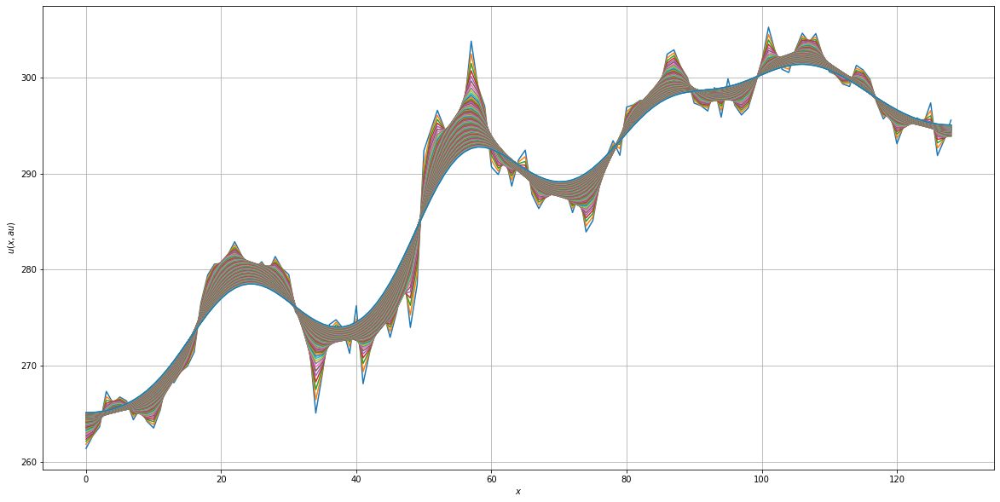

In [33]:
cn=Neumann(COST, 100)

#### JC Penney Stock

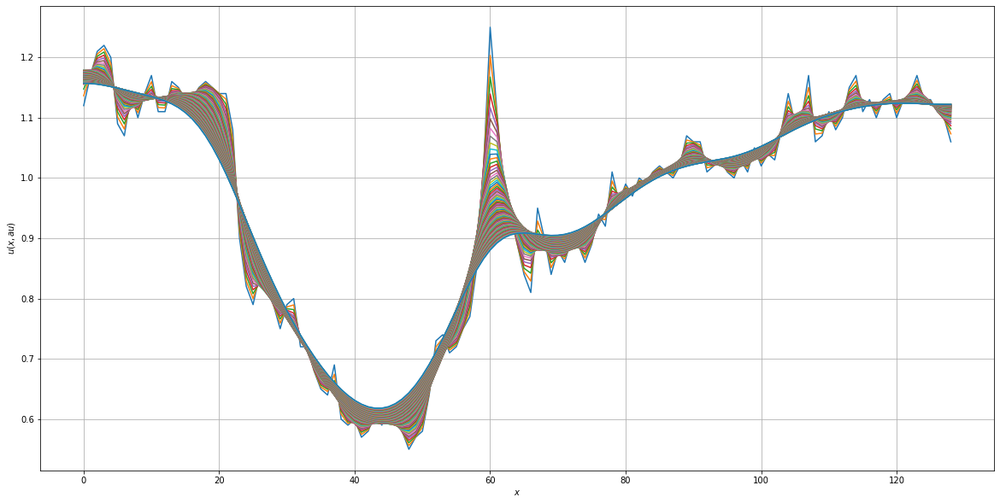

In [34]:
jn=Neumann(JCP,100)

#### Apple Stock

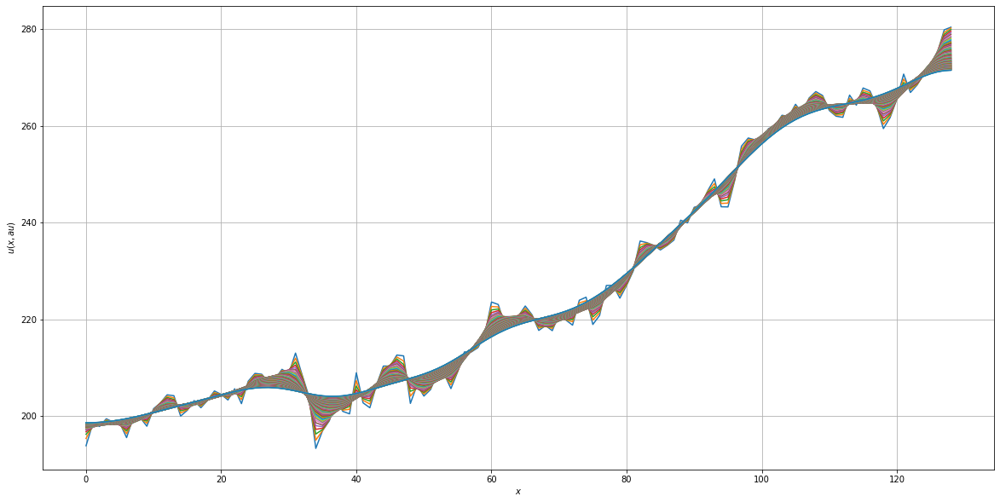

In [35]:
an = Neumann(AAPL, 100)

#### Tesla Stock

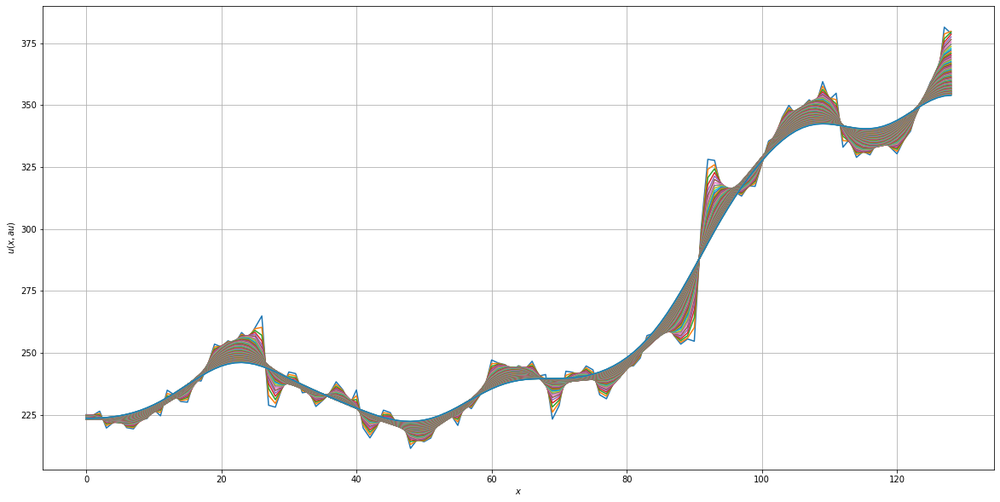

In [36]:
tn = Neumann(TSLA, 100)

#### Credit Suisse Stock

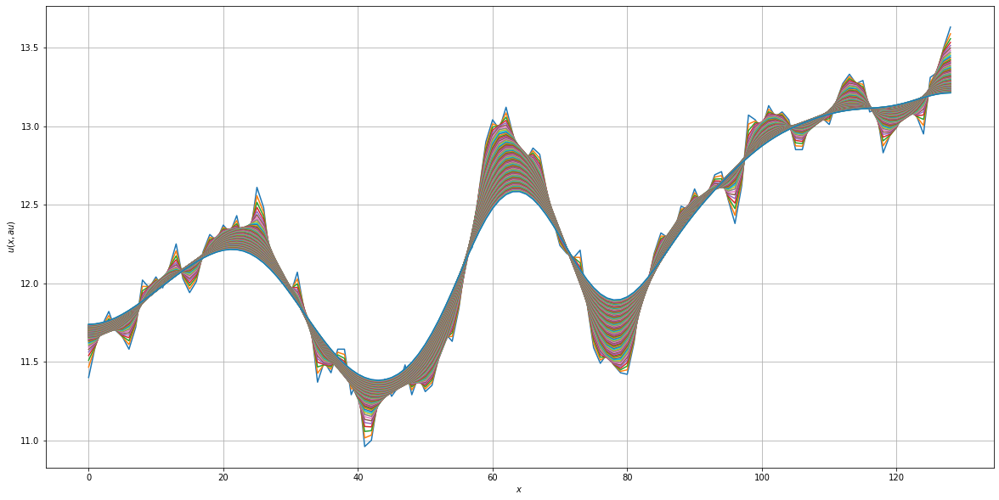

In [37]:
csn = Neumann(CS, 100)

### Effect of Changing the Number of Iterations (M) for Backward (Implicit) Method with Neumann Boundary Conditions
As with Dirichlet boundary conditions, increasing the number of iterations used improves the smoothing. This is shown in the plots below, which show the heat equation smoothing of Credit Suisse stock under constant initial conditons for 1, 5, 10, 50, 100, 500, 1000, and 5000 iterations.

#### M = 1

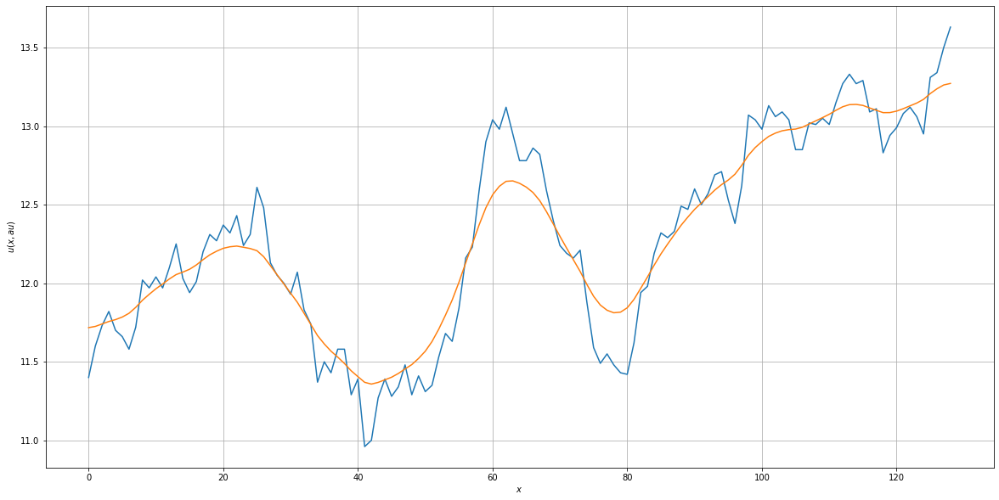

In [38]:
mtn1 = Neumann(CS, 1)

#### M = 5

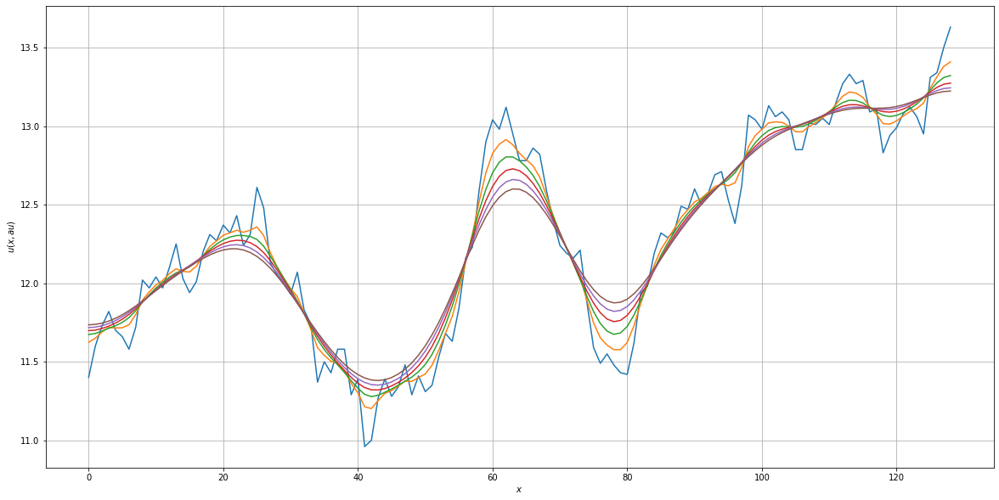

In [39]:
mtn2 = Neumann(CS, 5)

#### M = 10

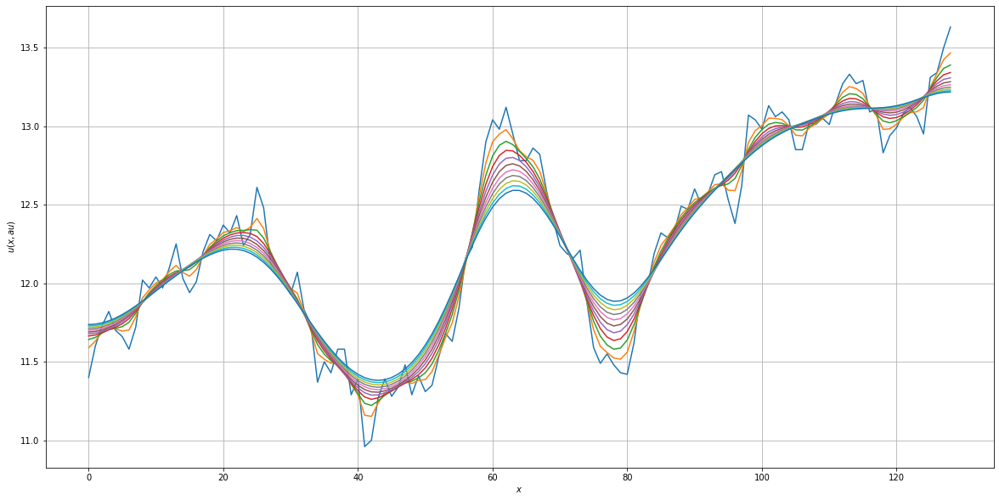

In [40]:
mtn3 = Neumann(CS, 10)

#### M = 50

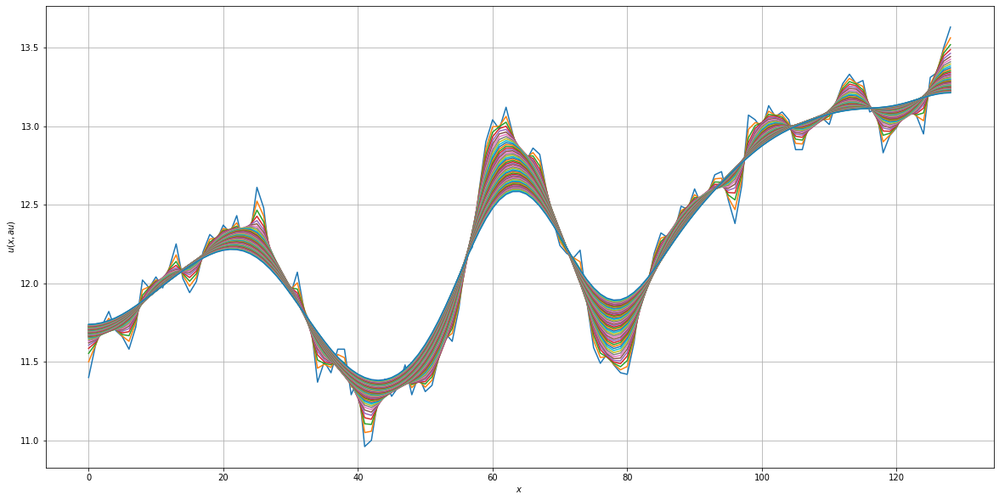

In [41]:
mtn4 = Neumann(CS, 50)

#### M = 100

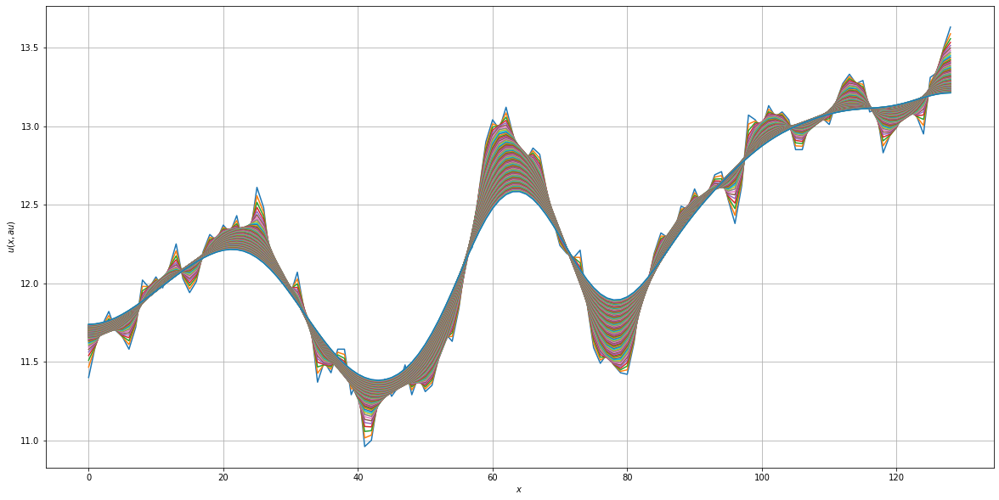

In [42]:
mtn5 = Neumann(CS, 100)

#### M = 500

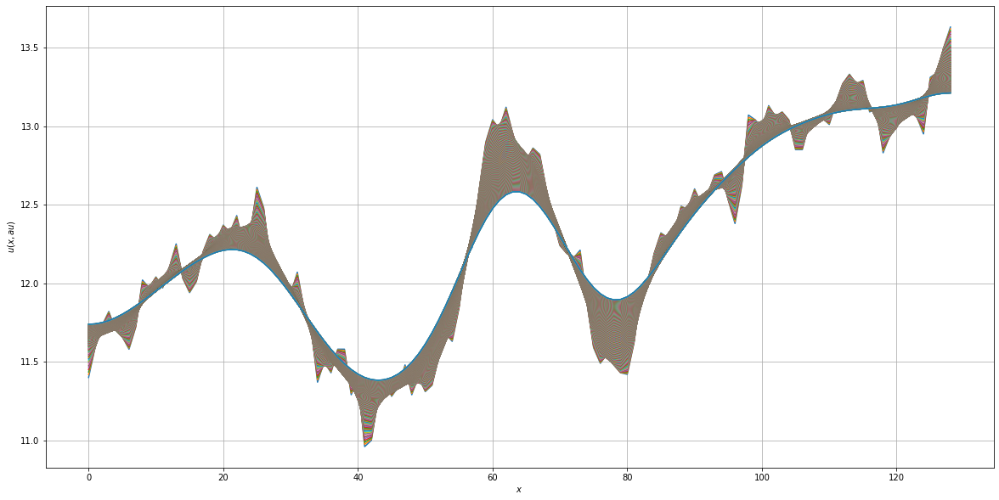

In [43]:
mtn6 = Neumann(CS, 500)

#### M = 1000

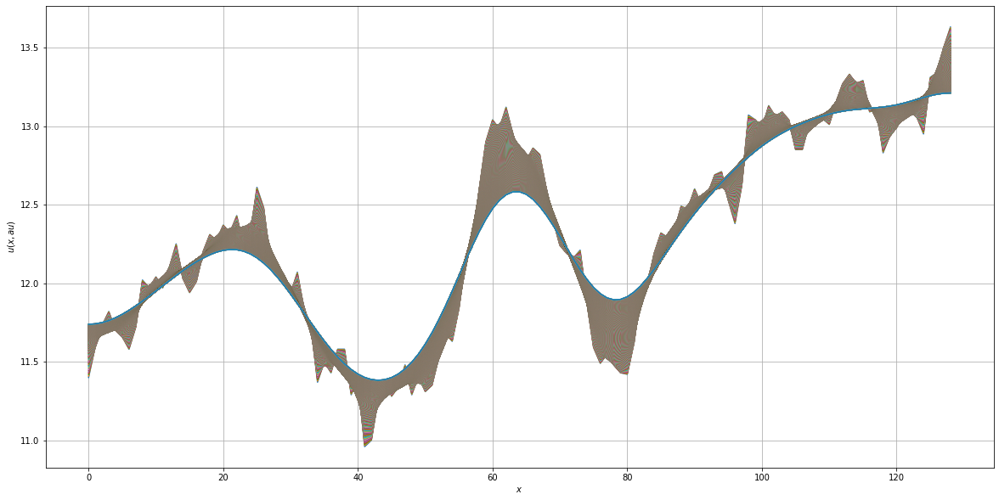

In [44]:
mtn7 = Neumann(CS, 1000)

#### M = 5000

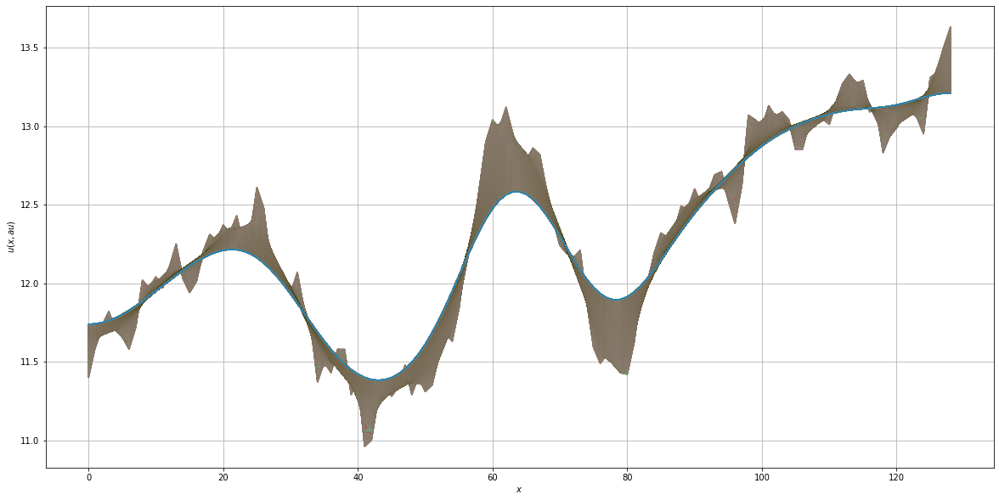

In [45]:
mtn8 = Neumann(CS, 5000)

### Effect of Changing Kappa $\left( \kappa \right)$ for Backward (Implicit) Method with Neumann Boundary Conditions
As with Dirichlet conditions, increasing the value of $\kappa$ enhances smoothing; however, using too large a $\kappa$ can cause too much smoothing to the point that the heat equation smoothing converges to a straight, horizontal line corresponding to the average price of the price curve. On the other hand, using too small a value for $\kappa$ will lead to very little smoothing, to the point that the smoothed curve will converge to the true stock price curve.

The following plots show the heat equation smoothing of the Credit Suisse stock price using $\kappa$ values of 0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, and 1000, holding all other parameters constant and using only 100 iterations for each.

#### $\kappa$ = 0.00001

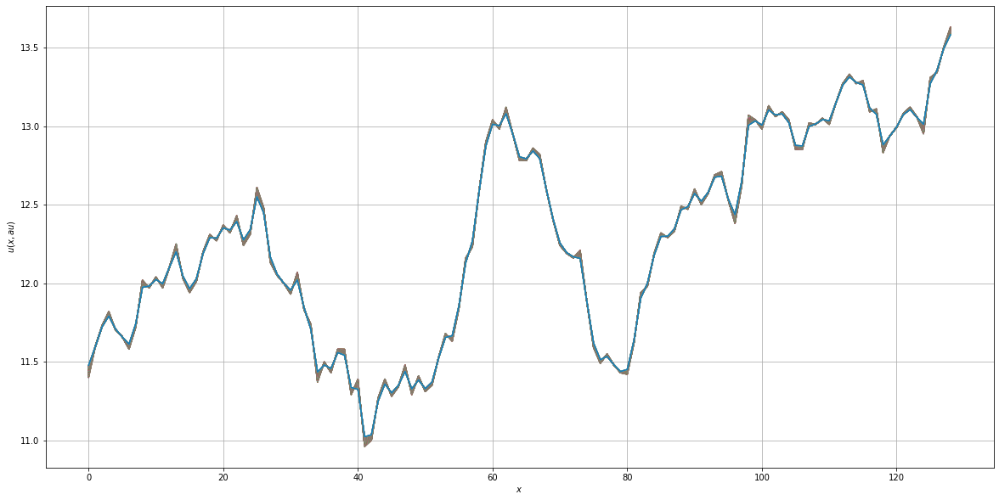

In [46]:
kappa = 0.00001
ktn9 = Neumann(CS, 100)

#### $\kappa$ = 0.0001

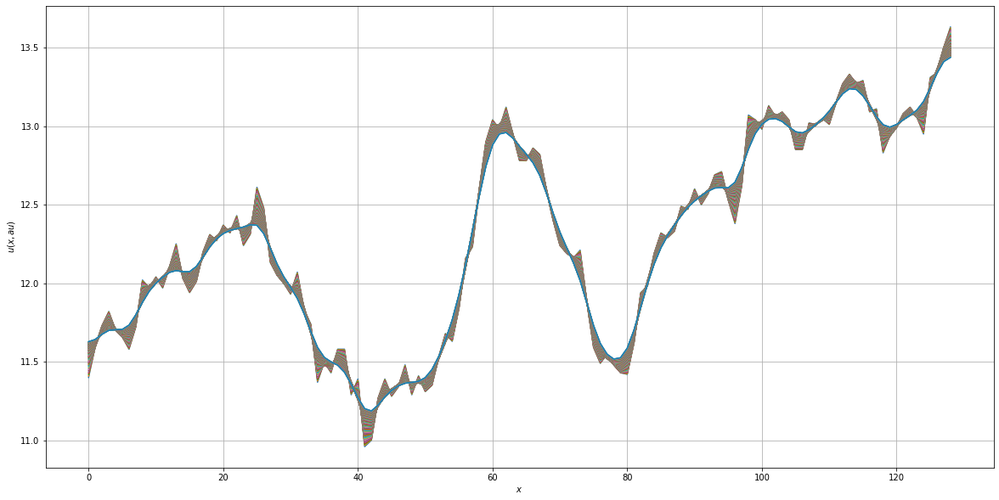

In [47]:
kappa = 0.0001
ktn8 = Neumann(CS, 100)

#### $\kappa$ = 0.001

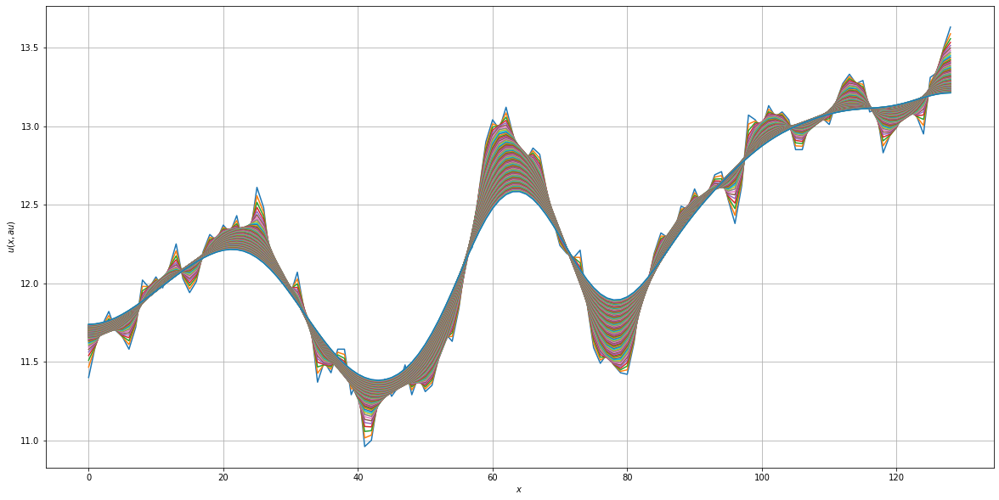

In [48]:
kappa = 0.001
ktn7 = Neumann(CS, 100)

#### $\kappa$ = 0.01

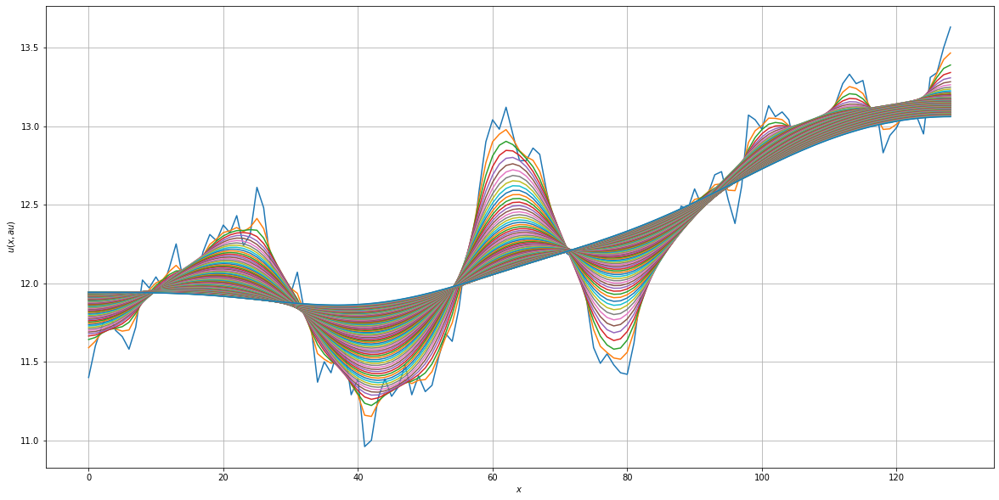

In [49]:
kappa = 0.01
ktn6 = Neumann(CS, 100)

#### $\kappa$ = 0.1

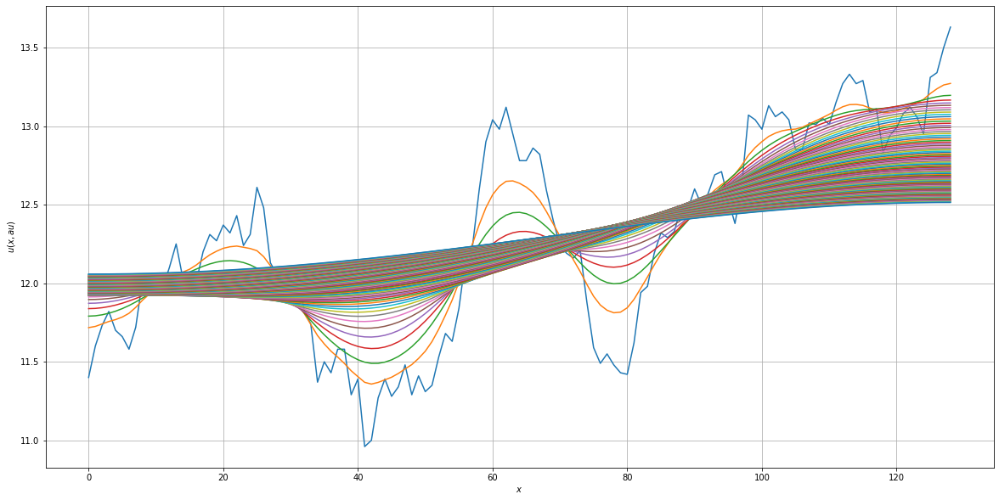

In [50]:
kappa = 0.1
ktn5 = Neumann(CS, 100)

#### $\kappa$ = 1

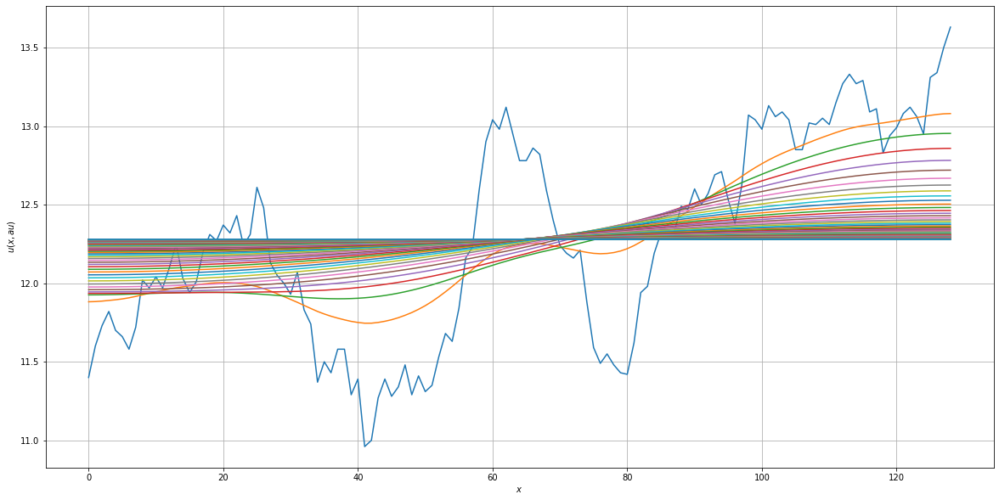

In [51]:
kappa = 1
ktn4 = Neumann(CS, 100)

#### $\kappa$ = 10

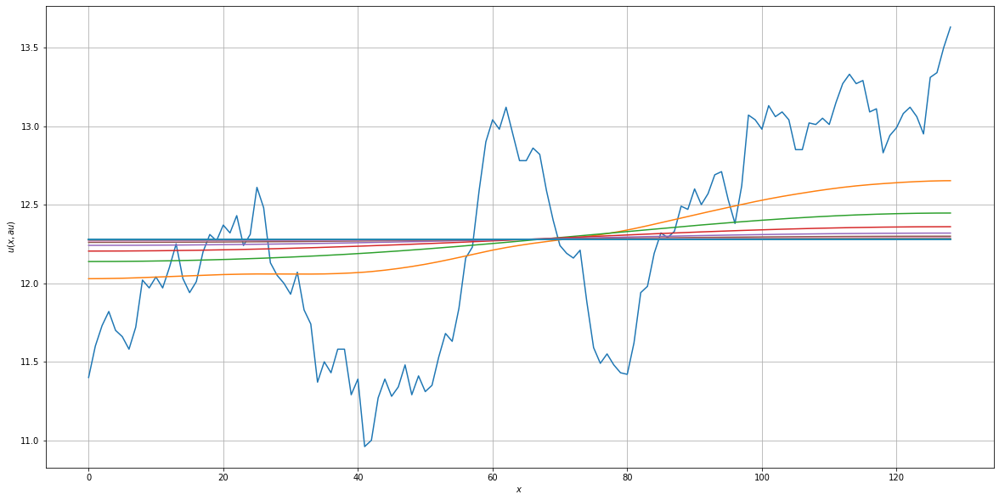

In [52]:
kappa = 10
ktn3 = Neumann(CS, 100)

#### $\kappa$ = 100

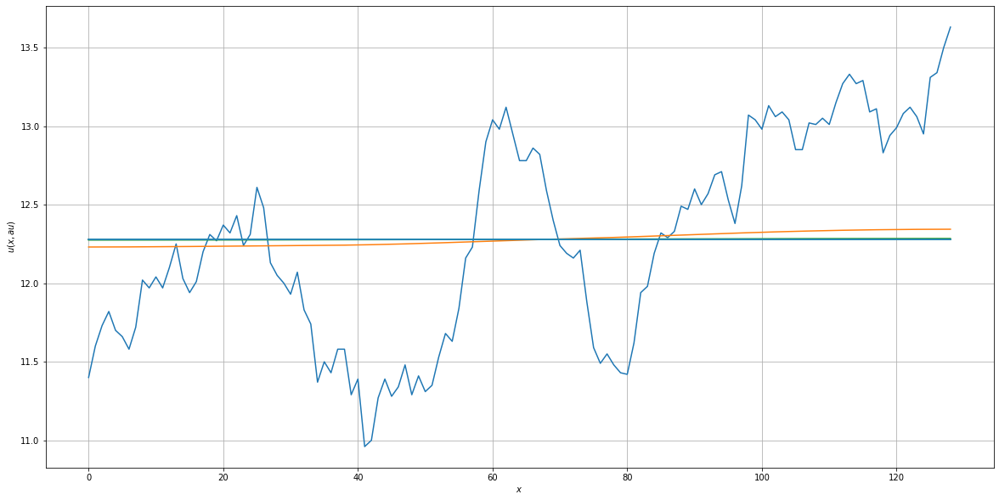

In [53]:
kappa = 100
ktn2 = Neumann(CS, 100)

#### $\kappa$ = 1000

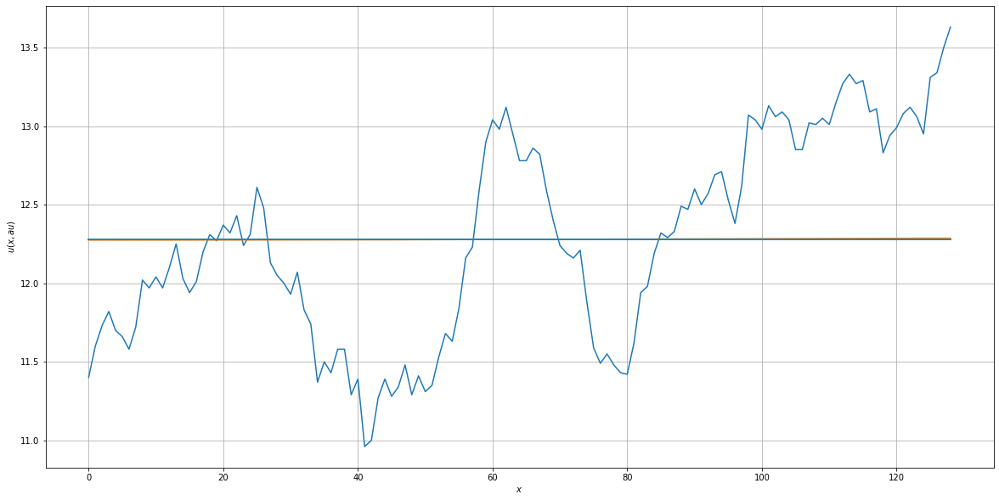

In [54]:
kappa = 1000
ktn1 = Neumann(CS, 100)

## Comparing the Backward (Implicit) Method with Dirichlet and Neumann Boundary Condition Curves
In order to compare the differences in the curves generated by the Dirichlet and Neumann boundary conditions, the resulting stock price vectors generated by both methods for a given stock using 100 iterations were combined into a dataframe along with the absolute difference between the prices generated by the two methods. This dataframe is shown for each trial and the curves generated by both methods were plotted together as well.

### Reset to Initial Parameters

In [55]:
a = 0 # "start"
b = 1 # "end"

kappa = 0.001 # how much we let the extreme points affect the smoothing
T = 1 # the length of the simulation - for how long are we running the smoothing / how long will the simulation take

### Function to Gather Resulting Dirichlet and Neumann Curves for Input Iterations M

In [56]:
def methodUVals(Ticker, M):
    x = range(1,len(Stock(Ticker)[1])+1)
    ud = Dirichlet(Ticker, M, False)
    un = Neumann(Ticker, M, False)
    absdiff = np.absolute(ud-un)
    
    return(pd.DataFrame({'x':x, 
                         'Dirichlet_Price':ud, 
                         'Neumann_Price':un,
                         '| Dirichlet - Neumann |':absdiff}))

### Function to Plot the Dirichlet and Neumann Curves Generated from methodUVals()

In [57]:
def compPlt(df, Ticker=0):    
    plt.figure(figsize=(20,10))  
    p = plt.grid(True)
    p = plt.xlabel('$x$')
    p = plt.ylabel('$u(x,\tau)$')
    
    if isinstance(Ticker, pd.DataFrame):
        u = Stock(Ticker)[1]
        p = plt.plot(df.x, u, 'k-', label='True Stock Price')
      
    p = plt.plot(df.x, df.Dirichlet_Price, 'r-', marker='o', label='Dirichlet Price')
    p = plt.plot(df.x, df.Neumann_Price, 'b-', marker='o', label='Neumann Price')
    p = plt.legend(loc='lower right', fontsize=18)
    
    return(p)

### Comparison of Dirichlet and Neumann Curves Generated for the same Stock with the same Number of Iterations
The results of this comparison show that starting and ending points of each curve differ, as would be expected since the Dirichlet boundary conditions specify the start and end price explicitly at the boundaries whereas the Neumann boundary conditions specify the partial derivative of the price at the boundaries. 

The results of this comparison also show that the difference between the estimates in the middle of the Dirichlet and Neumann boundary condition curves is very small. These differences are so small that, when the curves generated by the two different methods are plotted, the two curves appear to overlap. This is also to be expected.

#### JC Penney Stock

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,1.12,1.15704,0.0370419
11,1.13064,1.13493,0.0042935
21,1.02974,1.03034,0.000606727
31,0.779901,0.779564,0.000337543
41,0.631664,0.631185,0.000479431
51,0.673197,0.672564,0.000633101
61,0.879653,0.88049,0.000837216
71,0.905334,0.905026,0.000307788
81,0.966452,0.966517,6.50906e-05
91,1.02225,1.02236,0.000107208


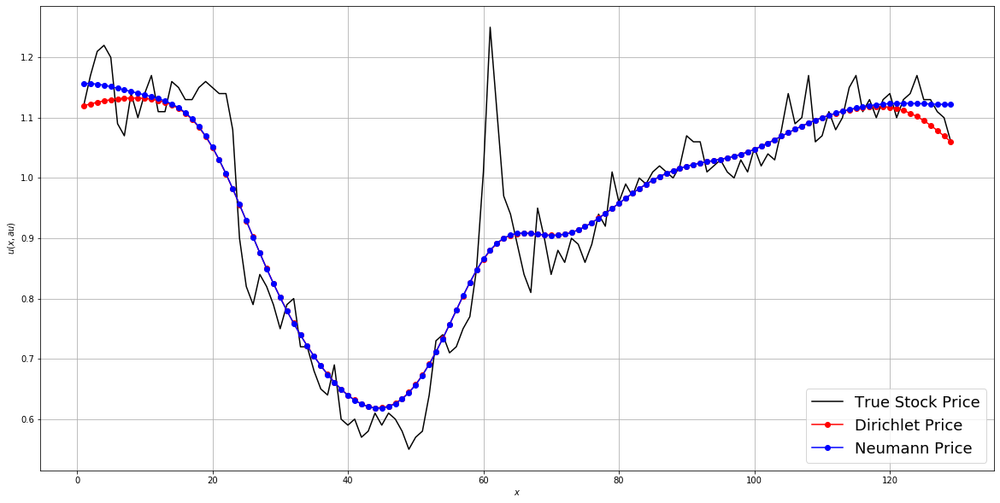

In [58]:
JCP_comp = methodUVals(JCP, 100)
compPlt(JCP_comp, JCP)
JCP_comp.iloc[range(0,130,10)].style.hide_index()

#### Costco Stock

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,261.43,265.137,3.70738
11,267.868,268.07,0.202357
21,276.973,277.008,0.0351261
31,276.673,276.678,0.00500935
41,274.604,274.562,0.0411526
51,285.856,285.872,0.0152013
61,292.499,292.53,0.0310987
71,289.177,289.147,0.0295425
81,294.209,294.215,0.00552727
91,298.555,298.562,0.00693299


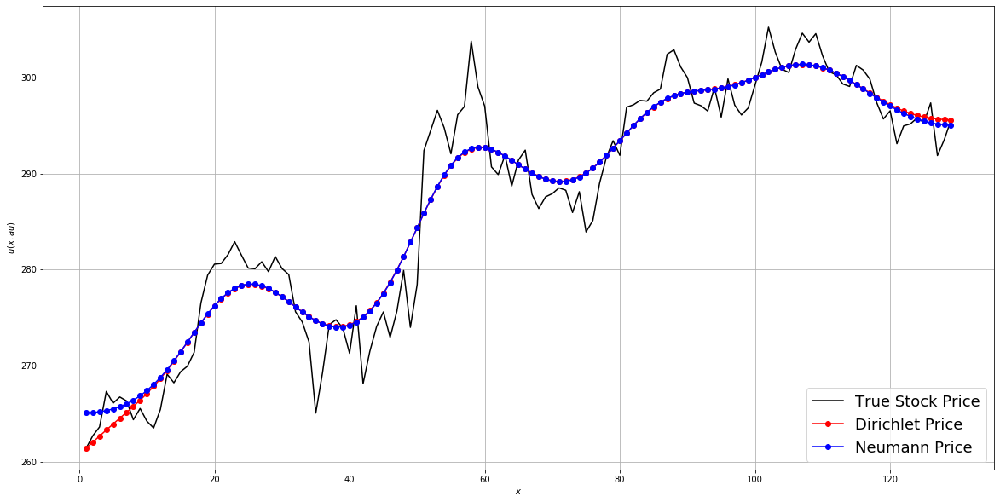

In [59]:
COST_comp = methodUVals(COST, 100)
compPlt(COST_comp, COST)
COST_comp.iloc[range(0,130,10)].style.hide_index()

#### Apple Stock

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,193.89,198.632,4.74191
11,200.428,200.764,0.336583
21,204.391,204.397,0.00567903
31,205.484,205.497,0.0125712
41,204.706,204.69,0.0160005
51,208.729,208.714,0.0150818
61,216.402,216.419,0.017205
71,221.248,221.234,0.0141344
81,229.505,229.494,0.0112066
91,242.38,242.375,0.00498214


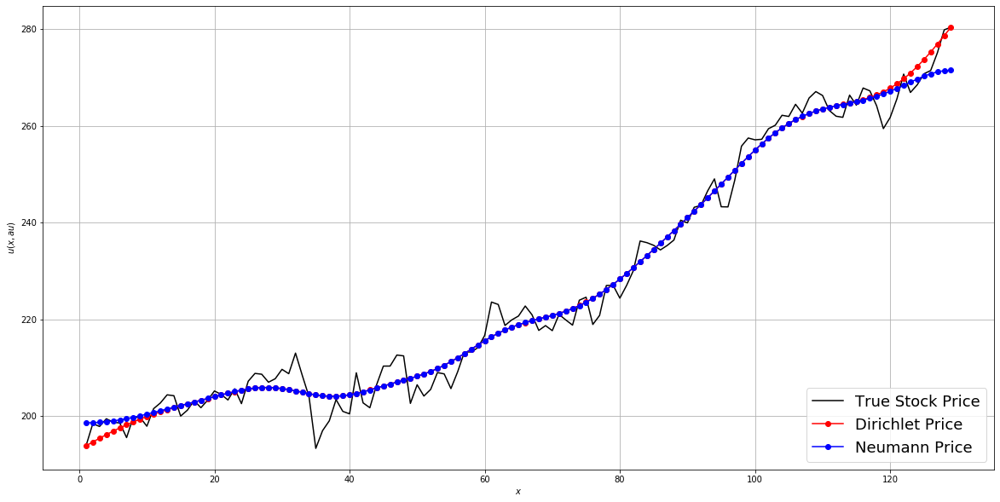

In [60]:
AAPL_comp = methodUVals(AAPL, 100)
compPlt(AAPL_comp, AAPL)
AAPL_comp.iloc[range(0,130,10)].style.hide_index()

#### Tesla Stock

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,225.03,223.532,1.49775
11,229.156,229.012,0.143792
21,244.575,244.651,0.0761745
31,239.751,239.754,0.00318816
41,227.701,227.691,0.0101166
51,222.907,222.845,0.0624201
61,235.409,235.451,0.0419542
71,239.641,239.625,0.0155678
81,248.14,248.064,0.0764272
91,284.368,284.347,0.0214425


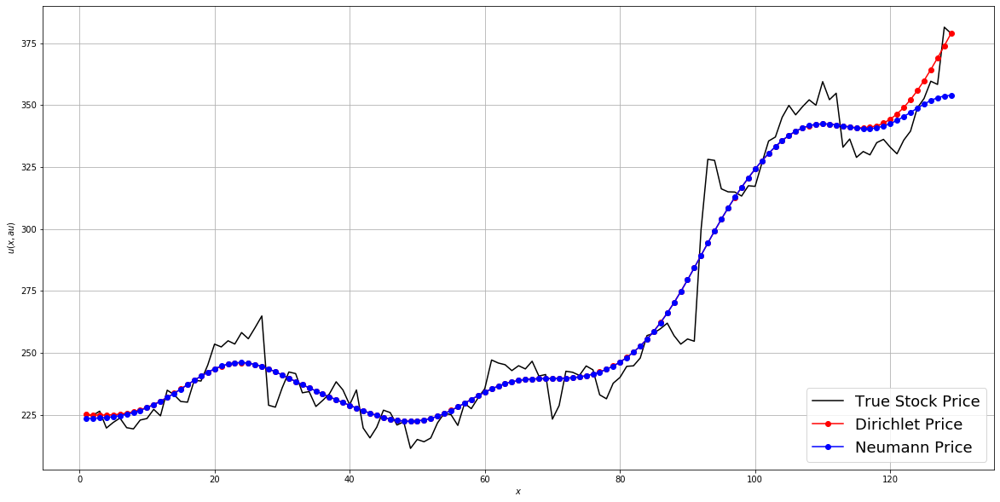

In [61]:
TSLA_comp = methodUVals(TSLA, 100)
compPlt(TSLA_comp, TSLA)
TSLA_comp.iloc[range(0,130,10)].style.hide_index()

#### Credit Suisse Stock

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7385,0.338453
11,11.9294,11.9508,0.0214102
21,12.2077,12.2094,0.00170343
31,11.9307,11.9314,0.000735347
41,11.4232,11.4212,0.0019822
51,11.6137,11.6112,0.00247253
61,12.4721,12.4759,0.00377997
71,12.2972,12.2979,0.000611234
81,11.9161,11.9128,0.00326273
91,12.4436,12.4443,0.00069436


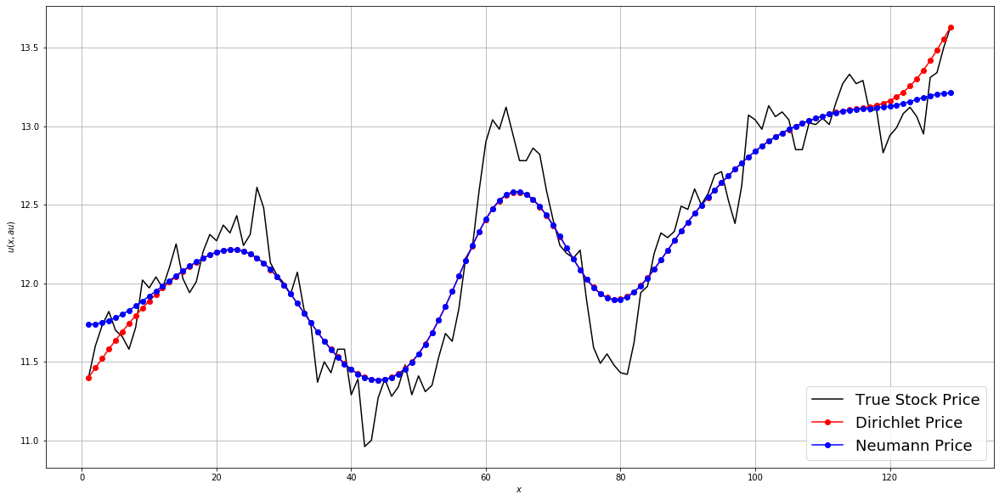

In [62]:
CS_comp = methodUVals(CS, 100)
compPlt(CS_comp, CS)
CS_comp.iloc[range(0,130,10)].style.hide_index()

### Effect of the Number of Iterations (M) on the Difference between the Dirichlet and Neumann Curves Generated for the same Stock
As the number of iterations used increases, the differences between the middle points of the Dirichlet and Neumann curves decrease, while the differences between the points close to the boundaries of the Dirichlet and Neumann curves appear to converge to a constant number. This is shown in the plots below, which show the curves generated by the heat equation smoothing of Credit Suisse stock under Dirichlet and Neumann boundary conditions with constant parameters for 1, 5, 10, 50, 100, 500, 1000, and 5000 iterations.

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7172,0.317175
11,11.9368,11.9645,0.0277228
21,12.2185,12.2222,0.00365697
31,11.9359,11.9366,0.000683632
41,11.4069,11.4053,0.00166484
51,11.5688,11.5669,0.00185132
61,12.5597,12.5628,0.00310097
71,12.2982,12.2986,0.000430848
81,11.8461,11.8435,0.00266594
91,12.4693,12.4697,0.000352188


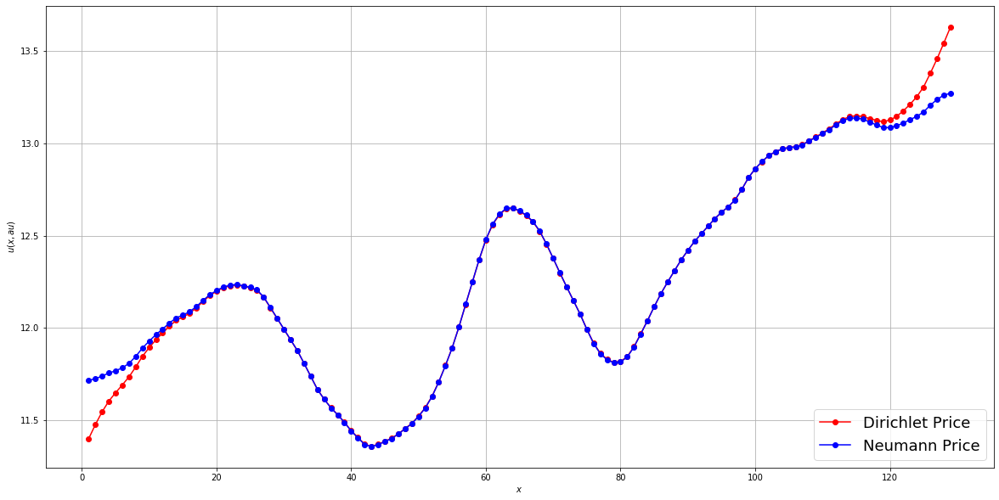

In [63]:
CS_comp1 = methodUVals(CS, 1)
compPlt(CS_comp1)
CS_comp1.iloc[range(0,130,10)].style.hide_index()

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7352,0.335182
11,11.9299,11.9531,0.0231831
21,12.2094,12.2114,0.00204242
31,11.9319,11.9326,0.000666749
41,11.4201,11.4182,0.00194077
51,11.6034,11.6011,0.00229959
61,12.49,12.4937,0.00364522
71,12.2988,12.2994,0.000604908
81,11.9016,11.8985,0.00313396
91,12.4497,12.4503,0.000602878


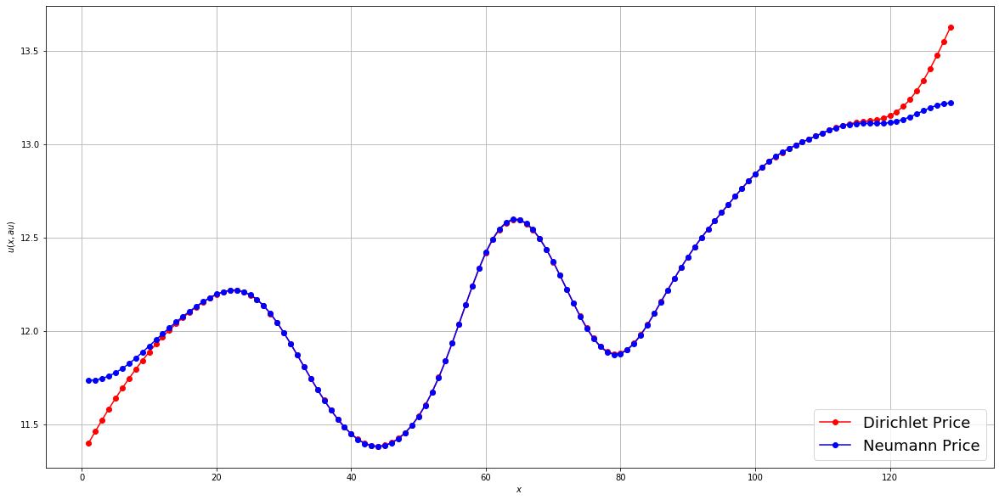

In [64]:
CS_comp2 = methodUVals(CS, 5)
compPlt(CS_comp2)
CS_comp2.iloc[range(0,130,10)].style.hide_index()

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7368,0.336817
11,11.9295,11.9518,0.0222747
21,12.2085,12.2103,0.00185263
31,11.9313,11.932,0.000697228
41,11.4218,11.4198,0.0019642
51,11.6086,11.6062,0.00238551
61,12.4806,12.4843,0.00371634
71,12.298,12.2986,0.000612378
81,11.9092,11.906,0.00320239
91,12.4466,12.4473,0.000647878


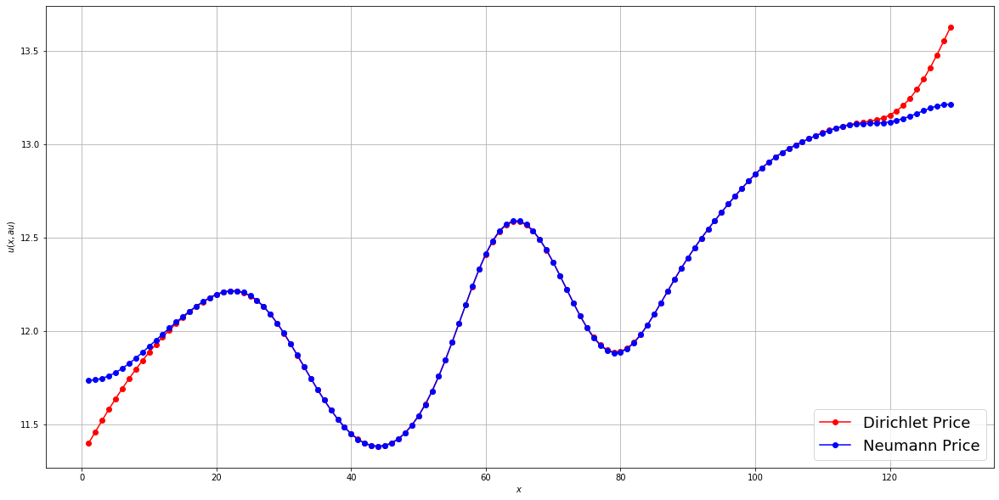

In [65]:
CS_comp3 = methodUVals(CS, 10)
compPlt(CS_comp3)
CS_comp3.iloc[range(0,130,10)].style.hide_index()

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7383,0.338259
11,11.9294,11.9509,0.0215064
21,12.2078,12.2095,0.00171849
31,11.9308,11.9315,0.000730607
41,11.423,11.4211,0.00198042
51,11.6131,11.6106,0.00246242
61,12.473,12.4768,0.00377299
71,12.2973,12.2979,0.000611689
81,11.9153,11.9121,0.00325617
91,12.444,12.4447,0.000688801


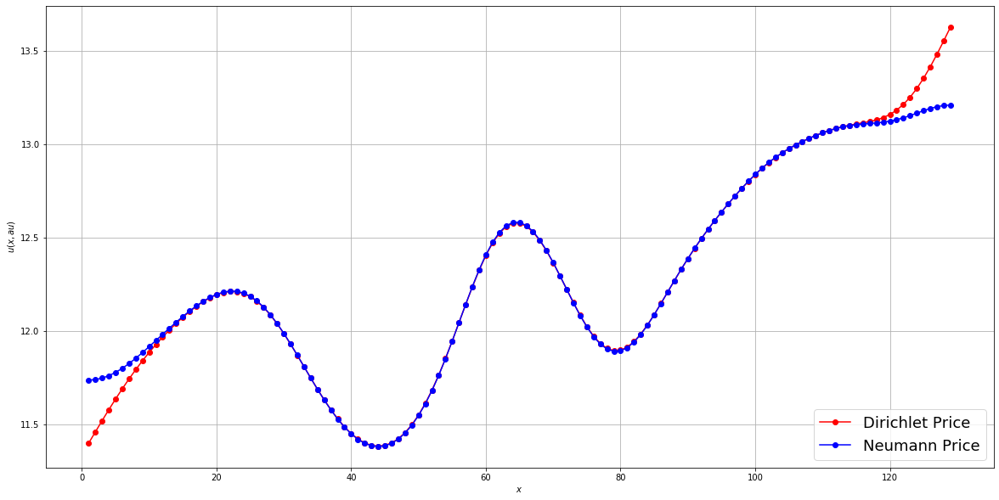

In [66]:
CS_comp4 = methodUVals(CS, 50)
compPlt(CS_comp4)
CS_comp4.iloc[range(0,130,10)].style.hide_index()

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7385,0.338453
11,11.9294,11.9508,0.0214102
21,12.2077,12.2094,0.00170343
31,11.9307,11.9314,0.000735347
41,11.4232,11.4212,0.0019822
51,11.6137,11.6112,0.00247253
61,12.4721,12.4759,0.00377997
71,12.2972,12.2979,0.000611234
81,11.9161,11.9128,0.00326273
91,12.4436,12.4443,0.00069436


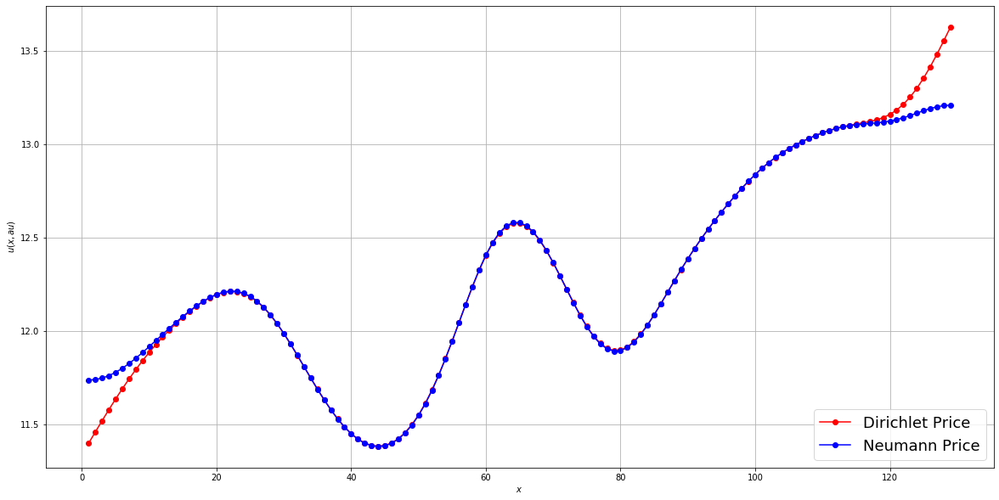

In [67]:
CS_comp5 = methodUVals(CS, 100)
compPlt(CS_comp5)
CS_comp5.iloc[range(0,130,10)].style.hide_index()

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7386,0.338611
11,11.9293,11.9507,0.0213335
21,12.2076,12.2093,0.00169173
31,11.9306,11.9314,0.000739223
41,11.4233,11.4213,0.00198358
51,11.6141,11.6117,0.00248067
61,12.4713,12.4751,0.00378553
71,12.2972,12.2978,0.00061082
81,11.9167,11.9134,0.00326794
91,12.4433,12.444,0.000698893


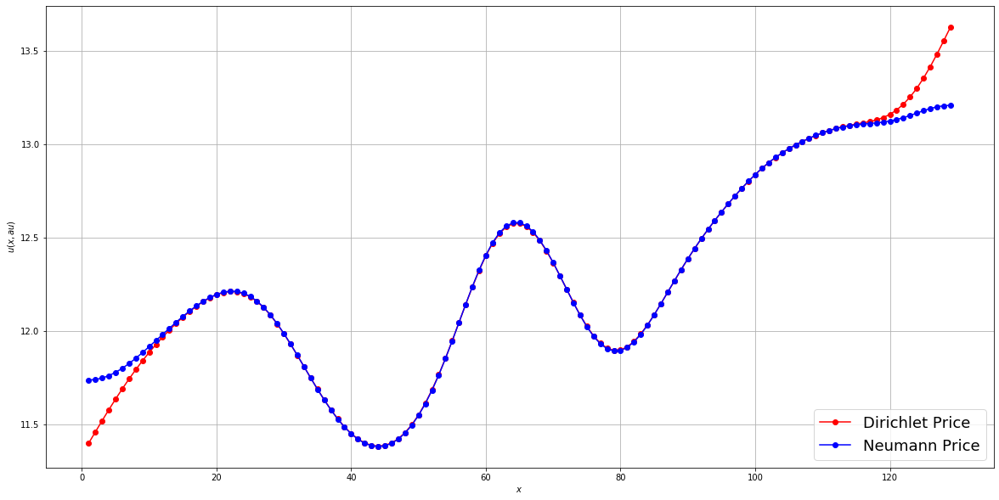

In [68]:
CS_comp6 = methodUVals(CS, 500)
compPlt(CS_comp6)
CS_comp6.iloc[range(0,130,10)].style.hide_index()

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7386,0.338631
11,11.9293,11.9507,0.021324
21,12.2076,12.2093,0.00169029
31,11.9306,11.9314,0.000739713
41,11.4233,11.4213,0.00198375
51,11.6142,11.6117,0.0024817
61,12.4712,12.475,0.00378623
71,12.2972,12.2978,0.000610765
81,11.9168,11.9135,0.00326859
91,12.4433,12.444,0.000699465


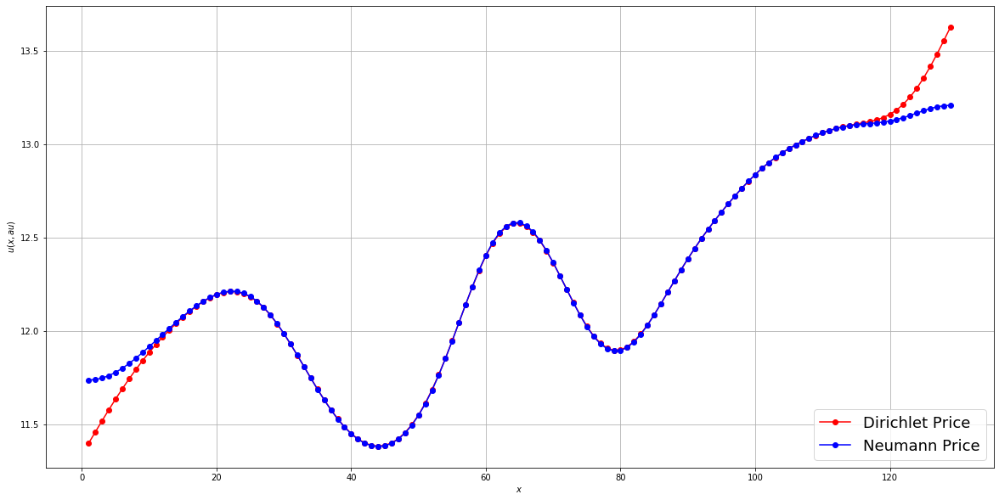

In [69]:
CS_comp7 = methodUVals(CS, 1000)
compPlt(CS_comp7)
CS_comp7.iloc[range(0,130,10)].style.hide_index()

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7386,0.338647
11,11.9293,11.9507,0.0213163
21,12.2076,12.2093,0.00168914
31,11.9306,11.9313,0.000740106
41,11.4233,11.4213,0.00198389
51,11.6142,11.6118,0.00248252
61,12.4711,12.4749,0.00378678
71,12.2972,12.2978,0.000610721
81,11.9169,11.9136,0.00326911
91,12.4433,12.444,0.000699923


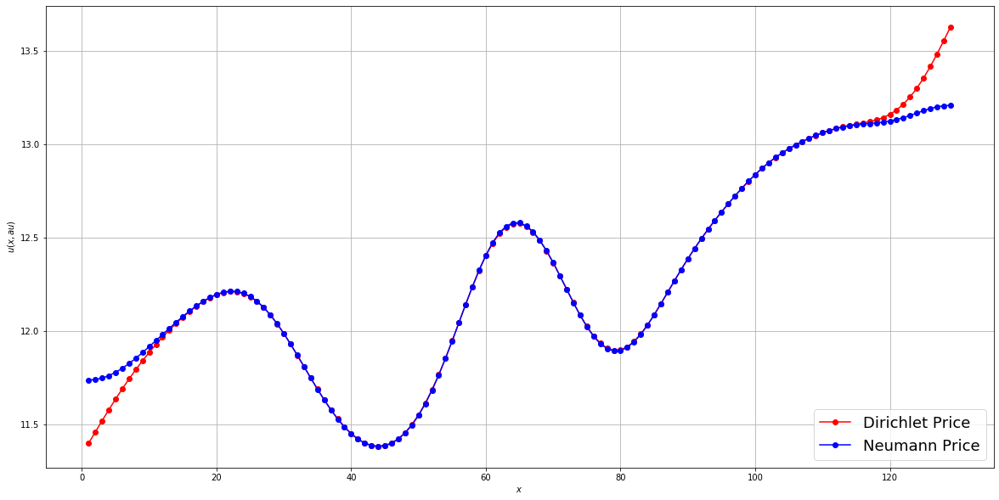

In [70]:
CS_comp8 = methodUVals(CS, 5000)
compPlt(CS_comp8)
CS_comp8.iloc[range(0,130,10)].style.hide_index()

### Effect of Kappa $\kappa$ on the Difference between the Dirichlet and Neumann Curves Generated for the same Stock
Increasing the value of $\kappa$ increases the difference between the Dirichlet and Neumann boundary condition curves. This is to be expected, as it was shown in the $\kappa$ effect plots for each method that

* For both Dirichlet and Neumann boundary condition curves, using too small a value for $\kappa$ will lead to very little smoothing to the point that both converge to the true stock price curve.
* Using too large a $\kappa$ can cause too much smoothing for both Dirichlet and Neumann boundary condition curves; however, the different boundary conditions converge to different curves from this.
    - The Dirichlet boundary condition curve will converge to a straight line connecting the first and last points of the true price curve.
    - The Neumann boundary condition curve will converge to a straight, horizontal line corresponding to the average price of the true price curve.

As such, both the Dirichlet and Neumann boundary condition curves for low values of $\kappa$ will mostly follow along with the true stock price curve and so the difference between the points of the two will be very low. However, as $\kappa$ is increased, the Dirichlet and Neumann boundary condition curves will begin to differentiate from one another based on their boundary conditions. Finally, when $\kappa$ is raised to a high enough level, the differences between the points of the Dirichlet and Neumann boundary condition curves will become significant even at the midpoints as the Dirchlet and Neumann boundary condition curves converge to different straight lines with one intersection.

The following plots show the heat equation smoothing using both Dirichlet and Neumann boundary condition curves of the Credit Suisse stock price using $\kappa$ values of 0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10 holding all other parameters constant and using only 100 iterations for each.

#### $\kappa$ = 0.00001

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.4777,0.0776596
11,12.0234,12.0236,0.000174605
21,12.3517,12.3519,0.0002023
31,11.9555,11.9553,0.000278153
41,11.3241,11.3248,0.000738649
51,11.3292,11.329,0.000246809
61,13.0116,13.012,0.00037838
71,12.2563,12.2561,0.000226131
81,11.4516,11.4511,0.000440723
91,12.5707,12.5711,0.000339557


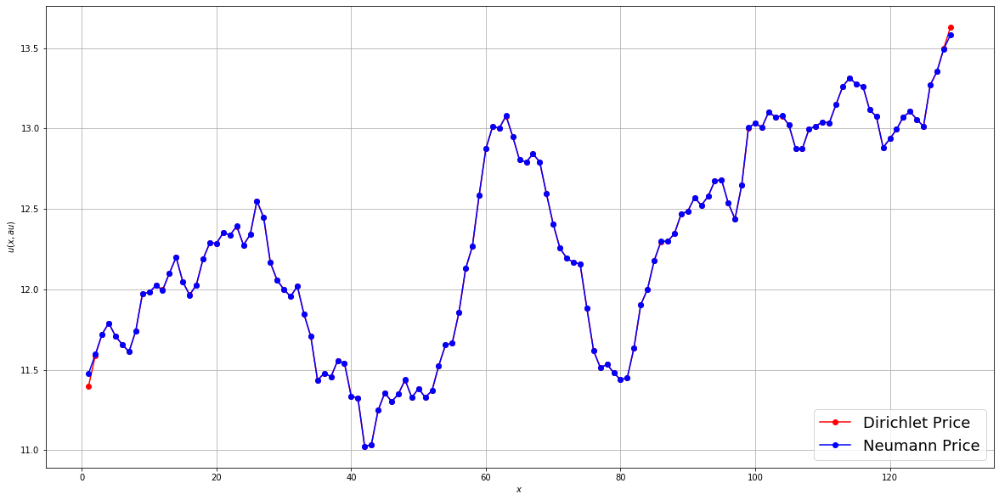

In [71]:
kappa = 0.00001
CS_compk1 = methodUVals(CS, 100)
compPlt(CS_compk1)
CS_compk1.iloc[range(0,130,10)].style.hide_index()

#### $\kappa$ = 0.0001

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.628,0.22801
11,11.9994,11.9997,0.000313041
21,12.3158,12.3161,0.000365491
31,11.974,11.9741,0.000142214
41,11.2706,11.2701,0.000507538
51,11.3996,11.3989,0.000737238
61,12.8781,12.8798,0.00170812
71,12.3247,12.3242,0.000490898
81,11.5882,11.5868,0.0013626
91,12.5235,12.5237,0.000216886


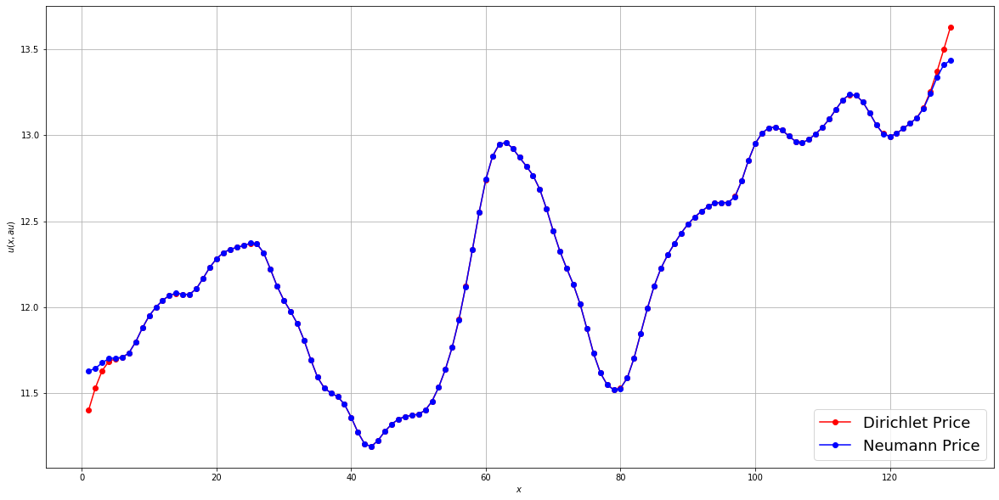

In [72]:
kappa = 0.0001
CS_compk2 = methodUVals(CS, 100)
compPlt(CS_compk2)
CS_compk2.iloc[range(0,130,10)].style.hide_index()

#### $\kappa$ = 0.001

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.7385,0.338453
11,11.9294,11.9508,0.0214102
21,12.2077,12.2094,0.00170343
31,11.9307,11.9314,0.000735347
41,11.4232,11.4212,0.0019822
51,11.6137,11.6112,0.00247253
61,12.4721,12.4759,0.00377997
71,12.2972,12.2979,0.000611234
81,11.9161,11.9128,0.00326273
91,12.4436,12.4443,0.00069436


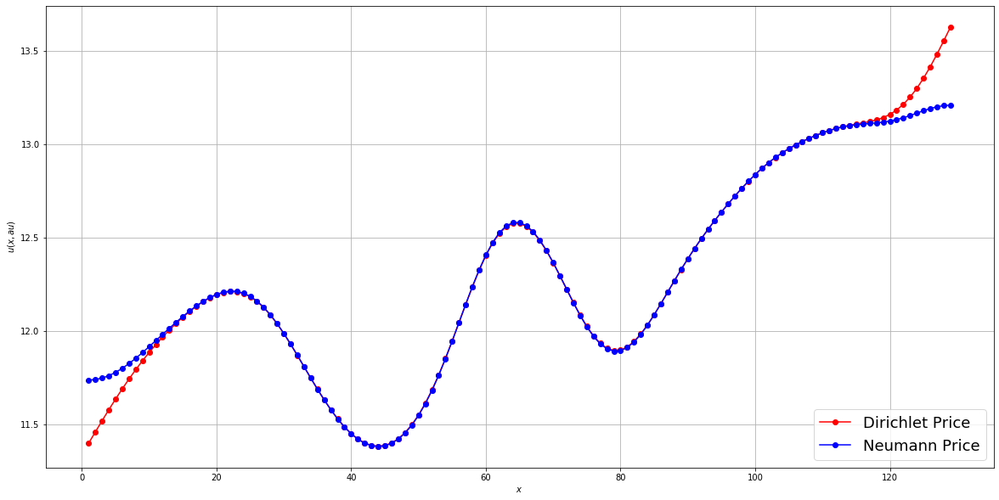

In [73]:
kappa = 0.001
CS_compk3 = methodUVals(CS, 100)
compPlt(CS_compk3)
CS_compk3.iloc[range(0,130,10)].style.hide_index()

#### $\kappa$ = 0.01

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,11.9417,0.541713
11,11.64,11.9384,0.298419
21,11.787,11.9163,0.129305
31,11.8326,11.8754,0.04287
41,11.8551,11.8646,0.00951538
51,11.9299,11.9308,0.000892565
61,12.0544,12.0545,0.00015411
71,12.1887,12.1879,0.000807499
81,12.3362,12.3314,0.00480382
91,12.5321,12.5148,0.0172758


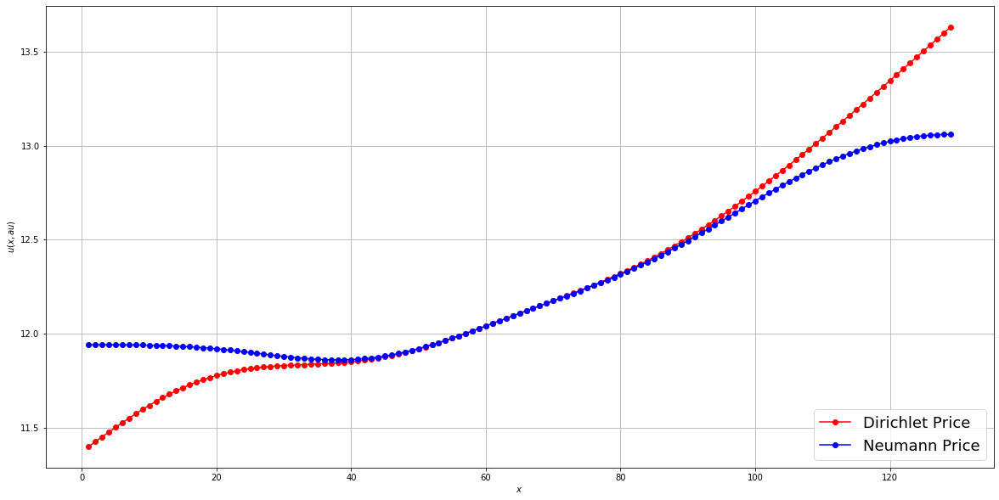

In [74]:
kappa = 0.01
CS_compk4 = methodUVals(CS, 100)
compPlt(CS_compk4)
CS_compk4.iloc[range(0,130,10)].style.hide_index()

#### $\kappa$ = 0.1

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,12.058,0.657972
11,11.5376,12.064,0.526405
21,11.6771,12.082,0.404896
31,11.8202,12.1112,0.290925
41,11.9688,12.1503,0.181521
51,12.1243,12.1976,0.0732869
61,12.2882,12.2507,0.0375045
71,12.4613,12.3066,0.154744
81,12.6442,12.362,0.282227
91,12.8365,12.4132,0.42334


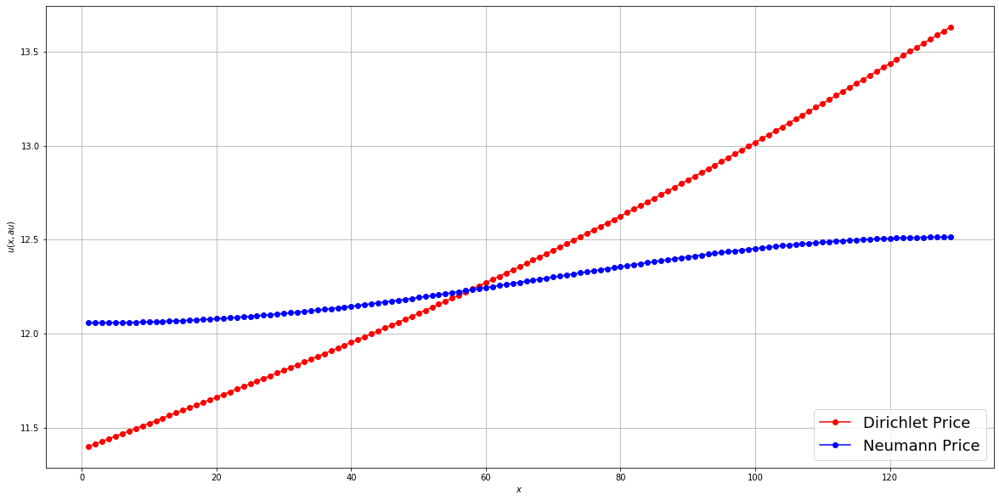

In [75]:
kappa = 0.1
CS_compk5 = methodUVals(CS, 100)
compPlt(CS_compk5)
CS_compk5.iloc[range(0,130,10)].style.hide_index()

#### $\kappa$ = 1

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,12.2793,0.879299
11,11.5742,12.2793,0.705089
21,11.7484,12.2793,0.530882
31,11.9226,12.2793,0.356676
41,12.0968,12.2793,0.182472
51,12.2711,12.2793,0.00826722
61,12.4453,12.2793,0.165938
71,12.6195,12.2794,0.340145
81,12.7937,12.2794,0.514354
91,12.9679,12.2794,0.688566


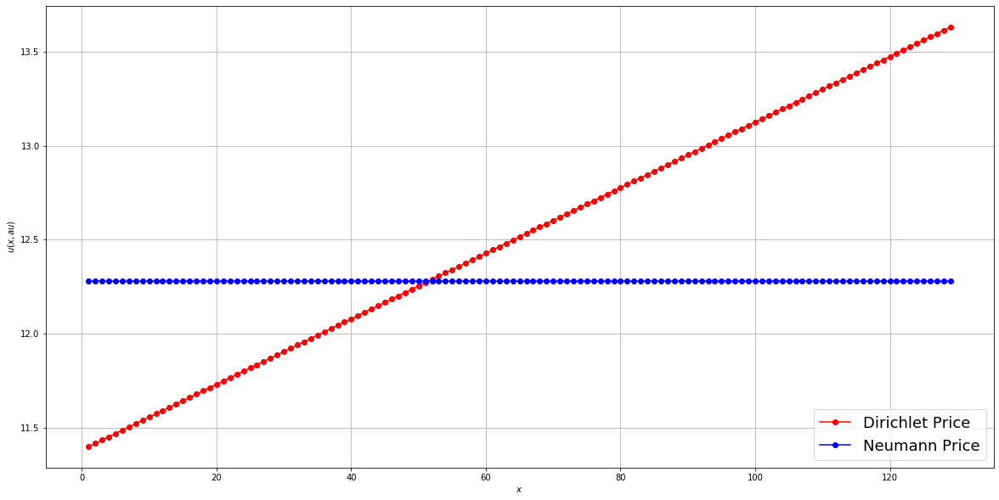

In [76]:
kappa = 1
CS_compk5 = methodUVals(CS, 100)
compPlt(CS_compk5)
CS_compk5.iloc[range(0,130,10)].style.hide_index()

#### $\kappa$ = 10

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,12.2793,0.879299
11,11.5742,12.2793,0.705089
21,11.7484,12.2793,0.530882
31,11.9226,12.2793,0.356676
41,12.0968,12.2793,0.182472
51,12.2711,12.2793,0.00826722
61,12.4453,12.2793,0.165938
71,12.6195,12.2794,0.340145
81,12.7937,12.2794,0.514354
91,12.9679,12.2794,0.688566


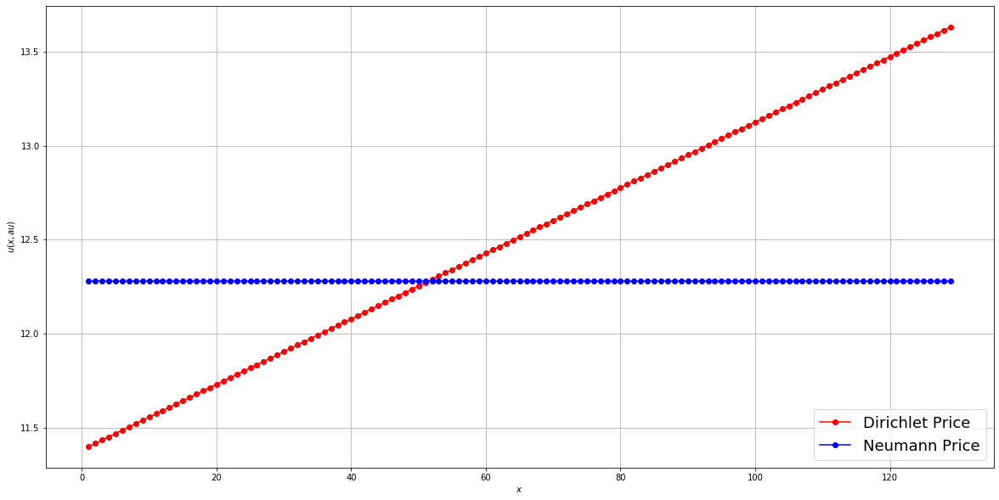

In [77]:
kappa = 1
CS_compk6 = methodUVals(CS, 100)
compPlt(CS_compk6)
CS_compk6.iloc[range(0,130,10)].style.hide_index()

## Conclusions
From the work done in this project, the following results were obtained

### Dirichlet Boundary Conditions
- As the number of iterations increases, the smoothing is enhanced
- As the $\kappa$ value increases, the smoothing is enhanced; however, if increased too much, there is risk of over-smoothing to the point that the smoothed curve is a straight line connecting the start and end stock prices of the true stock price curve.
- As the $\kappa$ value decreases, the smoothing is decreased and, if $\kappa$ is decreased too much, the curve generated by the Dirichlet boundary conditions will converge with the true stock price curve.

### Neumann Boundary Conditions
- As the number of iterations increases, the smoothing is enhanced
- As the $\kappa$ value increases, the smoothing is enhanced; however, if increased too much, there is risk of over-smoothing to the point that the smoothed curve is a straight, horizontal line with a vertical value equal to the average of the true stock price curve.
- As the $\kappa$ value decreases, the smoothing is decreased and, if $\kappa$ is decreased too much, the curve generated by the Dirichlet boundary conditions will converge with the true stock price curve.

### Difference between Dirichlet and Neumann Boundary Conditions
- As the number of iterations increases, the differences between the middle points of the Dirichlet and Neumann boundary condition curves decrease, while the points close to the boundary appear to converge to a constant.
- As the $\kappa$ value increases, the differences between the points of the Dirichlet and Neumann boundary condition curves generally increase.

## Future Work
Potential extensions of this project include
- Implementing forward (explicit) and/or Crank-Nicholson methods to compare with the backward (implicit) method (See appendices 1 and 2 for an example of this).
- Implementing the implicit method with Neumann boundary conditions using the method of sweeps rather than using matrix solver from NumPy (See appendix 3 for an attempt at this).
- Extending the Neumann boundary conditions to incorporate a larger number of points.
- Combining Dirichlet and Neumann boundary conditions (ie. Setting the left boundary to a Dirichlet condition and the right boundary to a Neumann condition, use Dirichlet for the first 5 iterations and Neumann for iterations beyond 5, etc.) and seeing how that impacts the generated stock price curves.

## Appendix 1: Forward (Explicit) Method using Neumann Boundary Conditions
It was shown previously that $A_{\text{Explicit}}$ is

$$
A_{\text{Explicit}} = 
\begin{bmatrix}
1-\frac{7}{2}\rho & 4p & -\frac{1}{2}\rho & 0 & 0 & \cdots & 0 \\
\rho & 1-2\rho & \rho & 0 & 0 & \cdots & 0 \\
0 & \rho & 1-2\rho & \rho & 0 & \cdots & 0 \\
\vdots & & \ddots & \ddots & \ddots & & \vdots \\
0 & \cdots & 0 & \rho & 1-2\rho & \rho & 0 \\
0 & \cdots & 0 & 0 & \rho & 1-2\rho & \rho \\
0 & \cdots & 0 & 0 & -\frac{1}{2}\rho & 4p & 1-\frac{7}{2}\rho
\end{bmatrix}
$$

In this section, this matrix will be set up and used to implement the forward (implicit) method $A_{\text{Explicit}}\overrightarrow{u}(x_i, \tau_i)=\overrightarrow{u}(x_i, \tau_i+\Delta \tau)$ using Neumann boundary conditions.

### Implementation

#### Code to Set Up the $A_{Explicit}$ Matrix

In [78]:
# Establish the A matrix for implicit scheme with Neumann boundary conditions
def setUpExplicitNeumannA(N, rho):
    # Initialize a (N+1) by (N+1) matrix of 0s for A
    A = np.zeros((N+1, N+1))
    
    # Generate the first row of matrix A from the boundary conditions
    A[0][0:3] = [1-((7/2)*rho), (4*rho), (-0.5*rho)]
    # Generate the last row of matrix A from the boundary conditions
    A[N][N-2:N+1] = [(-0.5*rho), (4*rho), (1-(7/2)*rho)]
    # Fill in the rest of the A matrix as expected for the implicit method
    for i in range(0,N-1):
        j = i+1
        A[j][j-1:j+2] = [rho, (1-(2*rho)), rho]
    
    return(A)

#### Main Neumann Function for Forward (Explicit) Method

In [79]:
def ExplicitNeumann(Stock_or_Rate, M, plot=True):
    # M = number of simulations/iterations - if M is large enough it will go very little ahead in time for each iteration
    
    x, u = Stock(Stock_or_Rate) # Stock Prices
    #x, u = Rate(Stock_or_Rate) # Exchange Rates
    res = np.zeros((len(u), M)) # Initialize matrix res, which holds the vector of stock prices generated for each iteration
    
    # Set N equal to 1 less than the length of the u-vector
    N = len(u)-1
       
    dX = (b-a)/N # the distance between each closing price - i.e. time between daily closing prices
    dT = T/M # the distance in time between each iteration
    rho = kappa*dT/(dX*dX)
    
    A = setUpExplicitNeumannA(N, rho)
    
    if plot:
        plt.figure(figsize=(20,10))  
        plt.plot(x, u)

    for j in range(M):
        u = np.matmul(A, u)
        res[:,j] = u # Store the vector of stock prices generated for this iteration in column j of matrix res
        
        if plot:
            plt.plot(x, u)
            plt.grid(True)
            plt.xlabel('$x$')
            plt.ylabel('$u(x,\tau)$')
    
    if plot:
        plt.show()
    
    # Return the last column of matrix res (The vector of prices from the final iteration)
    return(res[:,M-1])

### Test Neumann Conditions on Forward (Explicit) Method Function Plot Output

#### Reset to Initial Parameters

In [80]:
a = 0 # "start"
b = 1 # "end"

kappa = 0.001 # how much we let the extreme points affect the smoothing
T = 1 # the length of the simulation - for how long are we running the smoothing / how long will the simulation take

#### Costco Stock

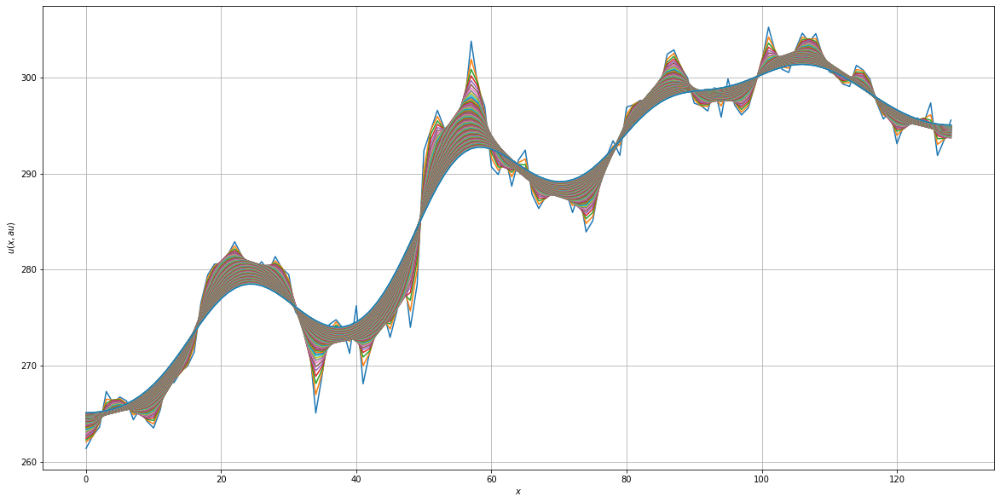

In [81]:
cne = ExplicitNeumann(COST, 100)

#### JC Penney Stock

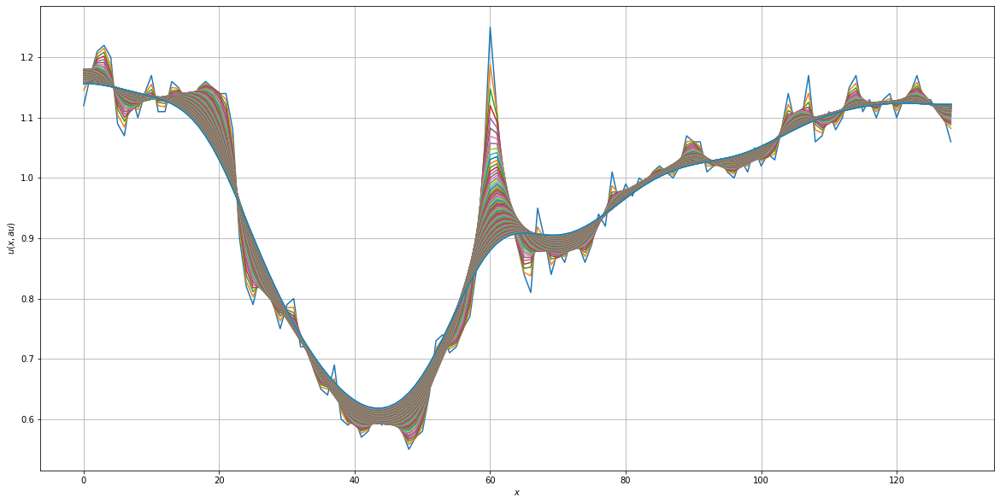

In [82]:
jne = ExplicitNeumann(JCP,100)

#### Apple Stock

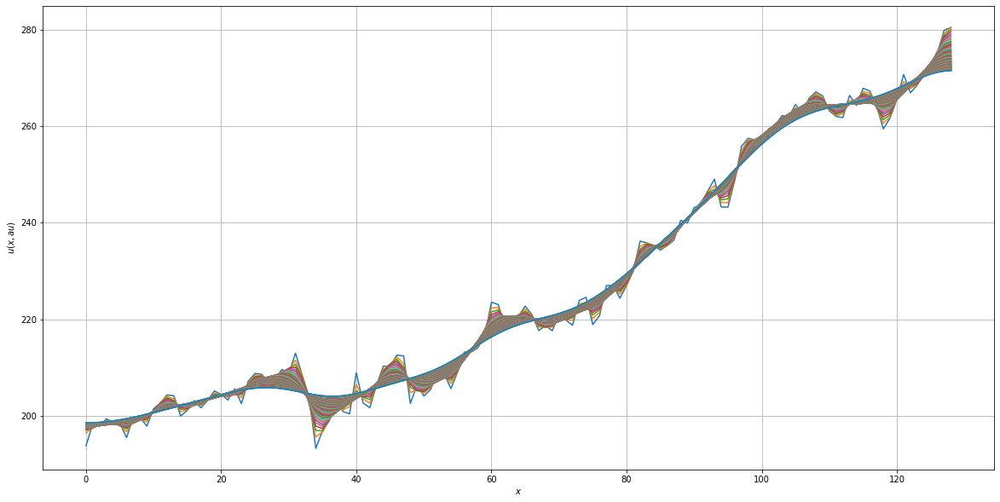

In [83]:
ape = ExplicitNeumann(AAPL, 100)

#### Tesla Stock

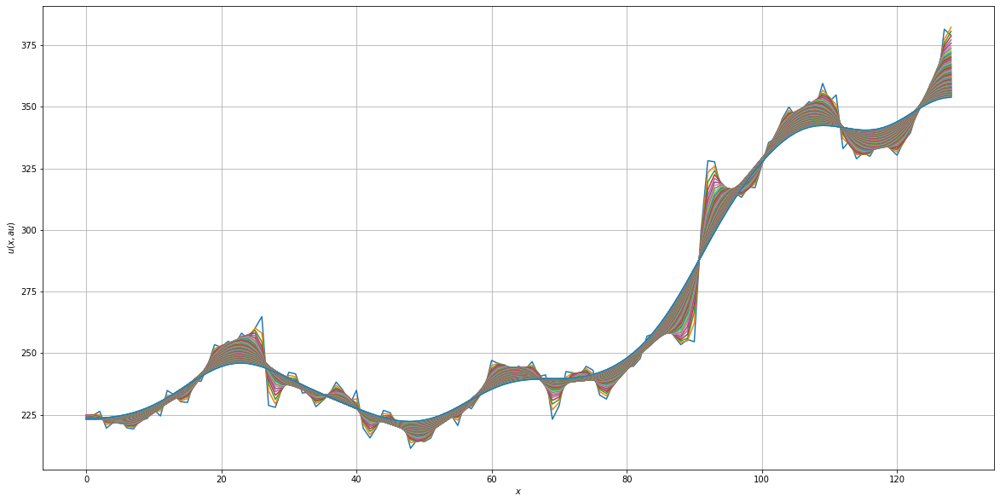

In [84]:
tne = ExplicitNeumann(TSLA, 100)

#### Credit Suisse Stock

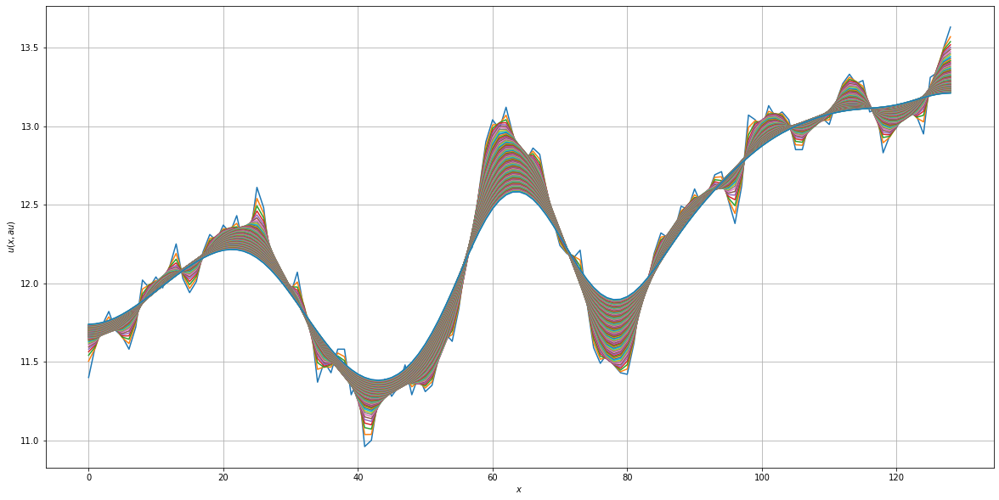

In [85]:
csne = ExplicitNeumann(CS, 100)

### Effect of Changing the Number of Iterations (M) for Forward (Explicit) Method with Neumann Boundary Conditions

In general it can be seen that as the number of iterations increases, the smoothing also increases. However, unlike the backward (implicit) method which is unconditionally stable, the forward (explicit) method is conditionally stable and this property is demonstrated by the use of increasing numbers of iterations. Specifically, using too low a number of iterations causes the explicit method to become unstable.

This is shown in the plots below, which show the heat equation smoothing of Credit Suisse stock under constant initial conditons for 1, 5, 10, 50, 100, 500, 1000, and 5000 iterations.

#### M = 1

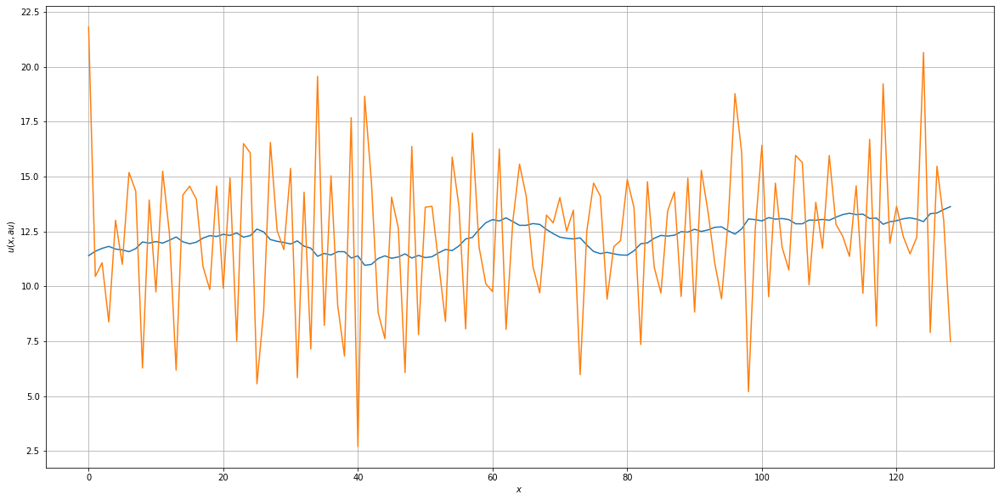

In [86]:
mtne1 = ExplicitNeumann(CS, 1)

#### M = 5

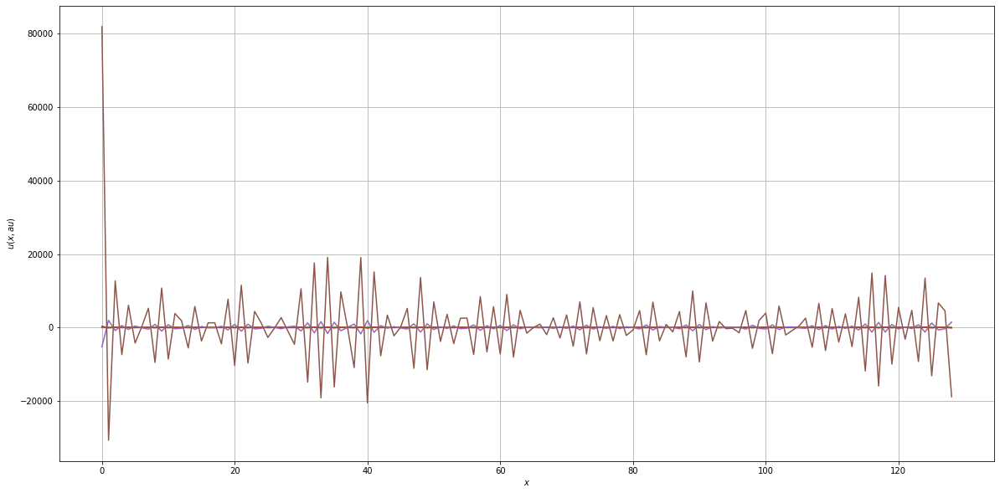

In [87]:
mtne2 = ExplicitNeumann(CS, 5)

#### M = 10

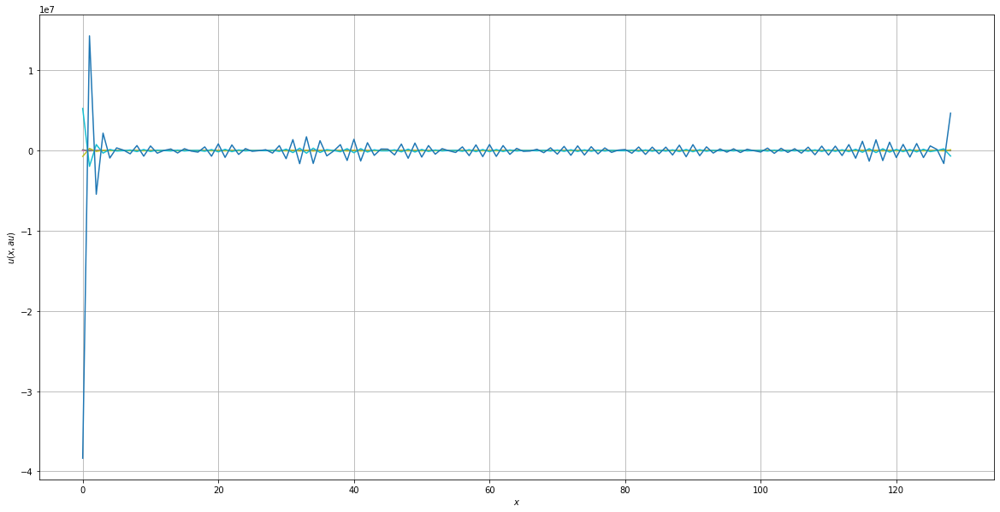

In [88]:
mtne3 = ExplicitNeumann(CS, 10)

#### M = 50

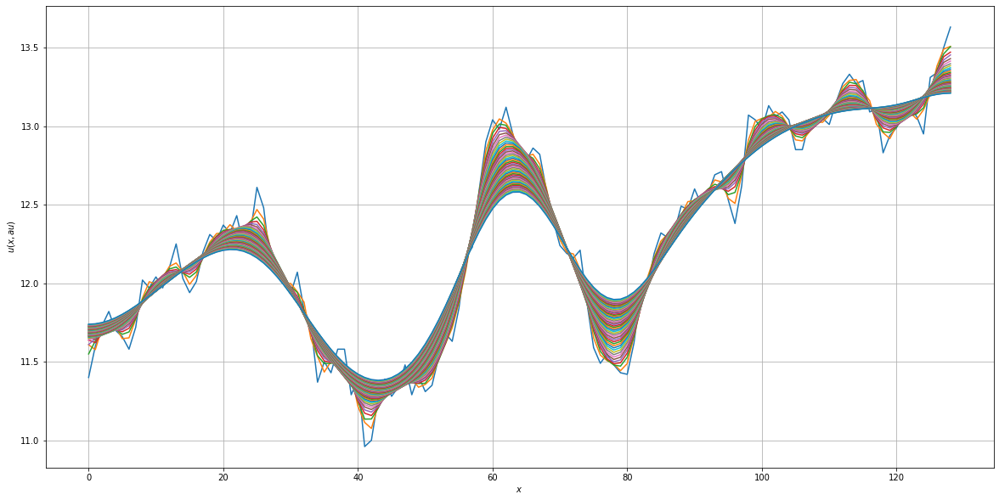

In [89]:
mtne4 = ExplicitNeumann(CS, 50)

#### M = 100

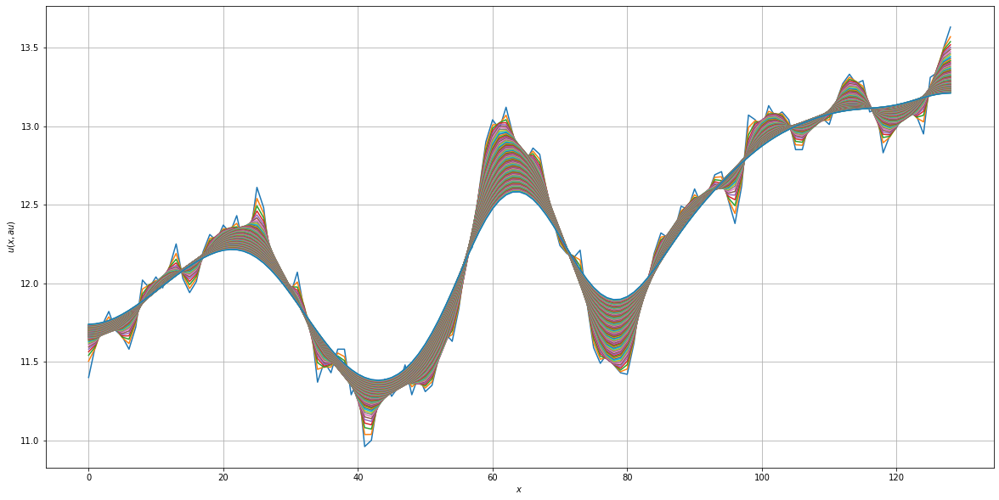

In [90]:
mtne5 = ExplicitNeumann(CS, 100)

#### M = 500

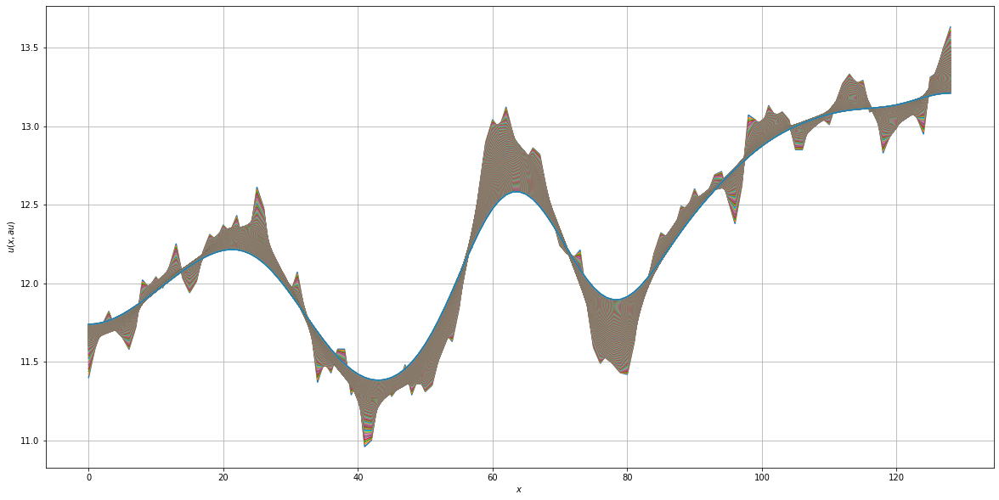

In [91]:
mtne6 = ExplicitNeumann(CS, 500)

#### M = 1000

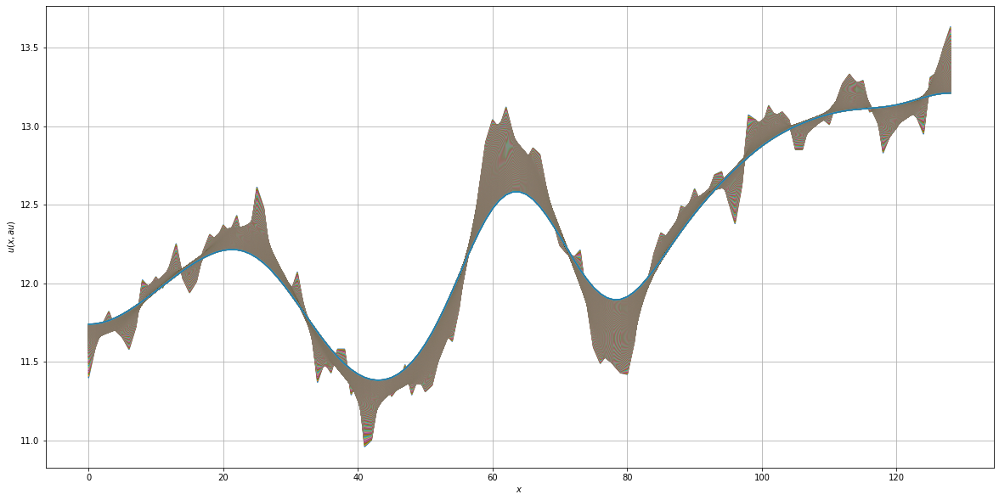

In [92]:
mtne7 = ExplicitNeumann(CS, 1000)

#### M = 5000

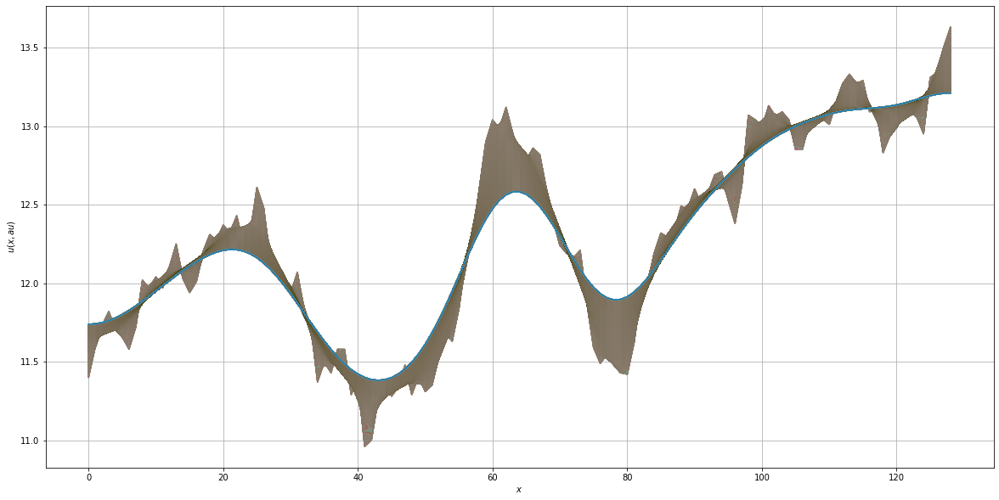

In [93]:
mtne8 = ExplicitNeumann(CS, 5000)

### Effect of Changing Kappa $\left( \kappa \right)$ for Forward (Explicit) Method with Neumann Boundary Conditions

Increasing the value of $\kappa$ enhances smoothing; however, using too large a $\kappa$ causes the forward (explicit) method to become unstable. On the other hand, using too small a value for  𝜅  will lead to very little smoothing, to the point that the smoothed curve will converge to the true stock price curve.

This is shown in the plots below, which show the heat equation smoothing of Credit Suisse stock under constant initial conditons using $\kappa$ values of 0.00001, 0.0001, 0.001, 0.01, 0.1, and 1.

#### $\kappa$ = 0.00001

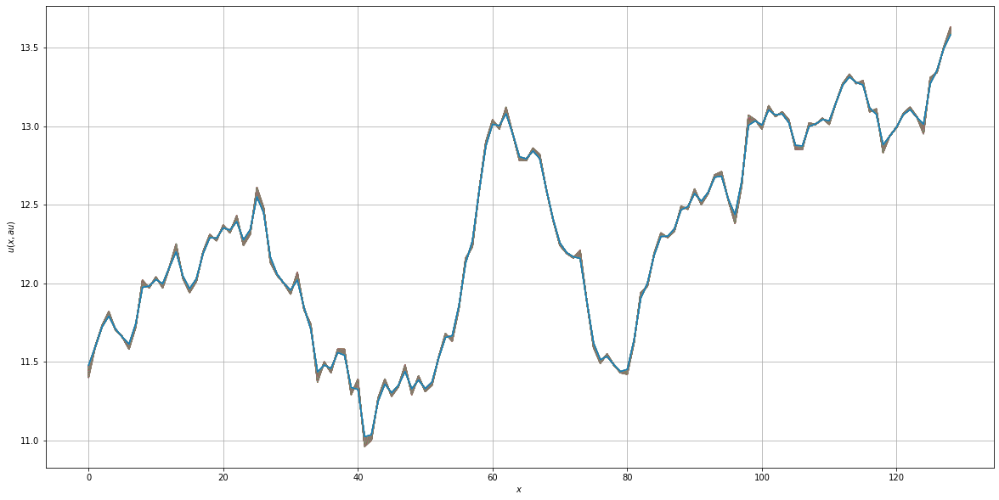

In [94]:
kappa = 0.00001
ktne9 = ExplicitNeumann(CS, 100)

#### $\kappa$ = 0.0001

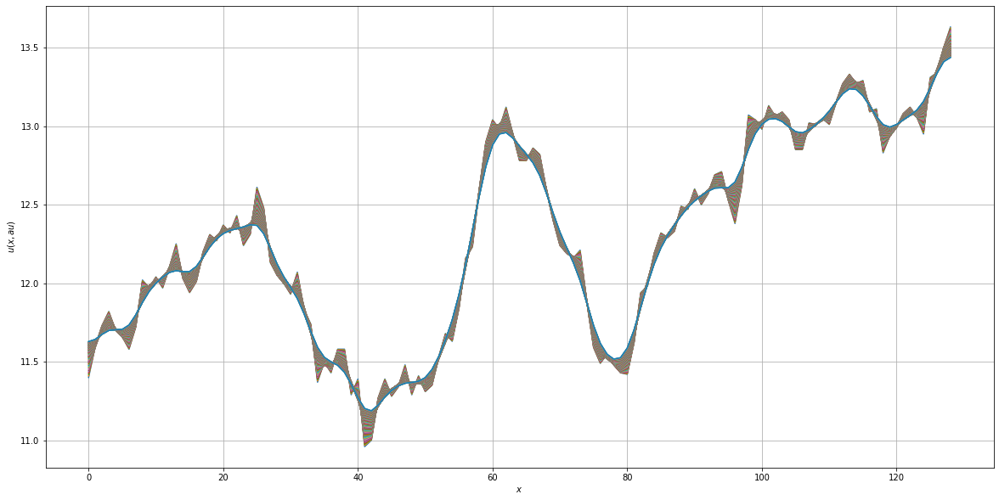

In [95]:
kappa = 0.0001
ktne8 = ExplicitNeumann(CS, 100)

#### $\kappa$ = 0.001

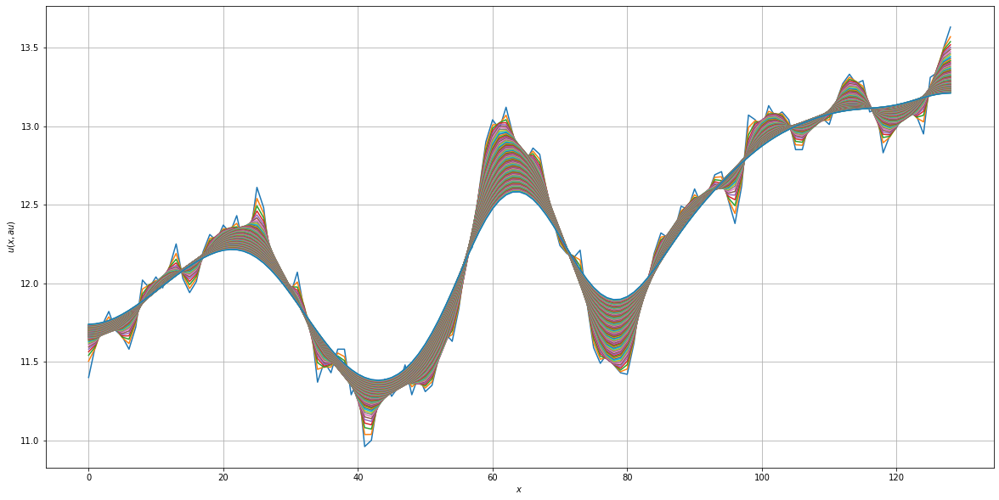

In [96]:
kappa = 0.001
ktne7 = ExplicitNeumann(CS, 100)

#### $\kappa$ = 0.01

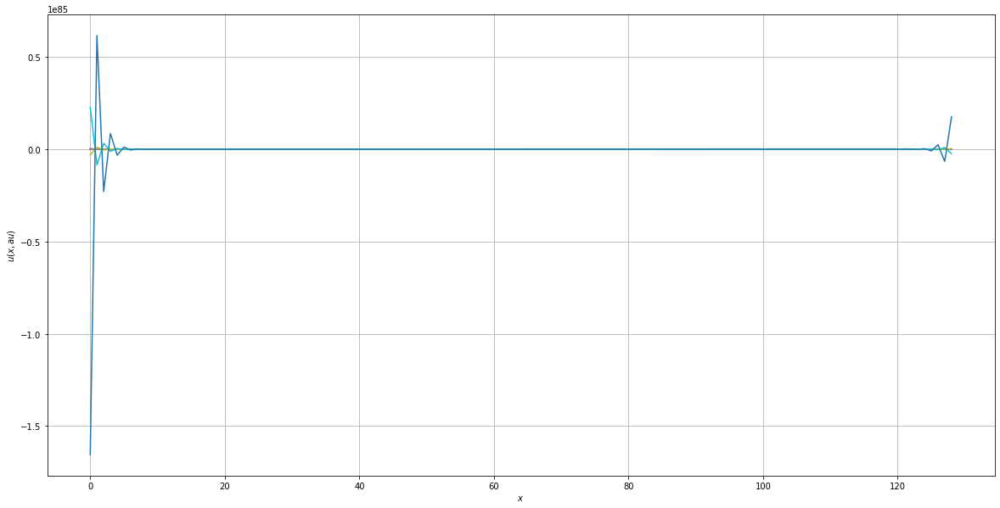

In [97]:
kappa = 0.01
ktne6 = ExplicitNeumann(CS, 100)

#### $\kappa$ = 0.1

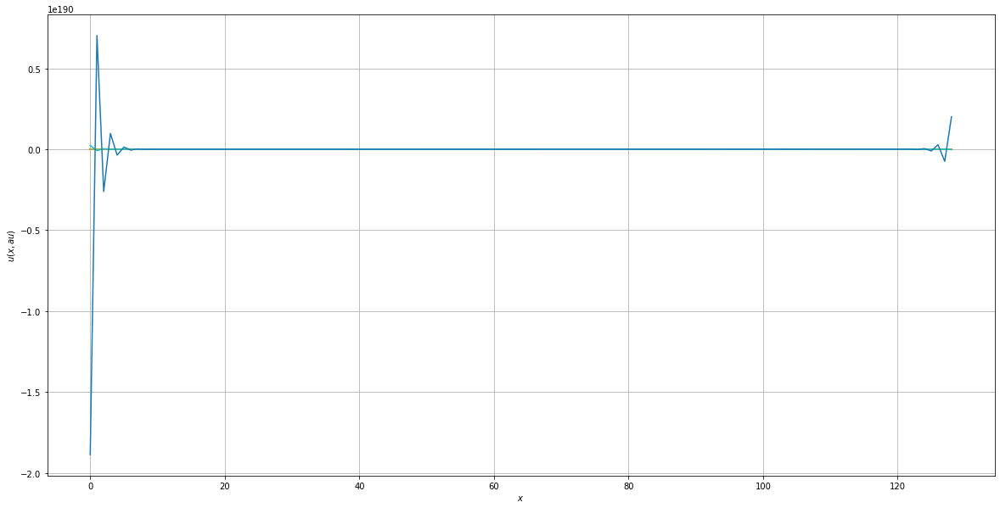

In [98]:
kappa = 0.1
ktne5 = ExplicitNeumann(CS, 100)

#### $\kappa$ = 1

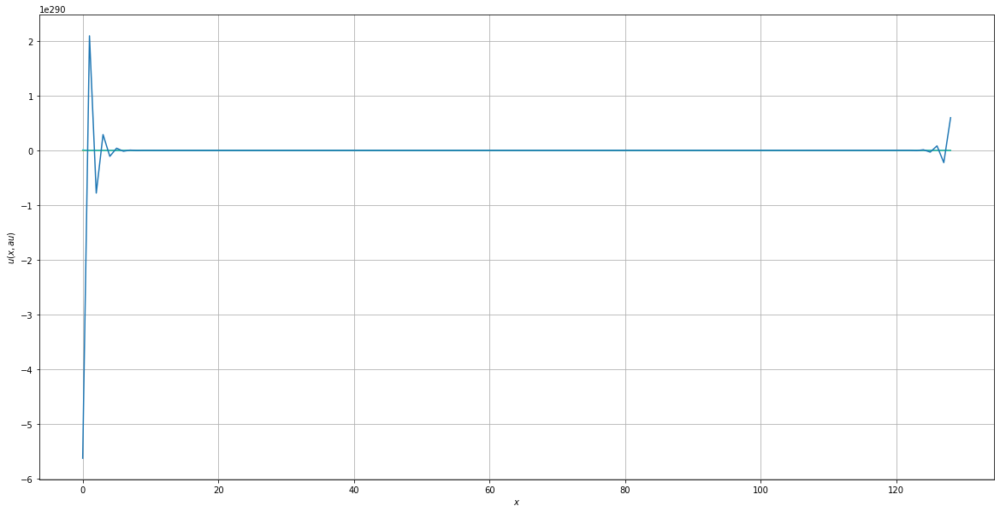

In [99]:
kappa = 1
ktne4 = ExplicitNeumann(CS, 100)

## Appendix 2: Comparison of Forward (Explicit) Method and Backward (Implicit) Method using Neumann Boundary Conditions

### Reset to Initial Parameters

In [100]:
a = 0 # "start"
b = 1 # "end"

kappa = 0.001 # how much we let the extreme points affect the smoothing
T = 1 # the length of the simulation - for how long are we running the smoothing / how long will the simulation take

### Function to Gather Resulting Forward (Explicit) and Backward (Implicit) Method Curves for Input Iterations M

In [101]:
def NeumannMethodUVals(Ticker, M):
    x = range(1,len(Stock(Ticker)[1])+1)
    uf = ExplicitNeumann(Ticker, M, False)
    ub = Neumann(Ticker, M, False)
    absdiff = np.absolute(uf-ub)
    
    return(pd.DataFrame({'x':x, 
                         'Explicit_Price':uf, 
                         'Implicit_Price':ub,
                         '| Explicit - Implicit |':absdiff}))

### Function to Plot the Forward (Explicit) and Backward (Implicit) Method Curves Generated from NeumannMethodUVals()

In [102]:
def compPlt(df, Ticker=0):    
    plt.figure(figsize=(20,10))  
    p = plt.grid(True)
    p = plt.xlabel('$x$')
    p = plt.ylabel('$u(x,\tau)$')
    
    if isinstance(Ticker, pd.DataFrame):
        u = Stock(Ticker)[1]
        p = plt.plot(df.x, u, 'k-', label='True Stock Price')
      
    p = plt.plot(df.x, df.Explicit_Price, 'r-', marker='o', label='Explicit Price')
    p = plt.plot(df.x, df.Implicit_Price, 'b-', marker='o', label='Implicit Price')
    p = plt.legend(loc='lower right', fontsize=18)
    
    return(p)

### Comparison of Forward (Explicit) and Backward (Implicit) Method Curves Generated for the same Stock with the same Number of Iterations

The prices calculated using the forward (explicit) and backward (implicit) methods match closely under identical parameter conditions where the explicit method is stable.

#### JC Penney Stock

x,Explicit_Price,Implicit_Price,| Explicit - Implicit |
1,1.15686,1.15704,0.000180398
11,1.13516,1.13493,0.000233935
21,1.02998,1.03034,0.000366868
31,0.779658,0.779564,9.46216e-05
41,0.631177,0.631185,7.89137e-06
51,0.672904,0.672564,0.000340205
61,0.879816,0.88049,0.000674642
71,0.905396,0.905026,0.000369457
81,0.966425,0.966517,9.15282e-05
91,1.02227,1.02236,8.26545e-05


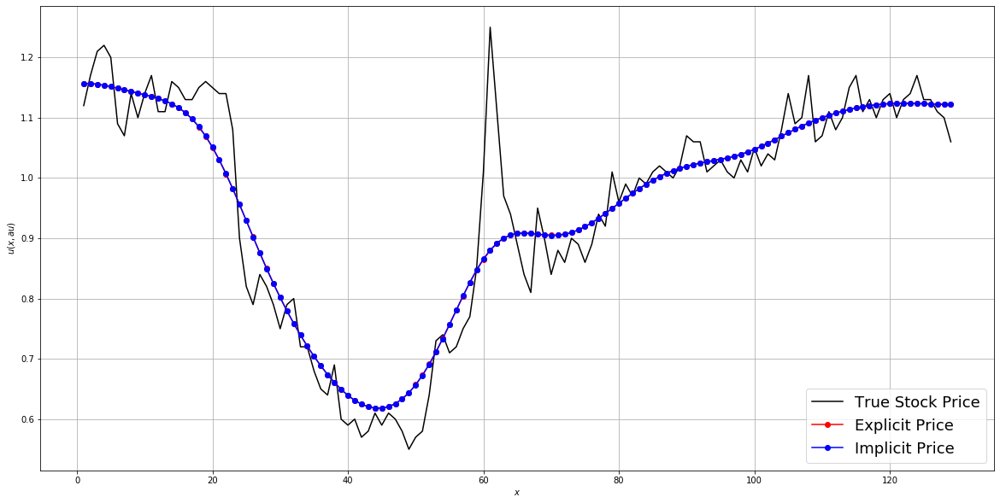

In [103]:
JCP_comp2 = NeumannMethodUVals(JCP, 100)
compPlt(JCP_comp2, JCP)
JCP_comp2.iloc[range(0,130,10)].style.hide_index()

#### Costco Stock

x,Explicit_Price,Implicit_Price,| Explicit - Implicit |
1,265.134,265.137,0.00366134
11,268.084,268.07,0.0142793
21,276.992,277.008,0.0164067
31,276.678,276.678,0.000272922
41,274.568,274.562,0.00562519
51,285.868,285.872,0.00412811
61,292.525,292.53,0.00514726
71,289.157,289.147,0.00960829
81,294.209,294.215,0.00585763
91,298.562,298.562,5.63949e-05


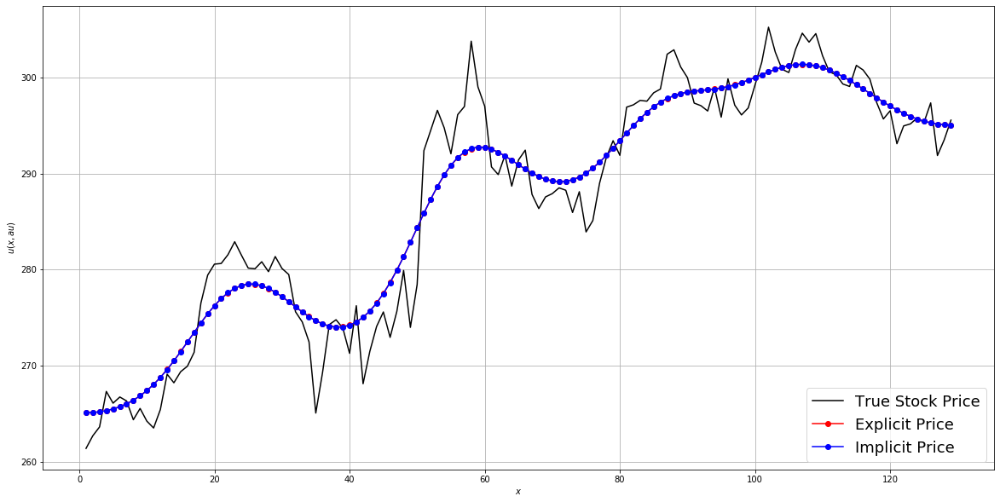

In [104]:
COST_comp2 = NeumannMethodUVals(COST, 100)
compPlt(COST_comp2, COST)
COST_comp2.iloc[range(0,130,10)].style.hide_index()

#### Apple Stock

x,Explicit_Price,Implicit_Price,| Explicit - Implicit |
1,198.634,198.632,0.00180014
11,200.761,200.764,0.00331734
21,204.405,204.397,0.00795133
31,205.48,205.497,0.0162175
41,204.696,204.69,0.00603006
51,208.725,208.714,0.011259
61,216.401,216.419,0.0185005
71,221.243,221.234,0.0096091
81,229.492,229.494,0.00180157
91,242.379,242.375,0.00378593


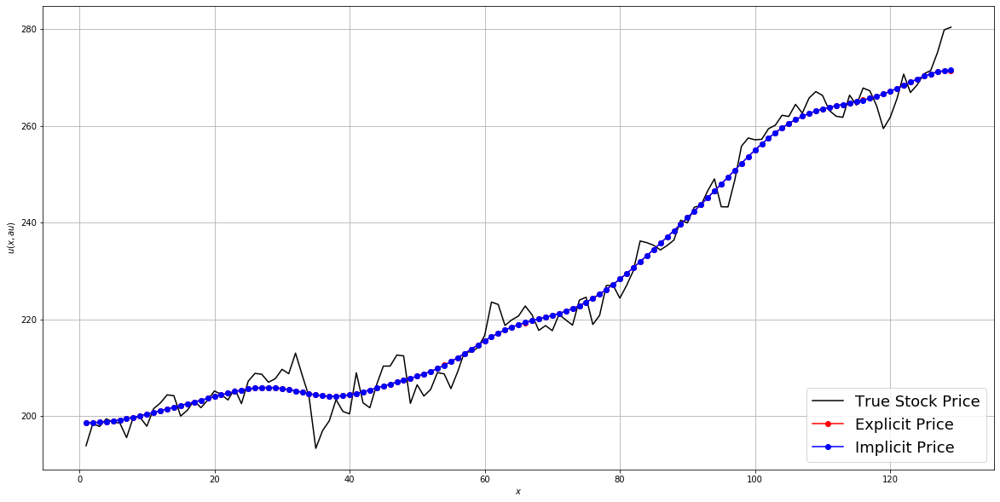

In [105]:
AAPL_comp2 = NeumannMethodUVals(AAPL, 100)
compPlt(AAPL_comp2, AAPL)
AAPL_comp2.iloc[range(0,130,10)].style.hide_index()

#### Tesla Stock

x,Explicit_Price,Implicit_Price,| Explicit - Implicit |
1,223.514,223.532,0.0178541
11,229.036,229.012,0.0238403
21,244.61,244.651,0.0405335
31,239.787,239.754,0.0329102
41,227.675,227.691,0.016117
51,222.873,222.845,0.027714
61,235.416,235.451,0.0348183
71,239.637,239.625,0.0119755
81,248.065,248.064,0.000570278
91,284.354,284.347,0.00761744


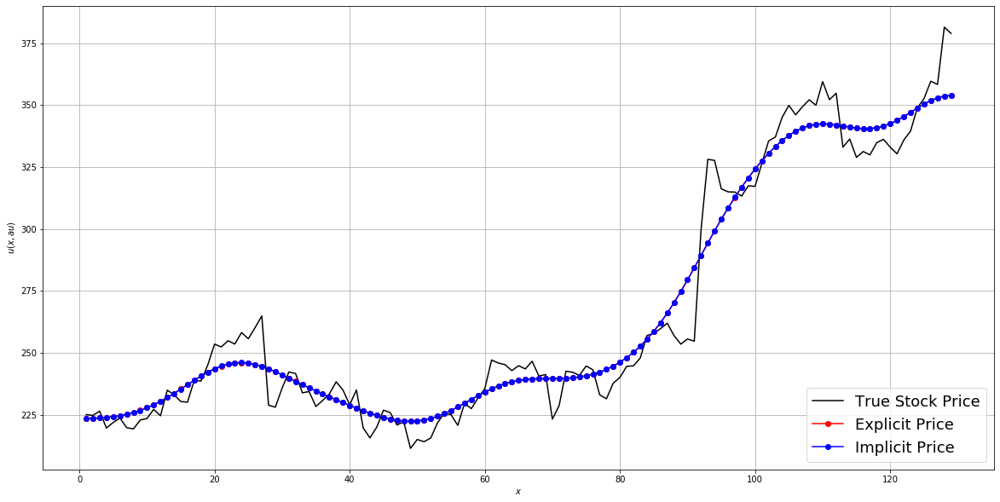

In [106]:
TSLA_comp2 = NeumannMethodUVals(TSLA, 100)
compPlt(TSLA_comp2, TSLA)
TSLA_comp2.iloc[range(0,130,10)].style.hide_index()

#### Credit Suisse Stock

x,Explicit_Price,Implicit_Price,| Explicit - Implicit |
1,11.7389,11.7385,0.000400561
11,11.9506,11.9508,0.000196587
21,12.2092,12.2094,0.000200056
31,11.9313,11.9314,0.000144416
41,11.4215,11.4212,0.000271825
51,11.6124,11.6112,0.00115831
61,12.474,12.4759,0.00186867
71,12.2977,12.2979,0.000147934
81,11.9144,11.9128,0.00152834
91,12.4436,12.4443,0.00067805


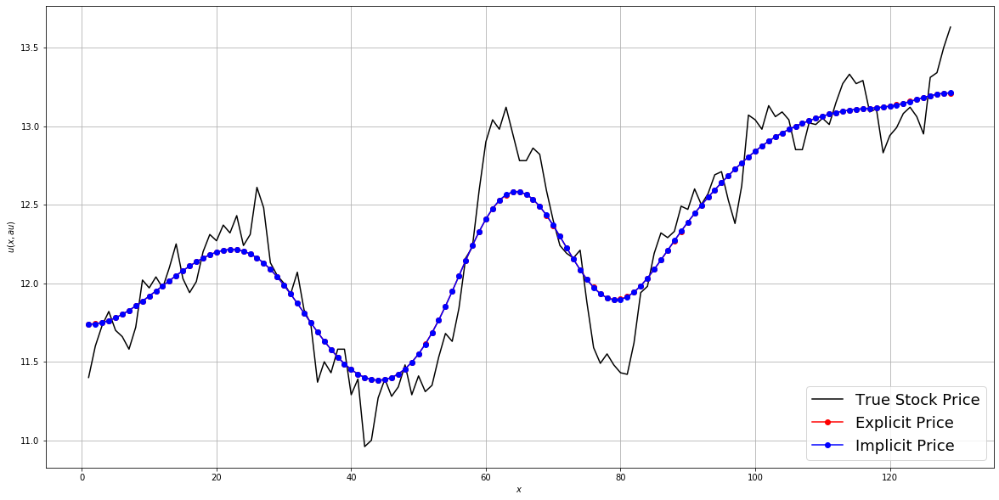

In [107]:
CS_comp2 = NeumannMethodUVals(CS, 100)
compPlt(CS_comp2, CS)
CS_comp2.iloc[range(0,130,10)].style.hide_index()

## Appendix 3: Attempt to Apply setUpDiagonals() and DiagSolver() for Backward (Implicit) Method with Neumann Boundary Conditions

Initially, the intention of this project was to implement the backward (implicit) method with Neumann boundary conditions using the same methodology as was used for the implicit method with Dirichlet boundary conditions. However, after many attempts and modifications to make this scheme work, the following implementaton ultimately still proved flawed.

As a result, implementation of the implicit method with Neumann boundary conditions using the numpy linalg solve function was kept in the main body of this project and the attempt to utilize diagonals, now named NeumannWithDiag(), was kept in this appendix. A discussion of the percieved flaws in implementation is also presented.

### Implementation

#### Setting Up the Diagonals Function
Set up the diagonals with Neumann boundary conditions for the implicit finite difference scheme. Specify the values at the boundary points by forcing the initial and final points of all 3 diagonals to the values in the first and last rows of the $A_{Implicit}$ matrix.

In [108]:
def setUpNeumannDiagonals(N, rho):
    
    # lower, diagonal, upper
    l = np.zeros((N,1))
    d = np.zeros((N,1))
    u = np.zeros((N,1))
    
    for i in range(N):
        l[i] = -rho
        d[i] = 1 + 2*rho
        u[i] = -rho
    
    # Neumann boundary contitions: 
    # Left
    u[0] = -4*rho
    d[0] = 1+(7/2)*rho
    l[0] = 0.5*rho
    # Right
    u[-1] = 0.5*rho
    d[-1] = 1+(7/2)*rho
    l[-1] = -4*rho
    
    return l, d, u

#### Tri-Diagonal Solver for Implicit Scheme with Neumann Boundary Conditions

Solves the system of equations that setUpDiagonals(N) gives us, using Gaussian elimination to create true upper, middle, and lower diagonals.

In [135]:
def NeumannDiagSolver(l, d, u, b):
    
    N = len(d)
    lL, dD, uU, bB = map(np.array, (l, d, u, b)) # copy arrays
    
    # Upward Gaussian Elimination
    tmp = lL[0]/uU[1]
    dD[0] = dD[0] - tmp*lL[1]
    uU[0] = uU[0] - tmp*dD[1]
    bB[0] = bB[0] - tmp*bB[1]
    
    # Downward Gaussian Elimination
    tmp = u[-1]/l[-2]
    lL[-1] = lL[-1] - tmp*dD[-2]
    dD[-1] = dD[-1] - tmp*uU[-2]
    bB[-1] = bB[-1] - tmp*bB[-2]
    
    for i in range(0, N):
        tmp = lL[i]/dD[i-1]
        dD[i] = dD[i] - tmp*uU[i-1] 
        bB[i] = bB[i] - tmp*bB[i-1]
    
    x = dD
    x[-1] = bB[-1]/dD[-1]
    
    for il in range(N-3, -1, -1):
        x[il] = (bB[il]-uU[il]*x[il+1])/dD[il]
    
    return x

#### NeumannWithDiag() Function

In [136]:
def NeumannWithDiag(Stock_or_Rate, M, plot=True):
    # M = number of simulations/iterations - if M is large enough it will go very little ahead in time for each iteration
    
    x, u = Stock(Stock_or_Rate) # Stock Prices
    res = np.zeros((len(u), M)) # Initialize matrix res, which holds the vector of stock prices generated for each iteration
    u0 = u[0]
    uend = u[-1]

    N = len(u) # set N equal to the length of the u-vector

    dX = (b-a)/N # the distance between each closing price - i.e. time between daily closing prices
    dT = T/M # the distance in time between each iteration

    rho = kappa*dT/(dX*dX)

    lL, dD, uU = setUpNeumannDiagonals(N, rho) 
    
    if plot:
        plt.figure(figsize=(20,10))  
        plt.plot(x, u)

    for j in range(M):
        u[0]=u0
        u[-1]=uend
        u = NeumannDiagSolver(lL, dD, uU, u)
        
        tmp = np.reshape(u, 129) # Shape the vector of stock prices generated for this iteration to (129,)
        res[:,j] = tmp # Store the vector of stock prices generated for this iteration in column j of matrix res
        
        if plot:
            plt.plot(x, u)
            plt.grid(True)
            plt.xlabel('$x$')
            plt.ylabel('$u(x,\tau)$')
    
    if plot:
        plt.show()
    
    return(res[:,M-1]) # Return the last column of matrix res (The vector of prices from the final iteration)

### Test Plot Output of NeumannWithDiag()

The below plots show sample plot output from NeumannWithDiag() for each stock using 1 iteration. Each appears to work as expected, with the end points not anchored to the end points of the true stock price curve. The following sections show how changing the number of iterations (M) and the kappa value $(\kappa)$ cause problems with this current implementation.

#### Reset to Initial Parameters

In [137]:
a = 0 # "start"
b = 1 # "end"

kappa = 0.001 # how much we let the extreme points affect the smoothing
T = 1 # the length of the simulation - for how long are we running the smoothing / how long will the simulation take

#### COSTCO stock

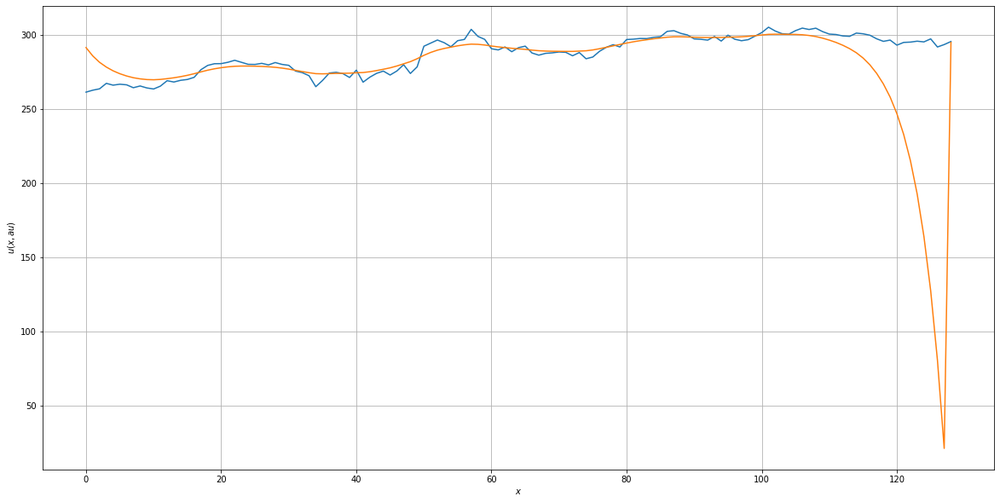

In [138]:
cost_nwd1 = NeumannWithDiag(COST, 1)

#### JC Penney Stock

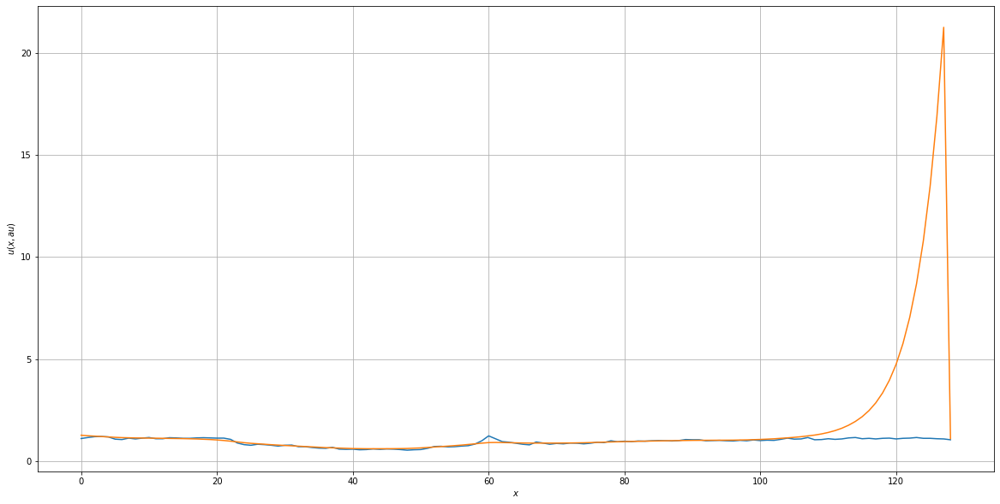

In [139]:
jcp_nwd1 = NeumannWithDiag(JCP, 1)

#### Apple Stock

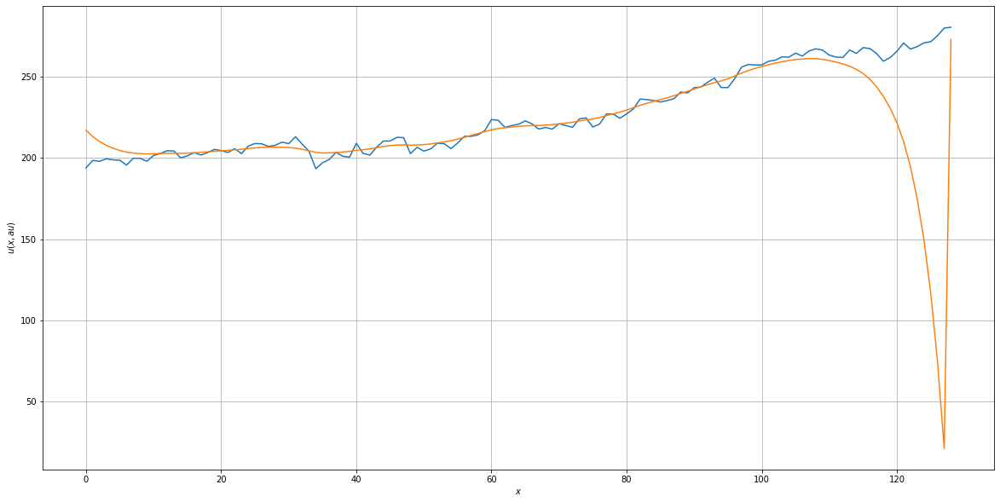

In [140]:
aapl_nwd1 = NeumannWithDiag(AAPL, 1)

#### Tesla Stock

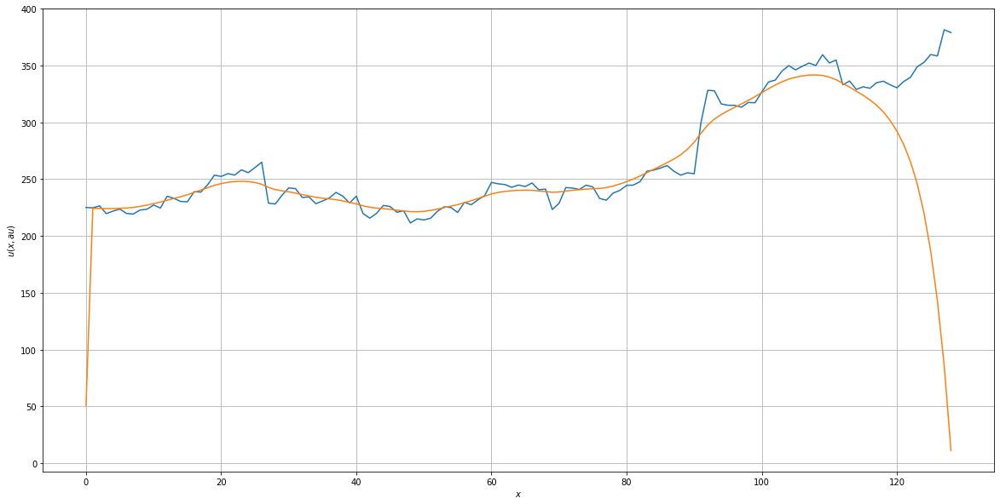

In [115]:
tsla_nwd1 = NeumannWithDiag(TSLA, 1)

#### Credit Suisse Stock

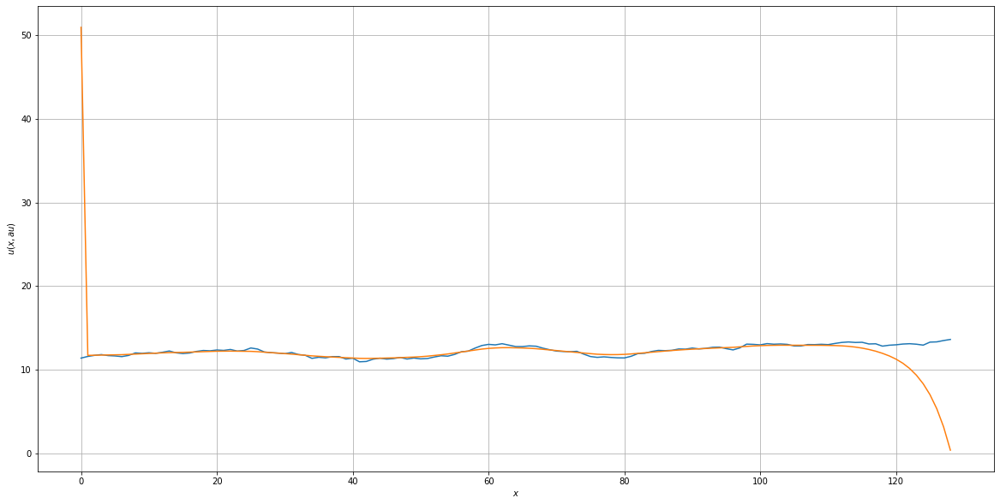

In [116]:
cs_nwd1 = NeumannWithDiag(CS, 1)

### Effect of Changing the Number of Iterations (M) for NeumannWithDiag()

As the number of iterations M used increases, all of the output points of NeumannWithDiag() appear to converge with the output of the implicit method function with Dirichlet boundary conditions. While this is to be expected for the middle points of the output curve, this should not be the case for the points close to the left and right boundaries of the output curves.

This behavior is demonstrated in the plots below, which include the

- The heat equation smoothing of Credit Suisse stock using NeumannWithDiag()
- Comparison plots of the NeumannWithDiag() and implicit method using Dirichlet boundary conditions output

under constant initial conditons for 1, 10, 25, 50, 100, 500, and 1000 iterations.

#### Function to Gather Resulting Dirichlet and Neumann Curves for Input Iterations M

In [117]:
def methodDiagUVals(Ticker, M):
    x = range(1,len(Stock(Ticker)[1])+1)
    ud = Dirichlet(Ticker, M, False)
    un = NeumannWithDiag(Ticker, M, False)
    absdiff = np.absolute(ud-un)
    
    return(pd.DataFrame({'x':x, 
                         'Dirichlet_Price':ud, 
                         'Neumann_Price':un,
                         '| Dirichlet - Neumann |':absdiff}))

#### Function to Plot the Dirichlet and Neumann Curves Generated from methodUVals()

In [118]:
def compPlt(df, Ticker=0):    
    plt.figure(figsize=(20,10))  
    p = plt.grid(True)
    p = plt.xlabel('$x$')
    p = plt.ylabel('$u(x,\tau)$')
    
    if isinstance(Ticker, pd.DataFrame):
        u = Stock(Ticker)[1]
        p = plt.plot(df.x, u, 'k-', label='True Stock Price')
      
    p = plt.plot(df.x, df.Dirichlet_Price, 'r-', marker='o', label='Dirichlet Price')
    p = plt.plot(df.x, df.Neumann_Price, 'b-', marker='o', label='Neumann Price')
    p = plt.legend(loc='lower right', fontsize=18)
    
    return(p)

#### M = 1

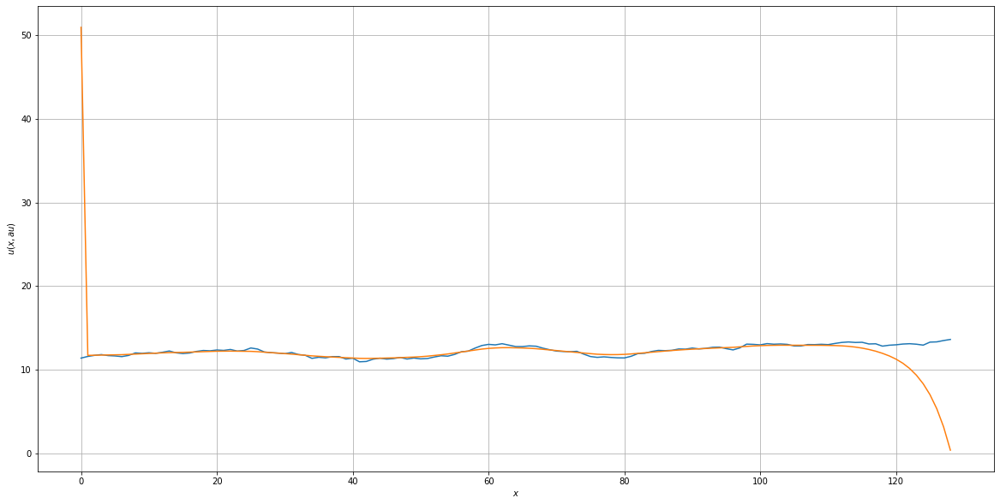

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,50.923,39.523
11,11.9368,11.9644,0.0275987
21,12.2185,12.2209,0.00239285
31,11.9359,11.9361,0.000207464
41,11.4069,11.407,1.79816e-05
51,11.5688,11.5688,1.49066e-06
61,12.5597,12.5597,6.59372e-07
71,12.2982,12.2982,9.15289e-06
81,11.8461,11.846,0.000105702
91,12.4693,12.4681,0.00121915


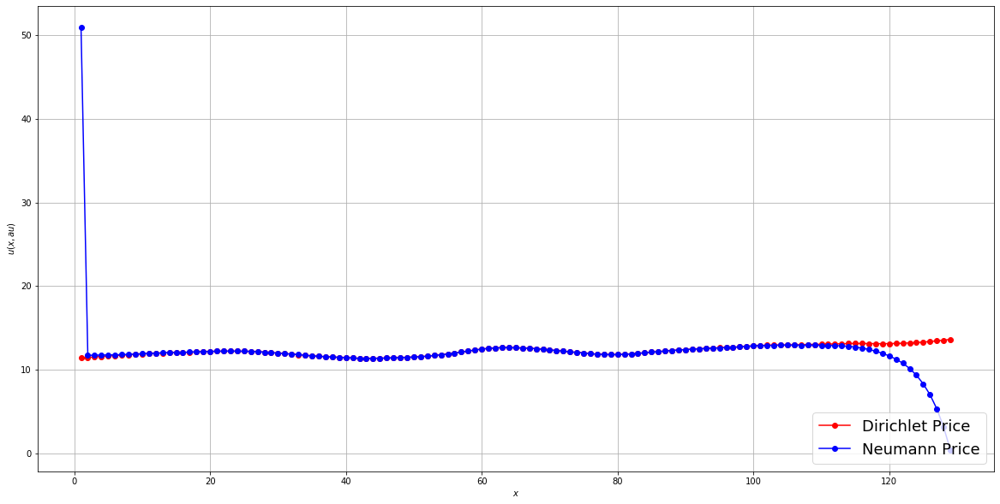

In [119]:
nwd1 = NeumannWithDiag(CS, 1)
nwd1_comp = methodDiagUVals(CS, 1)
compPlt(nwd1_comp)
nwd1_comp.iloc[range(0,130,10)].style.hide_index()

#### M = 10

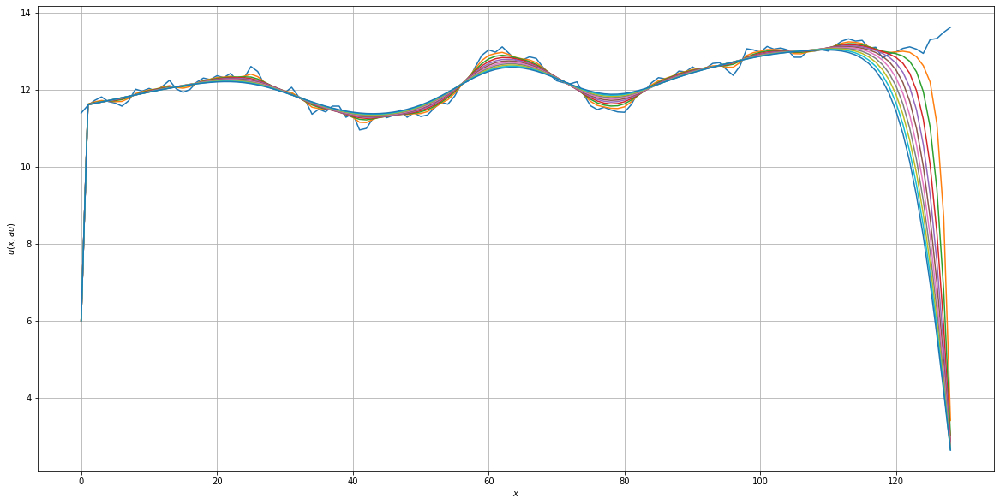

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,50.923,39.523
11,11.9368,11.9644,0.0275987
21,12.2185,12.2209,0.00239285
31,11.9359,11.9361,0.000207464
41,11.4069,11.407,1.79816e-05
51,11.5688,11.5688,1.49066e-06
61,12.5597,12.5597,6.59372e-07
71,12.2982,12.2982,9.15289e-06
81,11.8461,11.846,0.000105702
91,12.4693,12.4681,0.00121915


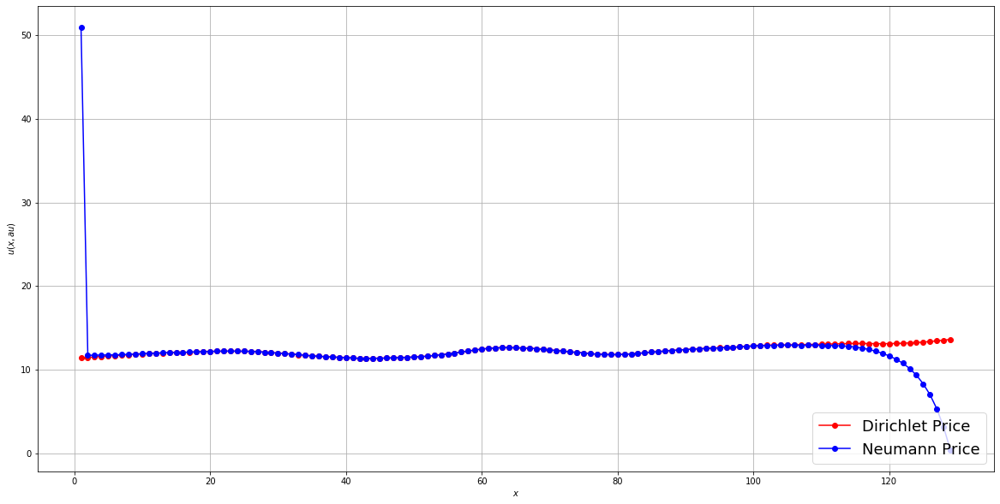

In [120]:
nwd3 = NeumannWithDiag(CS, 10)
nwd3_comp = methodDiagUVals(CS, 1)
compPlt(nwd3_comp)
nwd3_comp.iloc[range(0,130,10)].style.hide_index()

#### M = 25

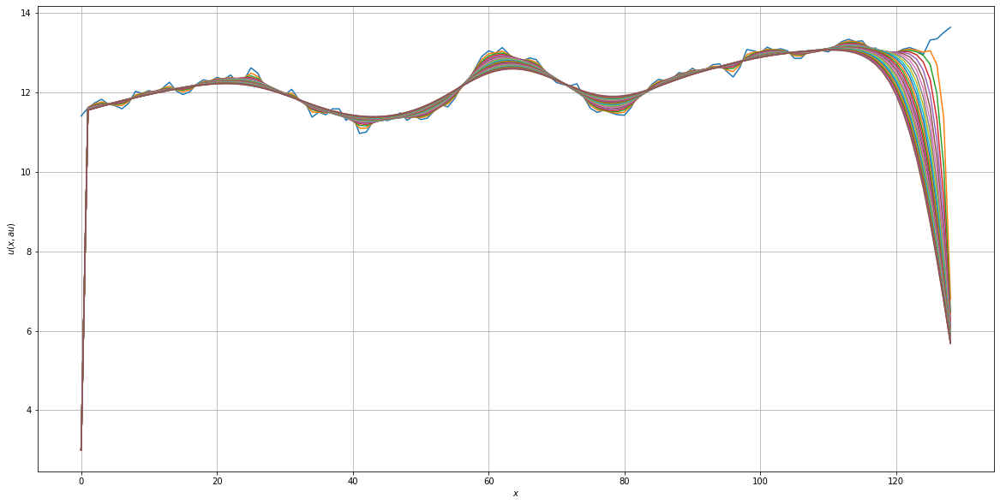

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,2.99692,8.40308
11,11.9294,11.9394,0.0100477
21,12.2079,12.2081,0.000122158
31,11.9309,11.9309,3.20069e-07
41,11.4227,11.4227,2.97234e-10
51,11.6119,11.6119,2.4869e-13
61,12.4749,12.4749,1.19016e-13
71,12.2975,12.2975,1.06581e-13
81,11.9138,11.9138,3.36424e-11
91,12.4446,12.4446,6.74601e-08


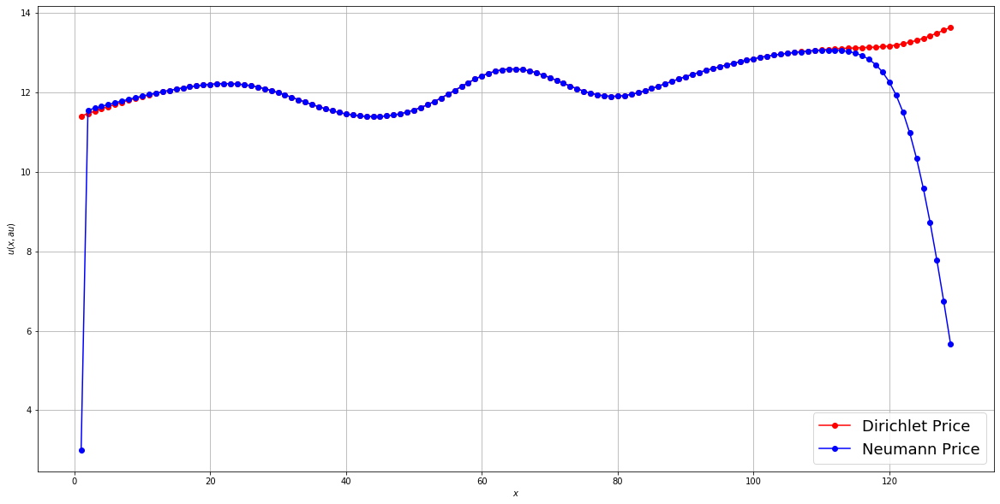

In [121]:
nwd4 = NeumannWithDiag(CS, 25)
nwd4_comp = methodDiagUVals(CS, 25)
compPlt(nwd4_comp)
nwd4_comp.iloc[range(0,130,10)].style.hide_index()

#### M = 50

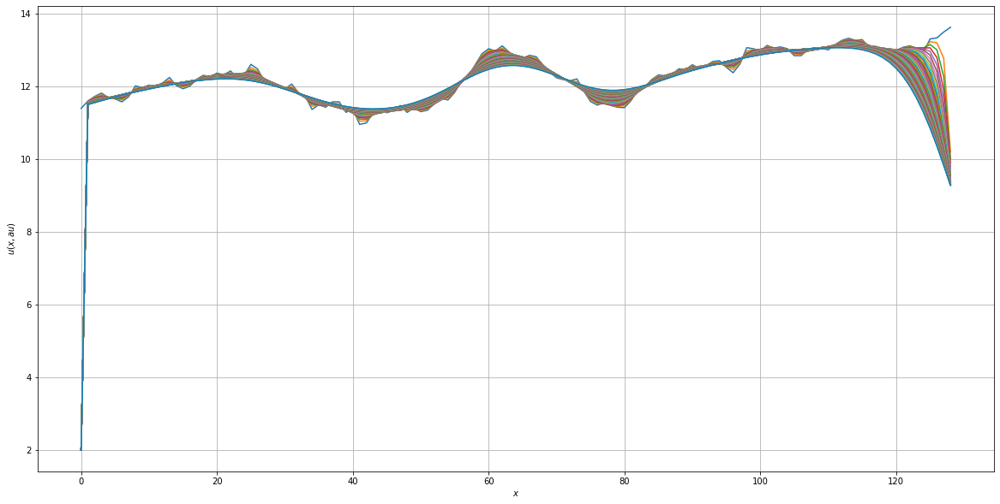

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,1.99846,9.40154
11,11.9294,11.9356,0.00628029
21,12.2078,12.2078,6.79402e-05
31,11.9308,11.9308,1.0806e-07
41,11.423,11.423,4.16485e-11
51,11.6131,11.6131,7.10543e-15
61,12.473,12.473,0
71,12.2973,12.2973,0
81,11.9153,11.9153,1.34293e-12
91,12.444,12.444,8.60757e-09


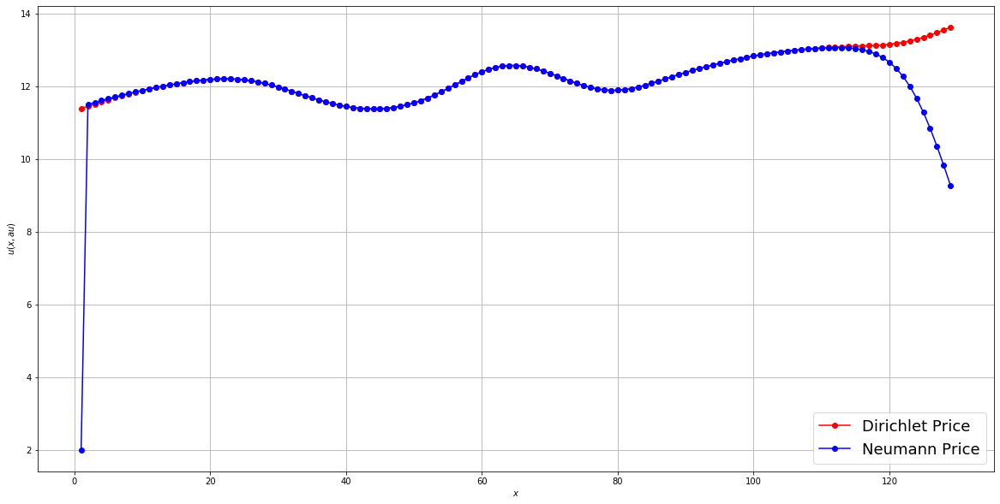

In [122]:
nwd5 = NeumannWithDiag(CS, 50)
nwd5_comp = methodDiagUVals(CS, 50)
compPlt(nwd5_comp)
nwd5_comp.iloc[range(0,130,10)].style.hide_index()

#### M = 100

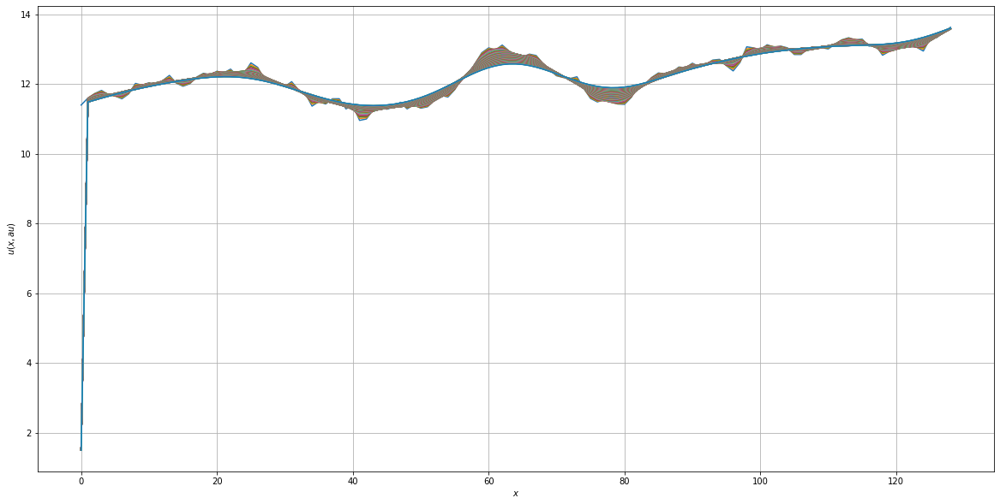

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,1.49923,9.90077
11,11.9294,11.9329,0.00358038
21,12.2077,12.2077,3.69253e-05
31,11.9307,11.9307,4.28865e-08
41,11.4232,11.4232,8.85159e-12
51,11.6137,11.6137,0
61,12.4721,12.4721,0
71,12.2972,12.2972,0
81,11.9161,11.9161,0
91,12.4436,12.4436,3.72804e-11


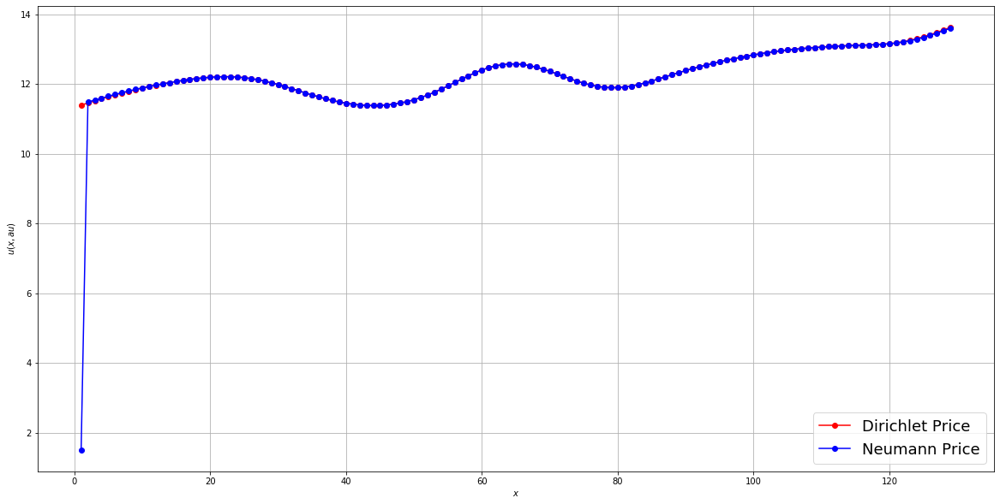

In [123]:
nwd6 = NeumannWithDiag(CS, 100)
nwd6_comp = methodDiagUVals(CS, 100)
compPlt(nwd6_comp)
nwd6_comp.iloc[range(0,130,10)].style.hide_index()

#### M = 500

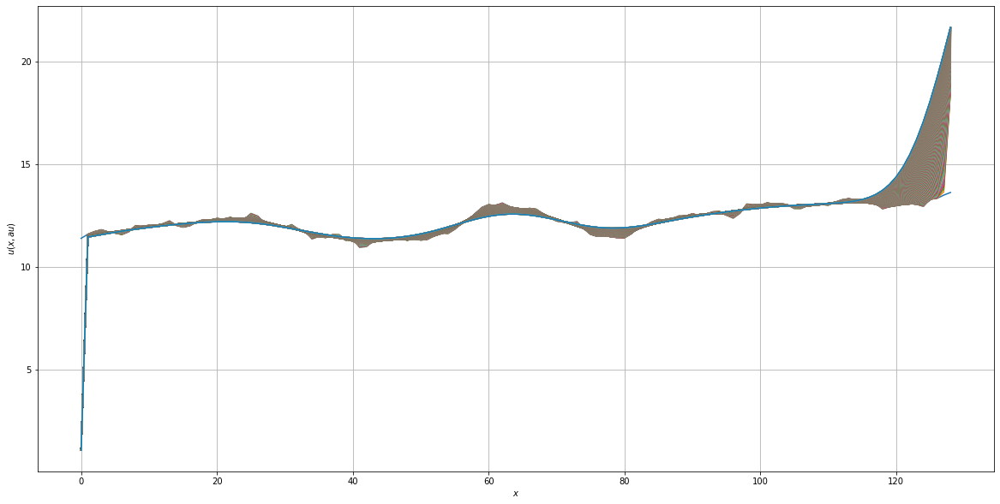

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,1.09985,10.3002
11,11.9293,11.9302,0.000804055
21,12.2076,12.2076,8.09437e-06
31,11.9306,11.9306,7.01306e-09
41,11.4233,11.4233,7.47846e-13
51,11.6141,11.6141,0
61,12.4713,12.4713,0
71,12.2972,12.2972,0
81,11.9167,11.9167,4.79616e-14
91,12.4433,12.4433,2.04068e-09


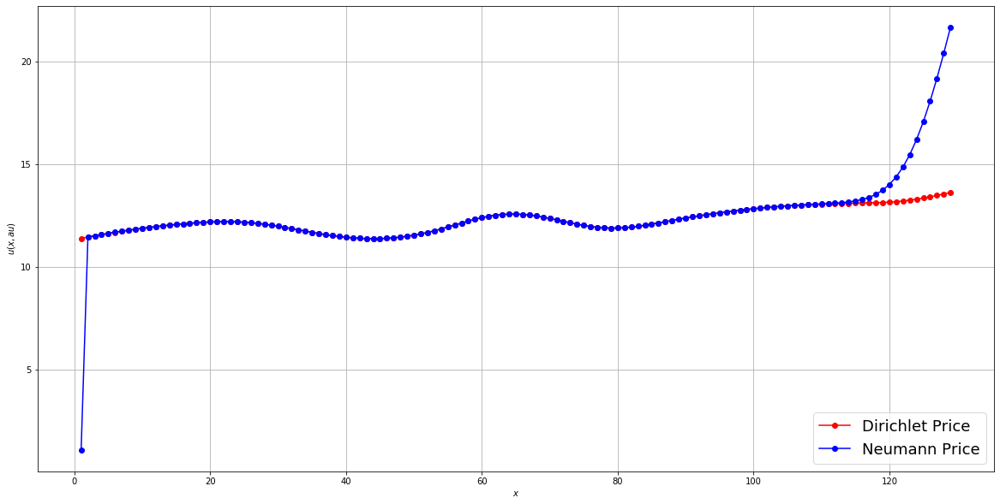

In [124]:
nwd7 = NeumannWithDiag(CS, 500)
nwd7_comp = methodDiagUVals(CS, 500)
compPlt(nwd7_comp)
nwd7_comp.iloc[range(0,130,10)].style.hide_index()

#### M = 1000

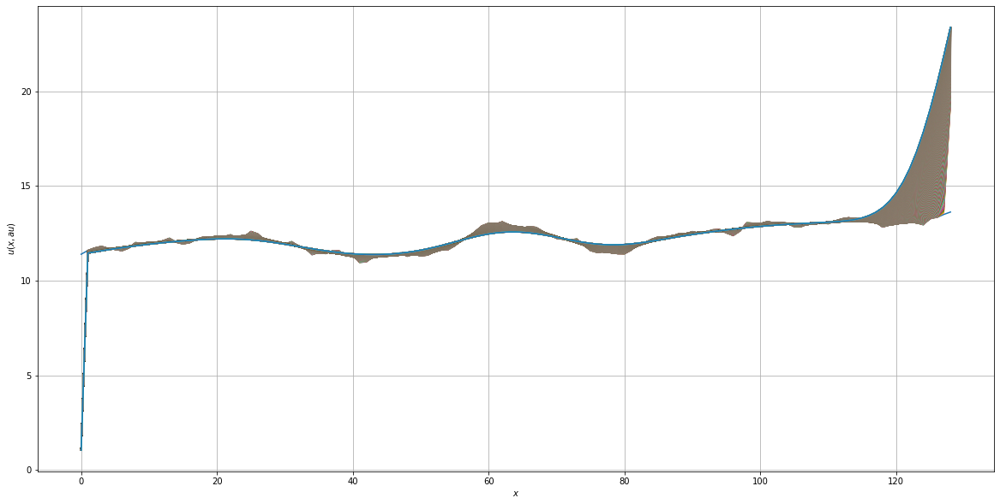

x,Dirichlet_Price,Neumann_Price,| Dirichlet - Neumann |
1,11.4,1.04992,10.3501
11,11.9293,11.9298,0.000408179
21,12.2076,12.2076,4.10254e-06
31,11.9306,11.9306,3.41675e-09
41,11.4233,11.4233,3.23297e-13
51,11.6142,11.6142,0
61,12.4712,12.4712,0
71,12.2972,12.2972,0
81,11.9168,11.9168,4.08562e-14
91,12.4433,12.4433,2.12626e-09


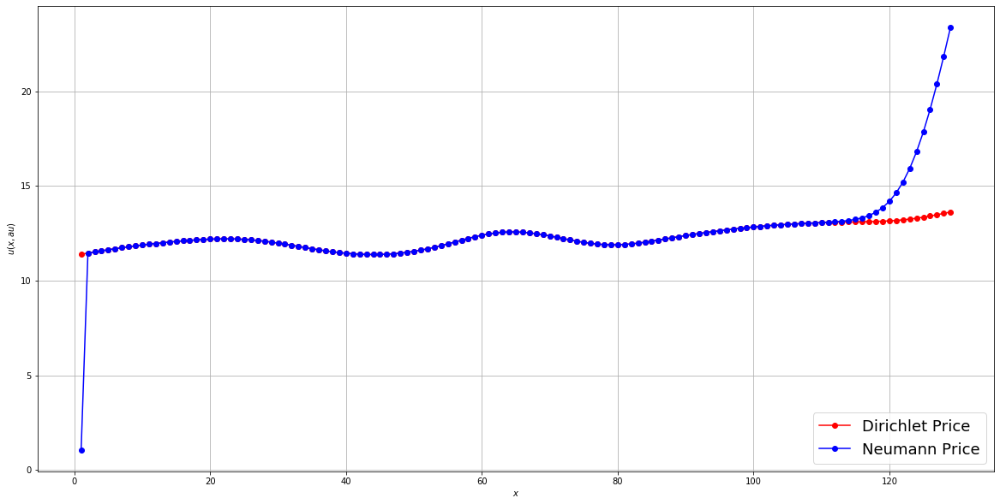

In [125]:
nwd8 = NeumannWithDiag(CS, 1000)
nwd8_comp = methodDiagUVals(CS, 1000)
compPlt(nwd8_comp)
nwd8_comp.iloc[range(0,130,10)].style.hide_index()

### Effect of Changing Kappa $\left( \kappa \right)$ for NeumannWithDiag()

As is expected, increasing the value of $\kappa$ enhances smoothing; however, using too large a $\kappa$ can cause too much smoothing to the point that the heat equation smoothing converges to a straight, horizontal line corresponding to the average price of the true price curve. On the other hand, using too small a value for $\kappa$ will lead to very little smoothing, to the point that the smoothed curve will converge to the true stock price curve.

What is unexpected in the following plots is how, when using large $\kappa$ values, the convergence to a straight, horizontal line corresponding to the average price of the true price curve takes multiple iterations rather than both beginning and ending on the average price of the true price curve.

This is shown in the plots below, which show the heat equation smoothing of Credit Suisse stock under constant initial conditons using $\kappa$ values of 0.00001, 0.0001, 0.001, 0.01, 0.1, 1, 10, 100, 1000.

#### $\kappa$ = 0.00001

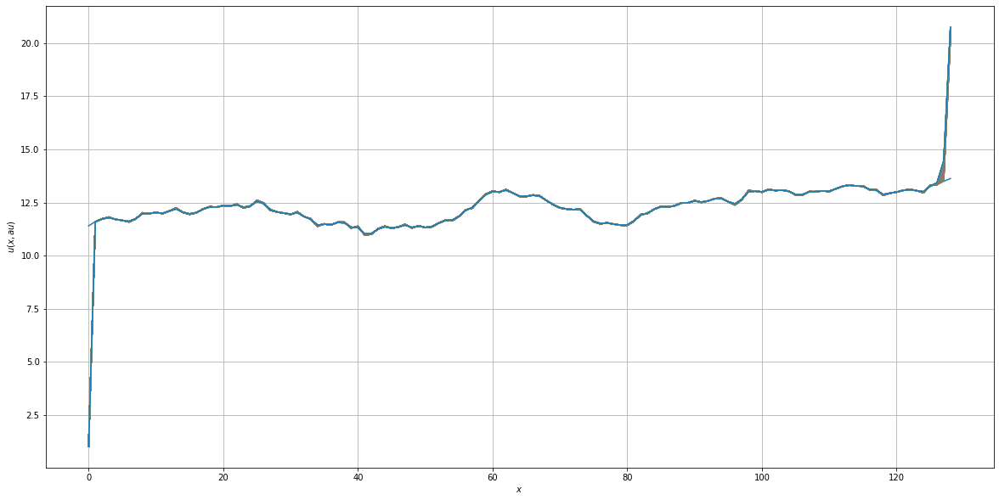

In [126]:
kappa = 0.00001
ktnd9 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 0.0001

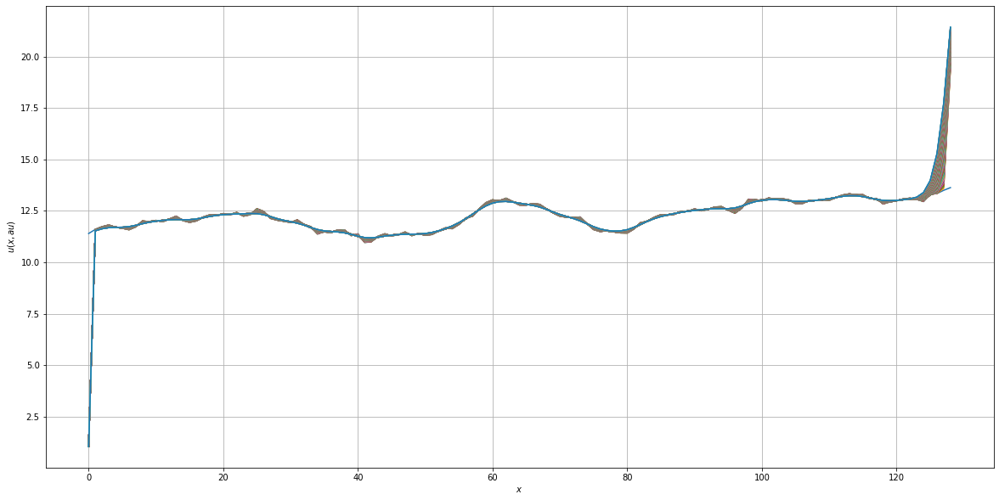

In [127]:
kappa = 0.0001
ktnd8 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 0.001

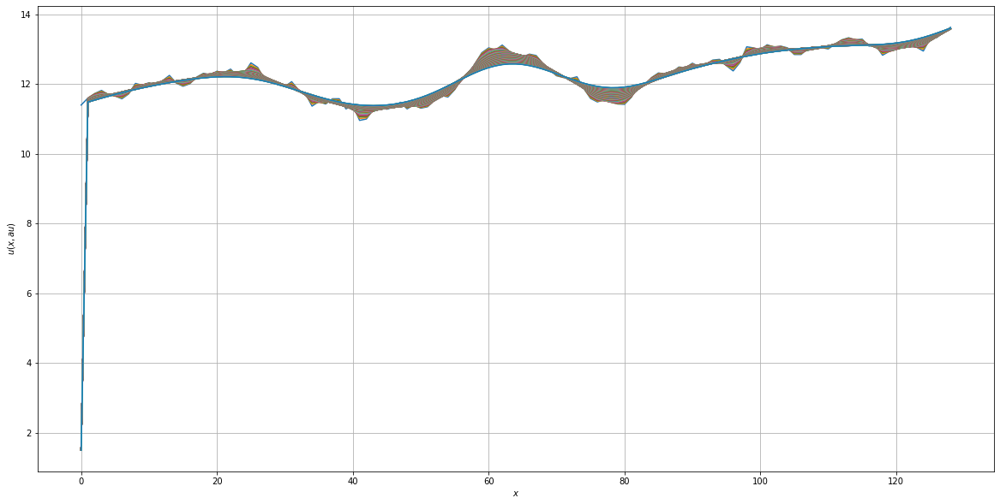

In [128]:
kappa = 0.001
ktnd7 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 0.01

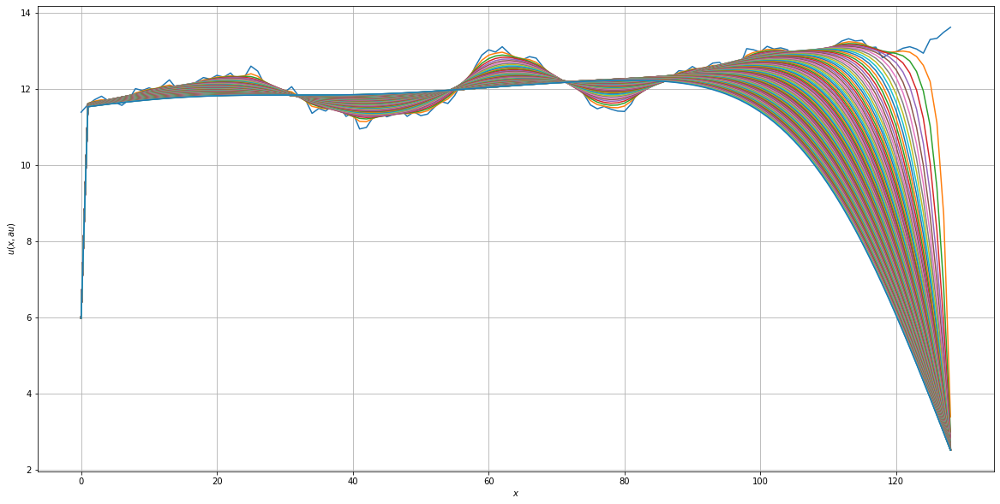

In [129]:
kappa = 0.01
ktnd6 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 0.1

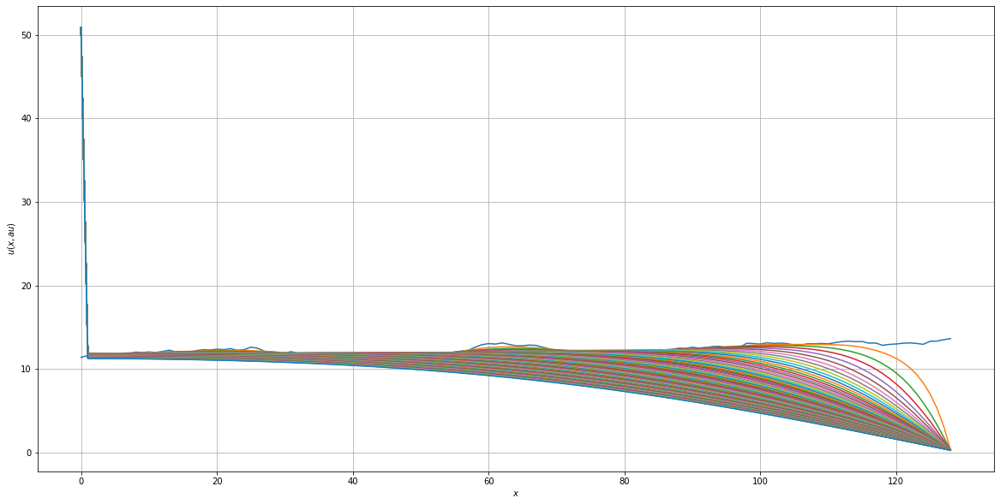

In [130]:
kappa = 0.1
ktnd5 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 1

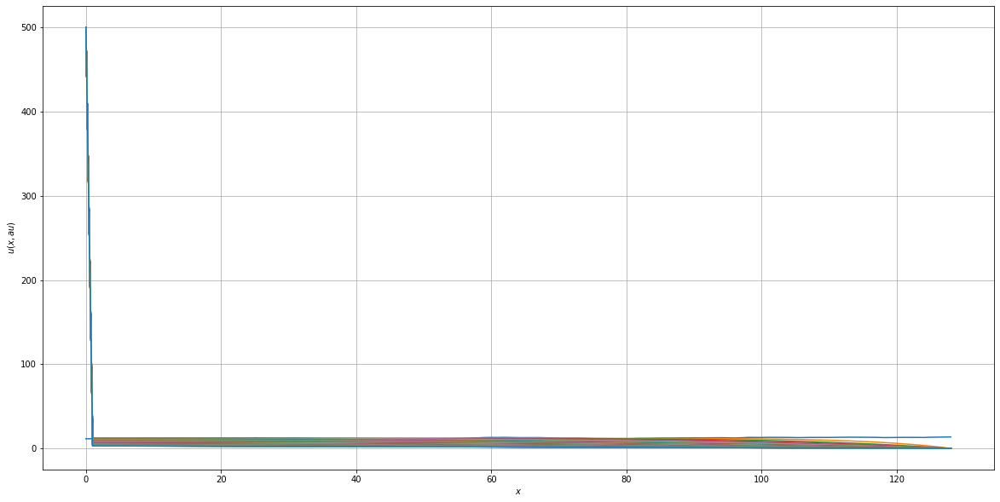

In [131]:
kappa = 1
ktnd4 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 10

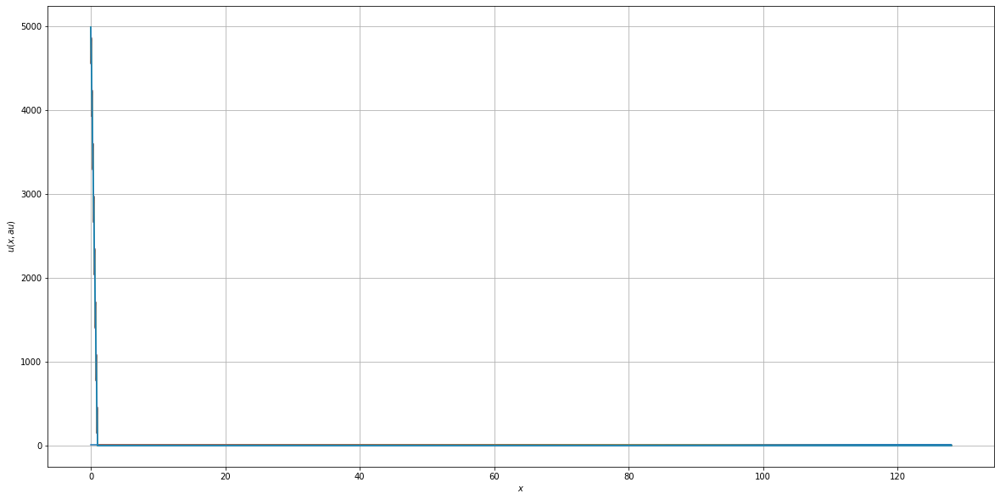

In [132]:
kappa = 10
ktnd3 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 100

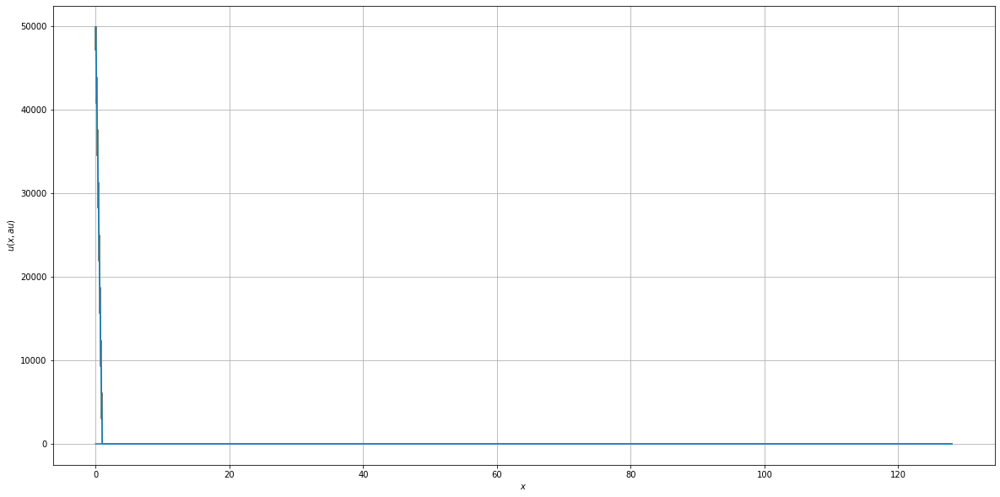

In [133]:
kappa = 100
ktnd2 = NeumannWithDiag(CS, 100)

#### $\kappa$ = 1000

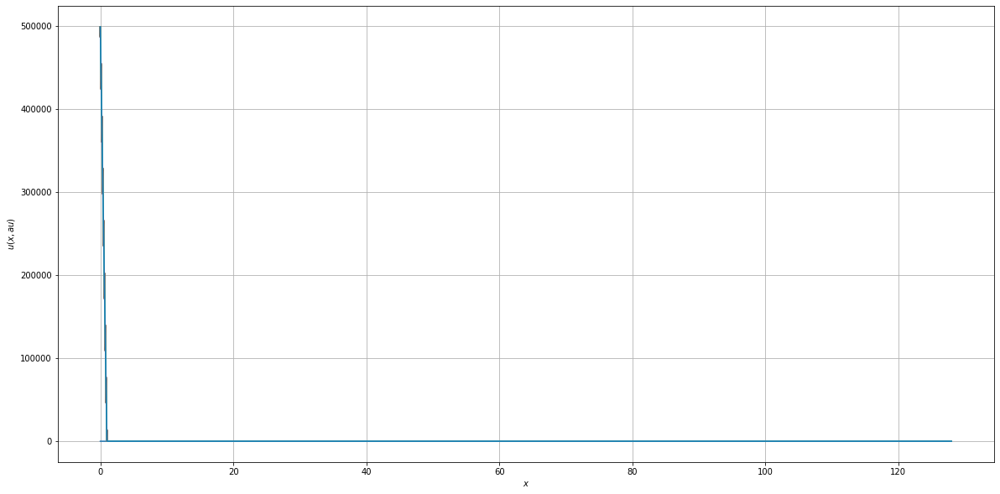

In [134]:
kappa = 1000
ktnd1 = NeumannWithDiag(CS, 100)